In [1]:
"""
📚 IMPORTING ALL REQUIRED LIBRARIES
====================================
These are the tools we'll use for data analysis
"""

# Data manipulation
import pandas as pd
import numpy as np

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

# Statistics
from scipy import stats
from scipy.stats import pearsonr, spearmanr

# Machine Learning (for encoding if needed)
from sklearn.preprocessing import LabelEncoder

# Utilities
import warnings
warnings.filterwarnings('ignore')

# Configuration
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', '{:.2f}'.format)

print("✅ All libraries imported successfully!")
print("="*70)


✅ All libraries imported successfully!


In [2]:
"""
📂 LOADING THE DATASET
======================
"""

# Load data
df = pd.read_csv('../data/raw/india_housing_prices.csv')

print("📊 DATASET LOADED SUCCESSFULLY!")
print("="*70)
print(f"\n📏 Dataset Size:")
print(f"   Total Properties: {df.shape[0]:,}")
print(f"   Total Features: {df.shape[1]}")
print(f"   Memory Usage: {df.memory_usage(deep=True).sum() / 1024**2:.2f} MB")

print("\n📋 First 5 Rows:")
display(df.head())

print("\n🔍 Column Names:")
for i, col in enumerate(df.columns, 1):
    print(f"   {i:2d}. {col}")


📊 DATASET LOADED SUCCESSFULLY!

📏 Dataset Size:
   Total Properties: 250,000
   Total Features: 23
   Memory Usage: 187.03 MB

📋 First 5 Rows:


,ID,State,City,Locality,Property_Type,BHK,Size_in_SqFt,Price_in_Lakhs,Price_per_SqFt,Year_Built,Furnished_Status,Floor_No,Total_Floors,Age_of_Property,Nearby_Schools,Nearby_Hospitals,Public_Transport_Accessibility,Parking_Space,Security,Amenities,Facing,Owner_Type,Availability_Status
0,1,Tamil Nadu,Chennai,Locality_84,Apartment,1,4740,489.76,0.10,1990,Furnished,22,1,35,10,3,High,No,No,"Playground, Gym, Garden, Pool, Clubhouse",West,Owner,Ready_to_Move
1,2,Maharashtra,Pune,Locality_490,Independent House,3,2364,195.52,0.08,2008,Unfurnished,21,20,17,8,1,Low,No,Yes,"Playground, Clubhouse, Pool, Gym, Garden",North,Builder,Under_Construction
2,3,Punjab,Ludhiana,Locality_167,Apartment,2,3642,183.79,0.05,1997,Semi-furnished,19,27,28,9,8,Low,Yes,No,"Clubhouse, Pool, Playground, Gym",South,Broker,Ready_to_Move
3,4,Rajasthan,Jodhpur,Locality_393,Independent House,2,2741,300.29,0.11,1991,Furnished,21,26,34,5,7,High,Yes,Yes,"Playground, Clubhouse, Gym, Pool, Garden",North,Builder,Ready_to_Move
4,5,Rajasthan,Jaipur,Locality_466,Villa,4,4823,182.90,0.04,2002,Semi-furnished,3,2,23,4,9,Low,No,Yes,"Playground, Garden, Gym, Pool, Clubhouse",East,Builder,Ready_to_Move



🔍 Column Names:
    1. ID
    2. State
    3. City
    4. Locality
    5. Property_Type
    6. BHK
    7. Size_in_SqFt
    8. Price_in_Lakhs
    9. Price_per_SqFt
   10. Year_Built
   11. Furnished_Status
   12. Floor_No
   13. Total_Floors
   14. Age_of_Property
   15. Nearby_Schools
   16. Nearby_Hospitals
   17. Public_Transport_Accessibility
   18. Parking_Space
   19. Security
   20. Amenities
   21. Facing
   22. Owner_Type
   23. Availability_Status


In [3]:
"""
🔍 DATA OVERVIEW
================
"""

print("📊 DATA TYPES AND MISSING VALUES")
print("="*70)
print(df.info())

print("\n❌ MISSING VALUES SUMMARY:")
missing = df.isnull().sum()
if missing.sum() > 0:
    missing_df = pd.DataFrame({
        'Column': missing.index,
        'Missing_Count': missing.values,
        'Percentage': (missing.values / len(df) * 100).round(2)
    })
    print(missing_df[missing_df['Missing_Count'] > 0].to_string(index=False))
else:
    print("✅ No missing values!")

print(f"\n🔄 Duplicate Rows: {df.duplicated().sum()}")


📊 DATA TYPES AND MISSING VALUES
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 23 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   ID                              250000 non-null  int64  
 1   State                           250000 non-null  object 
 2   City                            250000 non-null  object 
 3   Locality                        250000 non-null  object 
 4   Property_Type                   250000 non-null  object 
 5   BHK                             250000 non-null  int64  
 6   Size_in_SqFt                    250000 non-null  int64  
 7   Price_in_Lakhs                  250000 non-null  float64
 8   Price_per_SqFt                  250000 non-null  float64
 9   Year_Built                      250000 non-null  int64  
 10  Furnished_Status                250000 non-null  object 
 11  Floor_No                        250000 non-nul

In [4]:
"""
🎨 CREATING DERIVED FEATURES
============================
We need some calculated columns for our analysis
"""

# Calculate Price per Sq Ft if not exists
if 'Price_per_SqFt' not in df.columns:
    df['Price_per_SqFt'] = (df['Price_in_Lakhs'] * 100000) / df['Size_in_SqFt']
    print("✅ Created: Price_per_SqFt")

# Calculate Age of Property if not exists
if 'Age_of_Property' not in df.columns:
    current_year = 2025
    df['Age_of_Property'] = current_year - df['Year_Built']
    print("✅ Created: Age_of_Property")

print("\n📊 New Columns Created:")
print(f"   - Price_per_SqFt (Range: ₹{df['Price_per_SqFt'].min():.2f} - ₹{df['Price_per_SqFt'].max():.2f})")
print(f"   - Age_of_Property (Range: {df['Age_of_Property'].min():.0f} - {df['Age_of_Property'].max():.0f} years)")



📊 New Columns Created:
   - Price_per_SqFt (Range: ₹0.00 - ₹0.99)
   - Age_of_Property (Range: 2 - 35 years)


QUESTION 1: DISTRIBUTION OF PROPERTY PRICES

📊 PRICE STATISTICS:
----------------------------------------------------------------------
Count          : ₹250,000.00 Lakhs
Mean           : ₹254.59 Lakhs
Median         : ₹253.87 Lakhs
Mode           : ₹40.22 Lakhs
Std Dev        : ₹141.35 Lakhs
Min            : ₹10.00 Lakhs
Max            : ₹500.00 Lakhs
Range          : ₹490.00 Lakhs
Q1 (25%)       : ₹132.55 Lakhs
Q3 (75%)       : ₹376.88 Lakhs
IQR            : ₹244.33 Lakhs
Skewness       : ₹0.01 Lakhs
Kurtosis       : ₹-1.20 Lakhs

💡 INTERPRETATION:
   🔹 SYMMETRIC: Fairly even distribution


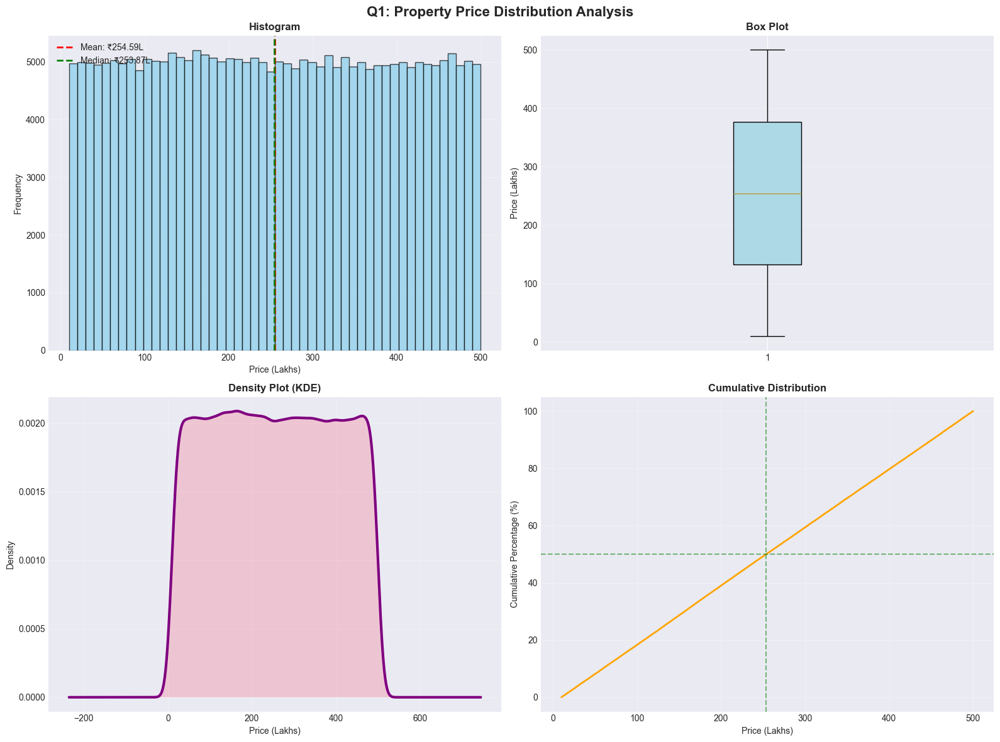


📊 PRICE RANGE DISTRIBUTION:
Price_Range
0-50L        20307
50-100L      25432
100-150L     25824
150-200L     25954
200-300L     50864
300L+       101619
Name: count, dtype: int64


In [5]:
# Question 1: What is the distribution of property prices?
print("="*70)
print("QUESTION 1: DISTRIBUTION OF PROPERTY PRICES")
print("="*70)

# Calculate statistics
prices = df['Price_in_Lakhs']

stats_dict = {
    'Count': len(prices),
    'Mean': prices.mean(),
    'Median': prices.median(),
    'Mode': prices.mode()[0] if len(prices.mode()) > 0 else 'N/A',
    'Std Dev': prices.std(),
    'Min': prices.min(),
    'Max': prices.max(),
    'Range': prices.max() - prices.min(),
    'Q1 (25%)': prices.quantile(0.25),
    'Q3 (75%)': prices.quantile(0.75),
    'IQR': prices.quantile(0.75) - prices.quantile(0.25),
    'Skewness': prices.skew(),
    'Kurtosis': prices.kurtosis()
}

print("\n📊 PRICE STATISTICS:")
print("-"*70)
for key, value in stats_dict.items():
    if isinstance(value, (int, float)):
        print(f"{key:15s}: ₹{value:,.2f} Lakhs")
    else:
        print(f"{key:15s}: {value}")

# Interpretation
print("\n💡 INTERPRETATION:")
if stats_dict['Mean'] > stats_dict['Median'] * 1.1:
    print("   🔹 RIGHT-SKEWED: More cheap properties, some very expensive ones")
elif stats_dict['Mean'] < stats_dict['Median'] * 0.9:
    print("   🔹 LEFT-SKEWED: More expensive properties, some very cheap ones")
else:
    print("   🔹 SYMMETRIC: Fairly even distribution")

# Create visualizations
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Q1: Property Price Distribution Analysis', fontsize=16, fontweight='bold')

# Histogram
axes[0, 0].hist(prices, bins=50, color='skyblue', edgecolor='black', alpha=0.7)
axes[0, 0].axvline(stats_dict['Mean'], color='red', linestyle='--', linewidth=2, label=f"Mean: ₹{stats_dict['Mean']:.2f}L")
axes[0, 0].axvline(stats_dict['Median'], color='green', linestyle='--', linewidth=2, label=f"Median: ₹{stats_dict['Median']:.2f}L")
axes[0, 0].set_title('Histogram', fontweight='bold')
axes[0, 0].set_xlabel('Price (Lakhs)')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Box Plot
bp = axes[0, 1].boxplot(prices, vert=True, patch_artist=True)
bp['boxes'][0].set_facecolor('lightblue')
axes[0, 1].set_title('Box Plot', fontweight='bold')
axes[0, 1].set_ylabel('Price (Lakhs)')
axes[0, 1].grid(axis='y', alpha=0.3)

# Density Plot
prices.plot(kind='kde', ax=axes[1, 0], color='purple', linewidth=3)
axes[1, 0].fill_between(axes[1, 0].lines[0].get_xdata(), axes[1, 0].lines[0].get_ydata(), alpha=0.3)
axes[1, 0].set_title('Density Plot (KDE)', fontweight='bold')
axes[1, 0].set_xlabel('Price (Lakhs)')
axes[1, 0].grid(alpha=0.3)

# Cumulative Distribution
sorted_prices = np.sort(prices)
cumulative = np.arange(1, len(sorted_prices) + 1) / len(sorted_prices) * 100
axes[1, 1].plot(sorted_prices, cumulative, linewidth=2, color='orange')
axes[1, 1].axhline(50, color='green', linestyle='--', alpha=0.5)
axes[1, 1].axvline(stats_dict['Median'], color='green', linestyle='--', alpha=0.5)
axes[1, 1].set_title('Cumulative Distribution', fontweight='bold')
axes[1, 1].set_xlabel('Price (Lakhs)')
axes[1, 1].set_ylabel('Cumulative Percentage (%)')
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Price ranges
price_bins = [0, 50, 100, 150, 200, 300, prices.max()]
price_labels = ['0-50L', '50-100L', '100-150L', '150-200L', '200-300L', '300L+']
df['Price_Range'] = pd.cut(prices, bins=price_bins, labels=price_labels)

print("\n📊 PRICE RANGE DISTRIBUTION:")
print(df['Price_Range'].value_counts().sort_index())


QUESTION 2: DISTRIBUTION OF PROPERTY SIZES

📊 SIZE STATISTICS:
----------------------------------------------------------------------
Count          : 250,000.00 Sq Ft
Mean           : 2,749.81 Sq Ft
Median         : 2,747.00 Sq Ft
Std Dev        : 1,300.61 Sq Ft
Min            : 500.00 Sq Ft
Max            : 5,000.00 Sq Ft
Q1 (25%)       : 1,623.00 Sq Ft
Q3 (75%)       : 3,874.00 Sq Ft
IQR            : 2,251.00 Sq Ft


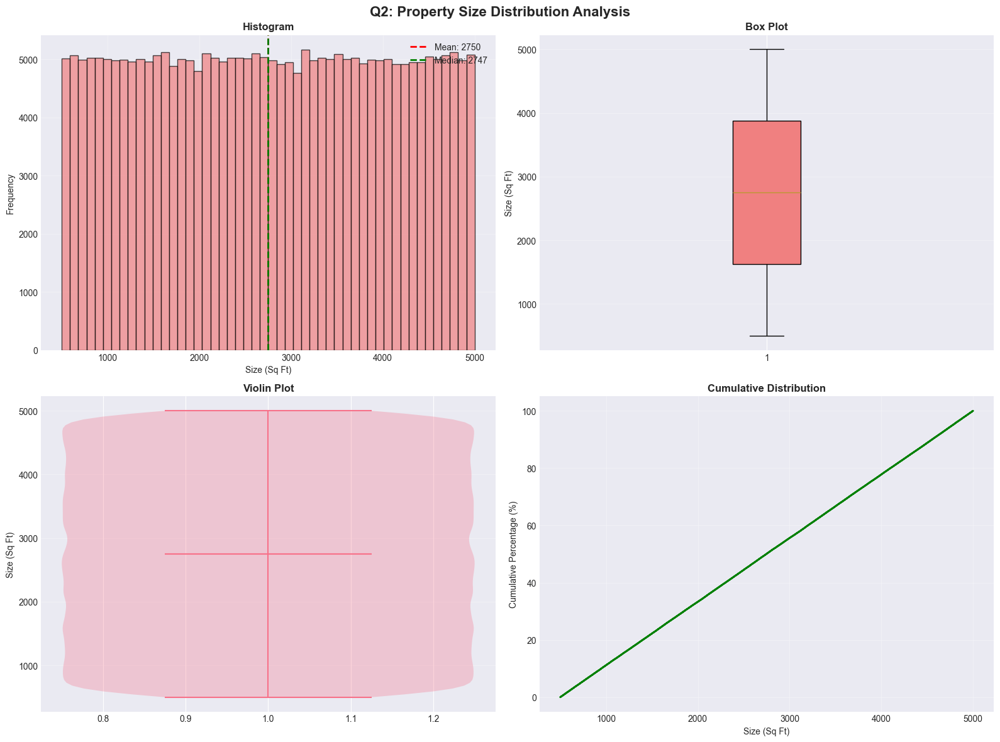


📊 SIZE CATEGORY DISTRIBUTION:
Size_Category
<1000         27997
1000-1500     27644
1500-2000     27682
2000-3000     55664
3000+        111013
Name: count, dtype: int64


In [7]:
# Question 2: What is the distribution of property sizes?

print("="*70)
print("QUESTION 2: DISTRIBUTION OF PROPERTY SIZES")
print("="*70)

# Calculate statistics
sizes = df['Size_in_SqFt']

stats_dict = {
    'Count': len(sizes),
    'Mean': sizes.mean(),
    'Median': sizes.median(),
    'Std Dev': sizes.std(),
    'Min': sizes.min(),
    'Max': sizes.max(),
    'Q1 (25%)': sizes.quantile(0.25),
    'Q3 (75%)': sizes.quantile(0.75),
    'IQR': sizes.quantile(0.75) - sizes.quantile(0.25)
}

print("\n📊 SIZE STATISTICS:")
print("-"*70)
for key, value in stats_dict.items():
    print(f"{key:15s}: {value:,.2f} Sq Ft")

# Visualizations
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle('Q2: Property Size Distribution Analysis', fontsize=16, fontweight='bold')

# Histogram
axes[0, 0].hist(sizes, bins=50, color='lightcoral', edgecolor='black', alpha=0.7)
axes[0, 0].axvline(stats_dict['Mean'], color='red', linestyle='--', linewidth=2, label=f"Mean: {stats_dict['Mean']:.0f}")
axes[0, 0].axvline(stats_dict['Median'], color='green', linestyle='--', linewidth=2, label=f"Median: {stats_dict['Median']:.0f}")
axes[0, 0].set_title('Histogram', fontweight='bold')
axes[0, 0].set_xlabel('Size (Sq Ft)')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

# Box Plot
bp = axes[0, 1].boxplot(sizes, vert=True, patch_artist=True)
bp['boxes'][0].set_facecolor('lightcoral')
axes[0, 1].set_title('Box Plot', fontweight='bold')
axes[0, 1].set_ylabel('Size (Sq Ft)')
axes[0, 1].grid(axis='y', alpha=0.3)

# Violin Plot
parts = axes[1, 0].violinplot([sizes], vert=True, showmeans=True, showmedians=True)
axes[1, 0].set_title('Violin Plot', fontweight='bold')
axes[1, 0].set_ylabel('Size (Sq Ft)')
axes[1, 0].grid(axis='y', alpha=0.3)

# Cumulative Distribution
sorted_sizes = np.sort(sizes)
cumulative = np.arange(1, len(sorted_sizes) + 1) / len(sorted_sizes) * 100
axes[1, 1].plot(sorted_sizes, cumulative, linewidth=2, color='green')
axes[1, 1].set_title('Cumulative Distribution', fontweight='bold')
axes[1, 1].set_xlabel('Size (Sq Ft)')
axes[1, 1].set_ylabel('Cumulative Percentage (%)')
axes[1, 1].grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Size categories
size_bins = [0, 1000, 1500, 2000, 3000, sizes.max()]
size_labels = ['<1000', '1000-1500', '1500-2000', '2000-3000', '3000+']
df['Size_Category'] = pd.cut(sizes, bins=size_bins, labels=size_labels)

print("\n📊 SIZE CATEGORY DISTRIBUTION:")
print(df['Size_Category'].value_counts().sort_index())


In [8]:
"""
================================================================================
QUESTION 3: HOW DOES PRICE PER SQ FT VARY BY PROPERTY TYPE?
================================================================================
"""

print("="*80)
print("QUESTION 3: PRICE PER SQ FT BY PROPERTY TYPE")
print("="*80)

# ============================================================================
# STEP 1: CREATE PRICE_PER_SQFT COLUMN IF IT DOESN'T EXIST
# ============================================================================

print("\n🔍 Step 1: Preparing Data...")

# Check if column exists
if 'Price_per_SqFt' not in df.columns:
    print("   Creating Price_per_SqFt column...")
    df['Price_per_SqFt'] = (df['Price_in_Lakhs'] * 100000) / df['Size_in_SqFt']
    print(f"   ✅ Column created successfully!")
else:
    print("   ✅ Price_per_SqFt column already exists")

# Check for issues
print(f"\n   Data Quality Check:")
print(f"   Total rows: {len(df):,}")
print(f"   Missing values in Price_per_SqFt: {df['Price_per_SqFt'].isnull().sum():,}")
print(f"   Infinite values: {np.isinf(df['Price_per_SqFt']).sum():,}")

# Replace infinite values with NaN
df['Price_per_SqFt'].replace([np.inf, -np.inf], np.nan, inplace=True)

# ============================================================================
# STEP 2: GROUP BY PROPERTY TYPE AND CALCULATE STATISTICS
# ============================================================================

print("\n📊 Step 2: Analyzing by Property Type...")

# Group by Property_Type
price_by_type = df.groupby('Property_Type')['Price_per_SqFt'].agg([
    ('Count', 'count'),
    ('Mean', 'mean'),
    ('Median', 'median'),
    ('Std_Dev', 'std'),
    ('Min', 'min'),
    ('Max', 'max'),
    ('Q1', lambda x: x.quantile(0.25)),
    ('Q3', lambda x: x.quantile(0.75))
]).round(2)

# Sort by mean price
price_by_type = price_by_type.sort_values('Mean', ascending=False)

print("\n📋 PRICE PER SQ FT STATISTICS BY PROPERTY TYPE:")
print(price_by_type.to_string())

# Calculate additional metrics
price_by_type['Range'] = price_by_type['Max'] - price_by_type['Min']
price_by_type['IQR'] = price_by_type['Q3'] - price_by_type['Q1']

print("\n💡 KEY INSIGHTS:")
print(f"   Most Expensive Type: {price_by_type.index[0]}")
print(f"   → Average: ₹{price_by_type['Mean'].iloc[0]:,.2f} per sq ft")
print(f"\n   Most Affordable Type: {price_by_type.index[-1]}")
print(f"   → Average: ₹{price_by_type['Mean'].iloc[-1]:,.2f} per sq ft")
print(f"\n   Price Difference: ₹{price_by_type['Mean'].iloc[0] - price_by_type['Mean'].iloc[-1]:,.2f} per sq ft")

# ============================================================================
# STEP 3: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 3: Creating Visualizations...")

fig, axes = plt.subplots(2, 2, figsize=(18, 14))
fig.suptitle('Question 3: Price per Sq Ft by Property Type', 
             fontsize=16, fontweight='bold', y=0.995)

# --------------------------------------------------
# CHART 1: HORIZONTAL BAR CHART - AVERAGE PRICE
# --------------------------------------------------
print("   Creating Chart 1: Average Price Bar Chart...")

colors = plt.cm.viridis(np.linspace(0, 1, len(price_by_type)))

price_by_type['Mean'].plot(kind='barh', ax=axes[0, 0], color=colors, edgecolor='black')
axes[0, 0].set_title('Average Price per Sq Ft by Property Type', 
                     fontsize=12, fontweight='bold', pad=10)
axes[0, 0].set_xlabel('Average Price per Sq Ft (₹)', fontsize=10)
axes[0, 0].set_ylabel('Property Type', fontsize=10)
axes[0, 0].grid(axis='x', alpha=0.3, linestyle='--')

# Add value labels
for i, (idx, value) in enumerate(price_by_type['Mean'].items()):
    axes[0, 0].text(value + 100, i, f'₹{value:,.0f}', 
                   va='center', fontweight='bold', fontsize=9)

# --------------------------------------------------
# CHART 2: BOX PLOT - DISTRIBUTION BY TYPE
# --------------------------------------------------
print("   Creating Chart 2: Box Plot Distribution...")

# Create box plot
bp = df.boxplot(column='Price_per_SqFt', by='Property_Type', ax=axes[0, 1], 
                patch_artist=True, return_type='dict')

# Customize
axes[0, 1].set_title('Price per Sq Ft Distribution by Property Type', 
                     fontsize=12, fontweight='bold', pad=10)
axes[0, 1].set_xlabel('Property Type', fontsize=10)
axes[0, 1].set_ylabel('Price per Sq Ft (₹)', fontsize=10)
axes[0, 1].tick_params(axis='x', rotation=45)
plt.sca(axes[0, 1])
plt.xticks(rotation=45, ha='right')

# Remove the automatic title that appears
if hasattr(axes[0, 1], 'get_figure'):
    axes[0, 1].get_figure().suptitle('')

# --------------------------------------------------
# CHART 3: VIOLIN PLOT - DETAILED DISTRIBUTION
# --------------------------------------------------
print("   Creating Chart 3: Violin Plot...")

sns.violinplot(data=df, x='Property_Type', y='Price_per_SqFt', ax=axes[1, 0],
               palette='Set2', inner='box')
axes[1, 0].set_title('Violin Plot: Price Distribution by Property Type', 
                     fontsize=12, fontweight='bold', pad=10)
axes[1, 0].set_xlabel('Property Type', fontsize=10)
axes[1, 0].set_ylabel('Price per Sq Ft (₹)', fontsize=10)
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(axis='y', alpha=0.3, linestyle='--')

# --------------------------------------------------
# CHART 4: PROPERTY COUNT BY TYPE
# --------------------------------------------------
print("   Creating Chart 4: Property Count...")

property_counts = df['Property_Type'].value_counts().sort_values(ascending=False)
colors_count = plt.cm.Set3(np.linspace(0, 1, len(property_counts)))

property_counts.plot(kind='bar', ax=axes[1, 1], color=colors_count, edgecolor='black')
axes[1, 1].set_title('Number of Properties by Type', 
                     fontsize=12, fontweight='bold', pad=10)
axes[1, 1].set_xlabel('Property Type', fontsize=10)
axes[1, 1].set_ylabel('Count', fontsize=10)
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels
for i, (idx, value) in enumerate(property_counts.items()):
    axes[1, 1].text(i, value + 50, f'{value:,}', 
                   ha='center', va='bottom', fontweight='bold', fontsize=9)

plt.tight_layout()
plt.show()

print("   ✅ All charts created successfully!")

# ============================================================================
# STEP 4: STATISTICAL SIGNIFICANCE TEST (ANOVA)
# ============================================================================

print("\n📊 Step 4: Statistical Significance Test (ANOVA)...")

from scipy import stats

# Get property types
property_types = df['Property_Type'].unique()

# Create groups for ANOVA
groups = [df[df['Property_Type'] == pt]['Price_per_SqFt'].dropna() 
          for pt in property_types]

# Perform ANOVA
f_statistic, p_value = stats.f_oneway(*groups)

print(f"\n   F-statistic: {f_statistic:.4f}")
print(f"   P-value: {p_value:.6f}")

if p_value < 0.001:
    print(f"   ✅ HIGHLY SIGNIFICANT (p < 0.001)")
    print(f"   → Property types have GENUINELY different prices")
elif p_value < 0.05:
    print(f"   ✅ STATISTICALLY SIGNIFICANT (p < 0.05)")
    print(f"   → Differences are NOT due to chance")
else:
    print(f"   ❌ NOT SIGNIFICANT (p >= 0.05)")
    print(f"   → Differences might be due to random variation")

# ============================================================================
# STEP 5: POST-HOC ANALYSIS (PAIRWISE COMPARISONS)
# ============================================================================

print("\n📊 Step 5: Pairwise Comparisons (Top 3 Types)...")

# Get top 3 property types by count
top_3_types = property_counts.head(3).index.tolist()

print(f"\n   Comparing: {', '.join(top_3_types)}")

# Perform pairwise t-tests
from itertools import combinations

for type1, type2 in combinations(top_3_types, 2):
    group1 = df[df['Property_Type'] == type1]['Price_per_SqFt'].dropna()
    group2 = df[df['Property_Type'] == type2]['Price_per_SqFt'].dropna()
    
    t_stat, p_val = stats.ttest_ind(group1, group2)
    
    mean_diff = group1.mean() - group2.mean()
    
    print(f"\n   {type1} vs {type2}:")
    print(f"   → Mean difference: ₹{abs(mean_diff):,.2f} per sq ft")
    print(f"   → P-value: {p_val:.6f}")
    
    if p_val < 0.05:
        if mean_diff > 0:
            print(f"   → {type1} is significantly MORE expensive ✅")
        else:
            print(f"   → {type2} is significantly MORE expensive ✅")
    else:
        print(f"   → No significant difference ❌")

# ============================================================================
# STEP 6: SUMMARY
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: PRICE PER SQ FT BY PROPERTY TYPE")
print("="*80)

print(f"\n1️⃣ PROPERTY TYPE RANKING (Most to Least Expensive):")
for i, (ptype, row) in enumerate(price_by_type.iterrows(), 1):
    print(f"   {i}. {ptype:20s} → ₹{row['Mean']:7,.2f}/sqft ({row['Count']:,} properties)")

print(f"\n2️⃣ PRICE VARIATION:")
print(f"   Highest Average: ₹{price_by_type['Mean'].max():,.2f} per sq ft")
print(f"   Lowest Average:  ₹{price_by_type['Mean'].min():,.2f} per sq ft")
print(f"   Difference:      ₹{price_by_type['Mean'].max() - price_by_type['Mean'].min():,.2f} per sq ft")
print(f"   Ratio:           {price_by_type['Mean'].max() / price_by_type['Mean'].min():.2f}x")

print(f"\n3️⃣ STATISTICAL TEST:")
print(f"   ANOVA F-statistic: {f_statistic:.4f}")
print(f"   P-value: {p_value:.6f}")
if p_value < 0.05:
    print(f"   ✅ Property types have SIGNIFICANTLY different prices")
else:
    print(f"   ❌ No significant difference between property types")

print(f"\n4️⃣ BUSINESS INSIGHTS:")
most_expensive = price_by_type.index[0]
most_affordable = price_by_type.index[-1]
print(f"   • {most_expensive} properties command premium prices")
print(f"   • {most_affordable} properties are most budget-friendly")
print(f"   • Consider property type when pricing or valuing properties")
print(f"   • Location and amenities may also play significant roles")

print("\n" + "="*80)
print("✅ Question 3 Complete!")
print("="*80 + "\n")


QUESTION 3: PRICE PER SQ FT BY PROPERTY TYPE

🔍 Step 1: Preparing Data...
   ✅ Price_per_SqFt column already exists

   Data Quality Check:
   Total rows: 250,000
   Missing values in Price_per_SqFt: 0
   Infinite values: 0

📊 Step 2: Analyzing by Property Type...

📋 PRICE PER SQ FT STATISTICS BY PROPERTY TYPE:
                   Count  Mean  Median  Std_Dev  Min  Max   Q1   Q3
Property_Type                                                      
Apartment          82956  0.13    0.09     0.13 0.00 0.99 0.05 0.16
Independent House  83300  0.13    0.09     0.13 0.00 0.99 0.05 0.16
Villa              83744  0.13    0.09     0.13 0.00 0.98 0.05 0.16

💡 KEY INSIGHTS:
   Most Expensive Type: Apartment
   → Average: ₹0.13 per sq ft

   Most Affordable Type: Villa
   → Average: ₹0.13 per sq ft

   Price Difference: ₹0.00 per sq ft

📊 Step 3: Creating Visualizations...
   Creating Chart 1: Average Price Bar Chart...
   Creating Chart 2: Box Plot Distribution...
   Creating Chart 3: Violin Plot..

   ✅ All charts created successfully!

📊 Step 4: Statistical Significance Test (ANOVA)...

   F-statistic: 0.7220
   P-value: 0.485788
   ❌ NOT SIGNIFICANT (p >= 0.05)
   → Differences might be due to random variation

📊 Step 5: Pairwise Comparisons (Top 3 Types)...

   Comparing: Villa, Independent House, Apartment

   Villa vs Independent House:
   → Mean difference: ₹0.00 per sq ft
   → P-value: 0.242799
   → No significant difference ❌

   Villa vs Apartment:
   → Mean difference: ₹0.00 per sq ft
   → P-value: 0.735081
   → No significant difference ❌

   Independent House vs Apartment:
   → Mean difference: ₹0.00 per sq ft
   → P-value: 0.407358
   → No significant difference ❌

📋 SUMMARY: PRICE PER SQ FT BY PROPERTY TYPE

1️⃣ PROPERTY TYPE RANKING (Most to Least Expensive):
   1. Apartment            → ₹   0.13/sqft (82,956.0 properties)
   2. Independent House    → ₹   0.13/sqft (83,300.0 properties)
   3. Villa                → ₹   0.13/sqft (83,744.0 properties)

2️⃣ PRICE VAR

QUESTION 4: RELATIONSHIP BETWEEN PROPERTY SIZE AND PRICE

🔍 Step 1: Preparing and Cleaning Data...
   Missing values:
   • Size_in_SqFt:   0 (0.00%)
   • Price_in_Lakhs: 0 (0.00%)

   Data summary:
   • Original rows: 250,000
   • Clean rows:    250,000
   • Removed:       0
   ✅ Sufficient data for analysis

📊 Step 2: Calculating Correlation...

   Correlation Coefficient: -0.0025

   🔴 Strength: VERY WEAK
   ↘️ Direction: NEGATIVE

   R² (Variance Explained): 0.0000
   → Size explains 0.0% of price variation

📊 Step 3: Statistical Significance Test...

   Pearson Correlation:  -0.0025 (p=0.206133)
   Spearman Correlation: -0.0025 (p=0.206013)

   ❌ NOT SIGNIFICANT (p >= 0.05)

📊 Step 4: Creating Visualizations...
   Creating Chart 1: Scatter Plot...
   Creating Chart 2: Regression Plot...
   Creating Chart 3: Hexbin Plot...
   Creating Chart 4: Residual Plot...


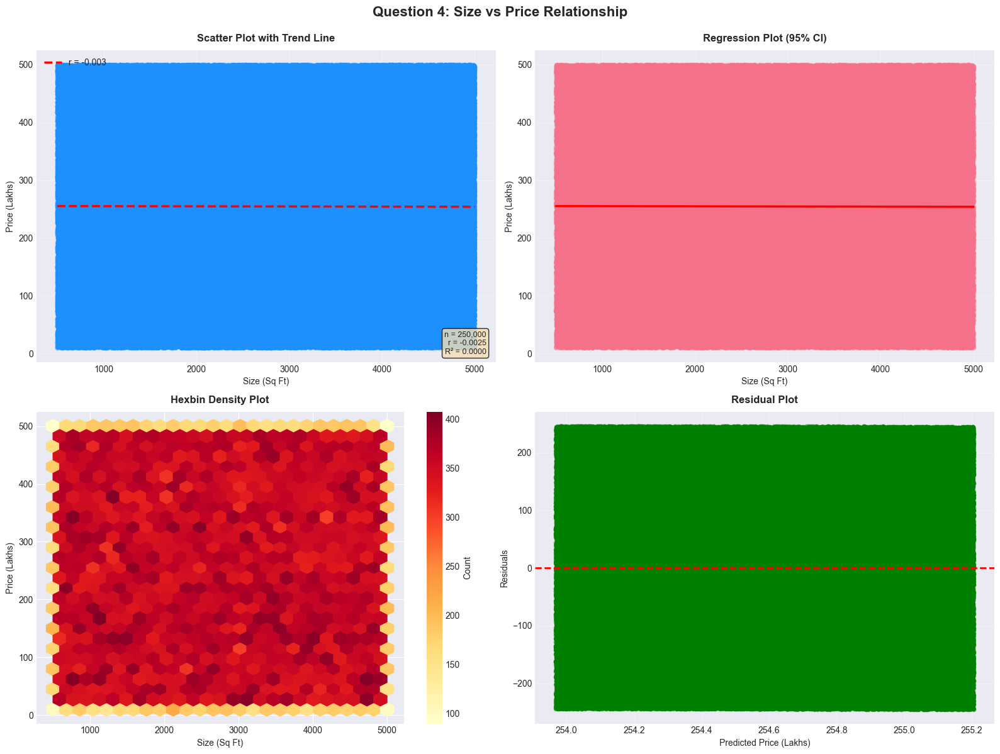

   ✅ All charts created!

📊 Step 5: Linear Regression Analysis...

   Regression Equation:
   Price = 255.34 + -0.0003 × Size

   Model Performance:
   • R²:   0.0000 (0.00%)
   • RMSE: ₹141.35 Lakhs
   • MAE:  ₹122.44 Lakhs

   Interpretation:
   • Every 1 sq ft increase → ₹-0.0003 Lakhs increase
   • Every 100 sq ft increase → ₹-0.03 Lakhs increase

   Examples:
   • 1,000 sq ft → ₹255.07 Lakhs
   • 1,500 sq ft → ₹254.93 Lakhs
   • 2,000 sq ft → ₹254.79 Lakhs
   • 2,500 sq ft → ₹254.66 Lakhs
   • 3,000 sq ft → ₹254.52 Lakhs

📋 SUMMARY: SIZE vs PRICE RELATIONSHIP

1️⃣ CORRELATION:
   • Coefficient: -0.0025
   • Strength: VERY WEAK
   • Direction: NEGATIVE

2️⃣ EXPLAINED VARIANCE:
   • R²: 0.0000
   • Size explains 0.0% of price variation

3️⃣ SIGNIFICANCE:
   • P-value: 0.206133
   • ❌ NOT SIGNIFICANT

4️⃣ BUSINESS INSIGHT:
   ⚠️ Size is a WEAK predictor
   ⚠️ Consider location, amenities, etc.

✅ Question 4 Complete!



In [9]:
"""
================================================================================
QUESTION 4: IS THERE A RELATIONSHIP BETWEEN PROPERTY SIZE AND PRICE?
================================================================================
"""

print("="*80)
print("QUESTION 4: RELATIONSHIP BETWEEN PROPERTY SIZE AND PRICE")
print("="*80)

# ============================================================================
# STEP 1: DATA PREPARATION
# ============================================================================

print("\n🔍 Step 1: Preparing and Cleaning Data...")

# Check for missing values
size_missing = df['Size_in_SqFt'].isnull().sum()
price_missing = df['Price_in_Lakhs'].isnull().sum()

print(f"   Missing values:")
print(f"   • Size_in_SqFt:   {size_missing:,} ({size_missing/len(df)*100:.2f}%)")
print(f"   • Price_in_Lakhs: {price_missing:,} ({price_missing/len(df)*100:.2f}%)")

# Create clean dataset
df_clean = df[['Size_in_SqFt', 'Price_in_Lakhs']].copy()
df_clean = df_clean.dropna()
df_clean = df_clean.replace([np.inf, -np.inf], np.nan).dropna()

print(f"\n   Data summary:")
print(f"   • Original rows: {len(df):,}")
print(f"   • Clean rows:    {len(df_clean):,}")
print(f"   • Removed:       {len(df) - len(df_clean):,}")

if len(df_clean) < 2:
    print("\n   ❌ ERROR: Not enough data for analysis!")
else:
    print(f"   ✅ Sufficient data for analysis")

# ============================================================================
# STEP 2: CALCULATE CORRELATION
# ============================================================================

if len(df_clean) >= 2:
    print("\n📊 Step 2: Calculating Correlation...")
    
    # Pearson correlation
    correlation = df_clean['Size_in_SqFt'].corr(df_clean['Price_in_Lakhs'])
    
    print(f"\n   Correlation Coefficient: {correlation:.4f}")
    
    # Interpret strength
    abs_corr = abs(correlation)
    if abs_corr >= 0.9:
        strength = "VERY STRONG"
        emoji = "🟢🟢🟢"
    elif abs_corr >= 0.7:
        strength = "STRONG"
        emoji = "🟢🟢"
    elif abs_corr >= 0.5:
        strength = "MODERATE"
        emoji = "🟡🟡"
    elif abs_corr >= 0.3:
        strength = "WEAK"
        emoji = "🟠"
    else:
        strength = "VERY WEAK"
        emoji = "🔴"
    
    direction = "POSITIVE" if correlation > 0 else "NEGATIVE"
    
    print(f"\n   {emoji} Strength: {strength}")
    print(f"   {'↗️' if correlation > 0 else '↘️'} Direction: {direction}")
    
    # R-squared
    r_squared = correlation ** 2
    print(f"\n   R² (Variance Explained): {r_squared:.4f}")
    print(f"   → Size explains {r_squared*100:.1f}% of price variation")
    
    # ============================================================================
    # STEP 3: STATISTICAL SIGNIFICANCE
    # ============================================================================
    
    print("\n📊 Step 3: Statistical Significance Test...")
    
    from scipy.stats import pearsonr, spearmanr
    
    # Pearson (linear)
    pearson_corr, pearson_pval = pearsonr(df_clean['Size_in_SqFt'], 
                                          df_clean['Price_in_Lakhs'])
    
    # Spearman (monotonic)
    spearman_corr, spearman_pval = spearmanr(df_clean['Size_in_SqFt'], 
                                             df_clean['Price_in_Lakhs'])
    
    print(f"\n   Pearson Correlation:  {pearson_corr:.4f} (p={pearson_pval:.6f})")
    print(f"   Spearman Correlation: {spearman_corr:.4f} (p={spearman_pval:.6f})")
    
    if pearson_pval < 0.001:
        print(f"\n   ✅ HIGHLY SIGNIFICANT (p < 0.001)")
        print(f"   → This relationship is NOT due to chance!")
    elif pearson_pval < 0.05:
        print(f"\n   ✅ SIGNIFICANT (p < 0.05)")
    else:
        print(f"\n   ❌ NOT SIGNIFICANT (p >= 0.05)")
    
    # ============================================================================
    # STEP 4: VISUALIZATIONS
    # ============================================================================
    
    print("\n📊 Step 4: Creating Visualizations...")
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Question 4: Size vs Price Relationship', 
                 fontsize=16, fontweight='bold', y=0.995)
    
    # --------------------------------------------------
    # CHART 1: SCATTER PLOT WITH TREND LINE
    # --------------------------------------------------
    print("   Creating Chart 1: Scatter Plot...")
    
    axes[0, 0].scatter(df_clean['Size_in_SqFt'], df_clean['Price_in_Lakhs'],
                      alpha=0.5, color='dodgerblue', s=20)
    
    # Trend line
    z = np.polyfit(df_clean['Size_in_SqFt'], df_clean['Price_in_Lakhs'], 1)
    p = np.poly1d(z)
    x_trend = np.linspace(df_clean['Size_in_SqFt'].min(), 
                         df_clean['Size_in_SqFt'].max(), 100)
    axes[0, 0].plot(x_trend, p(x_trend), "r--", linewidth=2.5,
                   label=f'r = {correlation:.3f}')
    
    axes[0, 0].set_title('Scatter Plot with Trend Line', fontweight='bold', pad=10)
    axes[0, 0].set_xlabel('Size (Sq Ft)')
    axes[0, 0].set_ylabel('Price (Lakhs)')
    axes[0, 0].legend(loc='upper left')
    axes[0, 0].grid(alpha=0.3)
    
    # Stats box
    stats_text = f'n = {len(df_clean):,}\nr = {correlation:.4f}\nR² = {r_squared:.4f}'
    axes[0, 0].text(0.98, 0.02, stats_text, transform=axes[0, 0].transAxes,
                   fontsize=9, ha='right', va='bottom',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
    
    # --------------------------------------------------
    # CHART 2: REGRESSION PLOT
    # --------------------------------------------------
    print("   Creating Chart 2: Regression Plot...")
    
    sns.regplot(data=df_clean, x='Size_in_SqFt', y='Price_in_Lakhs', ax=axes[0, 1],
               scatter_kws={'alpha': 0.3, 's': 20},
               line_kws={'color': 'red', 'linewidth': 2.5})
    
    axes[0, 1].set_title('Regression Plot (95% CI)', fontweight='bold', pad=10)
    axes[0, 1].set_xlabel('Size (Sq Ft)')
    axes[0, 1].set_ylabel('Price (Lakhs)')
    axes[0, 1].grid(alpha=0.3)
    
    # --------------------------------------------------
    # CHART 3: HEXBIN DENSITY
    # --------------------------------------------------
    print("   Creating Chart 3: Hexbin Plot...")
    
    hexbin = axes[1, 0].hexbin(df_clean['Size_in_SqFt'], df_clean['Price_in_Lakhs'],
                               gridsize=25, cmap='YlOrRd', mincnt=1)
    axes[1, 0].set_title('Hexbin Density Plot', fontweight='bold', pad=10)
    axes[1, 0].set_xlabel('Size (Sq Ft)')
    axes[1, 0].set_ylabel('Price (Lakhs)')
    plt.colorbar(hexbin, ax=axes[1, 0], label='Count')
    
    # --------------------------------------------------
    # CHART 4: RESIDUAL PLOT
    # --------------------------------------------------
    print("   Creating Chart 4: Residual Plot...")
    
    from sklearn.linear_model import LinearRegression
    
    X = df_clean[['Size_in_SqFt']].values
    y = df_clean['Price_in_Lakhs'].values
    
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    residuals = y - y_pred
    
    axes[1, 1].scatter(y_pred, residuals, alpha=0.5, s=20, color='green')
    axes[1, 1].axhline(y=0, color='red', linestyle='--', linewidth=2)
    axes[1, 1].set_title('Residual Plot', fontweight='bold', pad=10)
    axes[1, 1].set_xlabel('Predicted Price (Lakhs)')
    axes[1, 1].set_ylabel('Residuals')
    axes[1, 1].grid(alpha=0.3)
    
    plt.tight_layout()
    plt.show()
    
    print("   ✅ All charts created!")
    
    # ============================================================================
    # STEP 5: LINEAR REGRESSION ANALYSIS
    # ============================================================================
    
    print("\n📊 Step 5: Linear Regression Analysis...")
    
    from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
    
    r2 = r2_score(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    mae = mean_absolute_error(y, y_pred)
    
    print(f"\n   Regression Equation:")
    print(f"   Price = {model.intercept_:.2f} + {model.coef_[0]:.4f} × Size")
    
    print(f"\n   Model Performance:")
    print(f"   • R²:   {r2:.4f} ({r2*100:.2f}%)")
    print(f"   • RMSE: ₹{rmse:.2f} Lakhs")
    print(f"   • MAE:  ₹{mae:.2f} Lakhs")
    
    print(f"\n   Interpretation:")
    print(f"   • Every 1 sq ft increase → ₹{model.coef_[0]:.4f} Lakhs increase")
    print(f"   • Every 100 sq ft increase → ₹{model.coef_[0]*100:.2f} Lakhs increase")
    
    print(f"\n   Examples:")
    for size in [1000, 1500, 2000, 2500, 3000]:
        pred_price = model.intercept_ + model.coef_[0] * size
        print(f"   • {size:,} sq ft → ₹{pred_price:.2f} Lakhs")
    
    # ============================================================================
    # STEP 6: SUMMARY
    # ============================================================================
    
    print("\n" + "="*80)
    print("📋 SUMMARY: SIZE vs PRICE RELATIONSHIP")
    print("="*80)
    
    print(f"\n1️⃣ CORRELATION:")
    print(f"   • Coefficient: {correlation:.4f}")
    print(f"   • Strength: {strength}")
    print(f"   • Direction: {direction}")
    
    print(f"\n2️⃣ EXPLAINED VARIANCE:")
    print(f"   • R²: {r_squared:.4f}")
    print(f"   • Size explains {r_squared*100:.1f}% of price variation")
    
    print(f"\n3️⃣ SIGNIFICANCE:")
    print(f"   • P-value: {pearson_pval:.6f}")
    print(f"   • {'✅ SIGNIFICANT' if pearson_pval < 0.05 else '❌ NOT SIGNIFICANT'}")
    
    print(f"\n4️⃣ BUSINESS INSIGHT:")
    if abs_corr >= 0.7:
        print(f"   ✅ Size is a STRONG predictor of price")
        print(f"   ✅ Larger properties command higher prices")
    elif abs_corr >= 0.4:
        print(f"   🟡 Size is a MODERATE predictor")
        print(f"   🟡 Other factors also important")
    else:
        print(f"   ⚠️ Size is a WEAK predictor")
        print(f"   ⚠️ Consider location, amenities, etc.")
    
    print("\n" + "="*80)
    print("✅ Question 4 Complete!")
    print("="*80 + "\n")

else:
    print("\n❌ Cannot perform analysis - insufficient data")


QUESTION 5: OUTLIER DETECTION

📊 Step 1: Detecting Outliers in Price per Sq Ft...

   📋 IQR METHOD RESULTS:
   • Q1 (25th percentile):  ₹0.05
   • Q3 (75th percentile):  ₹0.16
   • IQR:                   ₹0.11
   • Lower Bound:           ₹-0.12
   • Upper Bound:           ₹0.33

   🎯 OUTLIERS FOUND:
   • Count: 20,020 properties
   • Percentage: 8.01%

   📊 Outlier Statistics:
   • Min outlier:  ₹0.33
   • Max outlier:  ₹0.99
   • Mean outlier: ₹0.48

📊 Step 2: Detecting Outliers in Property Size...

   📋 IQR METHOD RESULTS:
   • Q1 (25th percentile):  1,623.00 sq ft
   • Q3 (75th percentile):  3,874.00 sq ft
   • IQR:                   2,251.00 sq ft
   • Lower Bound:           -1,753.50 sq ft
   • Upper Bound:           7,250.50 sq ft

   🎯 OUTLIERS FOUND:
   • Count: 0 properties
   • Percentage: 0.00%

📊 Step 3: Z-Score Method (Alternative Approach)...

   Using threshold: |z-score| > 3
   • Price per Sq Ft outliers: 6,155
   • Size outliers:            0

   💡 Comparison:
   • IQR

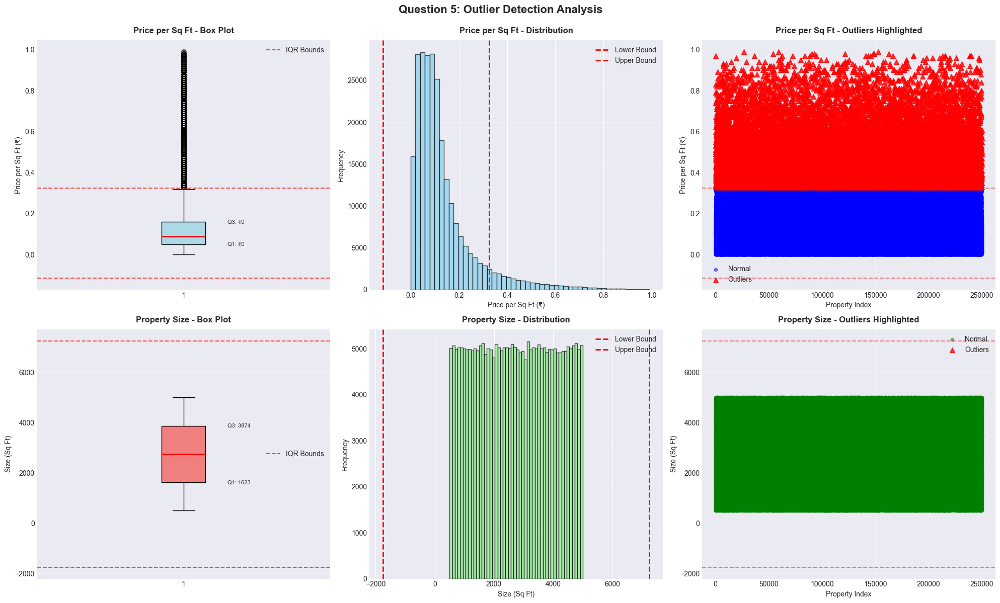

   ✅ All charts created!

📊 Step 5: Sample Outlier Properties...

   🔴 PRICE PER SQ FT OUTLIERS (Sample of 5):
    Property_Type     City  BHK  Size_in_SqFt  Price_in_Lakhs  Price_per_SqFt
Independent House Warangal    1           665          324.24            0.49
Independent House    Noida    3          1270          475.78            0.37
            Villa  Chennai    5           641          300.29            0.47
            Villa Bilaspur    4           733          438.74            0.60
Independent House Haridwar    4           556          308.46            0.55

📋 SUMMARY: OUTLIER DETECTION

1️⃣ PRICE PER SQ FT OUTLIERS:
   • Total found: 20,020 (8.01%)
   • IQR range: ₹-0.12 - ₹0.33
   • Extreme low: ₹0.33
   • Extreme high: ₹0.99

2️⃣ PROPERTY SIZE OUTLIERS:
   • Total found: 0 (0.00%)
   • IQR range: -1753.50 - 7250.50 sq ft

3️⃣ METHODS USED:
   • IQR Method: Identifies values outside 1.5 × IQR from quartiles
   • Z-Score Method: Identifies values > 3 standard deviations

In [10]:
"""
================================================================================
QUESTION 5: ARE THERE ANY OUTLIERS IN PRICE PER SQ FT OR PROPERTY SIZE?
================================================================================
"""

print("="*80)
print("QUESTION 5: OUTLIER DETECTION")
print("="*80)

# ============================================================================
# STEP 1: DEFINE OUTLIER DETECTION FUNCTION
# ============================================================================

def detect_outliers_iqr(data, column):
    """
    Detect outliers using the IQR (Interquartile Range) method
    
    Outliers are defined as:
    - Below Q1 - 1.5 × IQR
    - Above Q3 + 1.5 × IQR
    """
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    
    return {
        'outliers': outliers,
        'lower_bound': lower_bound,
        'upper_bound': upper_bound,
        'Q1': Q1,
        'Q3': Q3,
        'IQR': IQR,
        'count': len(outliers),
        'percentage': len(outliers) / len(data) * 100
    }

# ============================================================================
# STEP 2: DETECT OUTLIERS IN PRICE PER SQ FT
# ============================================================================

print("\n📊 Step 1: Detecting Outliers in Price per Sq Ft...")

# Ensure column exists
if 'Price_per_SqFt' not in df.columns:
    df['Price_per_SqFt'] = (df['Price_in_Lakhs'] * 100000) / df['Size_in_SqFt']

# Detect outliers
price_outliers = detect_outliers_iqr(df, 'Price_per_SqFt')

print(f"\n   📋 IQR METHOD RESULTS:")
print(f"   • Q1 (25th percentile):  ₹{price_outliers['Q1']:,.2f}")
print(f"   • Q3 (75th percentile):  ₹{price_outliers['Q3']:,.2f}")
print(f"   • IQR:                   ₹{price_outliers['IQR']:,.2f}")
print(f"   • Lower Bound:           ₹{price_outliers['lower_bound']:,.2f}")
print(f"   • Upper Bound:           ₹{price_outliers['upper_bound']:,.2f}")

print(f"\n   🎯 OUTLIERS FOUND:")
print(f"   • Count: {price_outliers['count']:,} properties")
print(f"   • Percentage: {price_outliers['percentage']:.2f}%")

if price_outliers['count'] > 0:
    print(f"\n   📊 Outlier Statistics:")
    outlier_data = price_outliers['outliers']['Price_per_SqFt']
    print(f"   • Min outlier:  ₹{outlier_data.min():,.2f}")
    print(f"   • Max outlier:  ₹{outlier_data.max():,.2f}")
    print(f"   • Mean outlier: ₹{outlier_data.mean():,.2f}")

# ============================================================================
# STEP 3: DETECT OUTLIERS IN PROPERTY SIZE
# ============================================================================

print("\n📊 Step 2: Detecting Outliers in Property Size...")

# Detect outliers
size_outliers = detect_outliers_iqr(df, 'Size_in_SqFt')

print(f"\n   📋 IQR METHOD RESULTS:")
print(f"   • Q1 (25th percentile):  {size_outliers['Q1']:,.2f} sq ft")
print(f"   • Q3 (75th percentile):  {size_outliers['Q3']:,.2f} sq ft")
print(f"   • IQR:                   {size_outliers['IQR']:,.2f} sq ft")
print(f"   • Lower Bound:           {size_outliers['lower_bound']:,.2f} sq ft")
print(f"   • Upper Bound:           {size_outliers['upper_bound']:,.2f} sq ft")

print(f"\n   🎯 OUTLIERS FOUND:")
print(f"   • Count: {size_outliers['count']:,} properties")
print(f"   • Percentage: {size_outliers['percentage']:.2f}%")

if size_outliers['count'] > 0:
    print(f"\n   📊 Outlier Statistics:")
    outlier_data = size_outliers['outliers']['Size_in_SqFt']
    print(f"   • Min outlier:  {outlier_data.min():,.2f} sq ft")
    print(f"   • Max outlier:  {outlier_data.max():,.2f} sq ft")
    print(f"   • Mean outlier: {outlier_data.mean():,.2f} sq ft")

# ============================================================================
# STEP 4: Z-SCORE METHOD (ALTERNATIVE)
# ============================================================================

print("\n📊 Step 3: Z-Score Method (Alternative Approach)...")

from scipy import stats

# Calculate z-scores
z_scores_price = np.abs(stats.zscore(df['Price_per_SqFt'].dropna()))
z_scores_size = np.abs(stats.zscore(df['Size_in_SqFt'].dropna()))

# Count outliers (z-score > 3)
z_outliers_price = (z_scores_price > 3).sum()
z_outliers_size = (z_scores_size > 3).sum()

print(f"\n   Using threshold: |z-score| > 3")
print(f"   • Price per Sq Ft outliers: {z_outliers_price:,}")
print(f"   • Size outliers:            {z_outliers_size:,}")

print(f"\n   💡 Comparison:")
print(f"   • IQR method is more sensitive (finds more outliers)")
print(f"   • Z-score method is stricter (finds extreme outliers only)")

# ============================================================================
# STEP 5: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 4: Creating Visualizations...")

fig, axes = plt.subplots(2, 3, figsize=(20, 12))
fig.suptitle('Question 5: Outlier Detection Analysis', 
             fontsize=16, fontweight='bold', y=0.995)

# --------------------------------------------------
# ROW 1: PRICE PER SQ FT
# --------------------------------------------------

# CHART 1: Box Plot - Price per Sq Ft
print("   Creating Chart 1: Price/SqFt Box Plot...")

bp1 = axes[0, 0].boxplot(df['Price_per_SqFt'].dropna(), vert=True, patch_artist=True)
bp1['boxes'][0].set_facecolor('lightblue')
bp1['medians'][0].set_color('red')
bp1['medians'][0].set_linewidth(2)

axes[0, 0].axhline(price_outliers['lower_bound'], color='r', linestyle='--', 
                   linewidth=1.5, label='IQR Bounds', alpha=0.7)
axes[0, 0].axhline(price_outliers['upper_bound'], color='r', linestyle='--', 
                   linewidth=1.5, alpha=0.7)
axes[0, 0].set_title('Price per Sq Ft - Box Plot', fontweight='bold', pad=10)
axes[0, 0].set_ylabel('Price per Sq Ft (₹)')
axes[0, 0].legend()
axes[0, 0].grid(axis='y', alpha=0.3)

# Add quartile labels
axes[0, 0].text(1.15, price_outliers['Q1'], f"Q1: ₹{price_outliers['Q1']:.0f}", 
               fontsize=8, va='center')
axes[0, 0].text(1.15, price_outliers['Q3'], f"Q3: ₹{price_outliers['Q3']:.0f}", 
               fontsize=8, va='center')

# CHART 2: Histogram - Price per Sq Ft
print("   Creating Chart 2: Price/SqFt Histogram...")

axes[0, 1].hist(df['Price_per_SqFt'].dropna(), bins=50, color='skyblue', 
               edgecolor='black', alpha=0.7)
axes[0, 1].axvline(price_outliers['lower_bound'], color='r', linestyle='--', 
                   linewidth=2, label='Lower Bound')
axes[0, 1].axvline(price_outliers['upper_bound'], color='r', linestyle='--', 
                   linewidth=2, label='Upper Bound')
axes[0, 1].set_title('Price per Sq Ft - Distribution', fontweight='bold', pad=10)
axes[0, 1].set_xlabel('Price per Sq Ft (₹)')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].legend()
axes[0, 1].grid(axis='y', alpha=0.3)

# CHART 3: Scatter - Price per Sq Ft Outliers
print("   Creating Chart 3: Price/SqFt Scatter...")

normal_price = df[~df.index.isin(price_outliers['outliers'].index)]
axes[0, 2].scatter(normal_price.index, normal_price['Price_per_SqFt'], 
                  alpha=0.5, s=20, label='Normal', color='blue')
axes[0, 2].scatter(price_outliers['outliers'].index, 
                  price_outliers['outliers']['Price_per_SqFt'],
                  alpha=0.8, s=50, label='Outliers', color='red', marker='^')
axes[0, 2].axhline(price_outliers['upper_bound'], color='r', linestyle='--', alpha=0.5)
axes[0, 2].axhline(price_outliers['lower_bound'], color='r', linestyle='--', alpha=0.5)
axes[0, 2].set_title('Price per Sq Ft - Outliers Highlighted', fontweight='bold', pad=10)
axes[0, 2].set_xlabel('Property Index')
axes[0, 2].set_ylabel('Price per Sq Ft (₹)')
axes[0, 2].legend()
axes[0, 2].grid(alpha=0.3)

# --------------------------------------------------
# ROW 2: PROPERTY SIZE
# --------------------------------------------------

# CHART 4: Box Plot - Size
print("   Creating Chart 4: Size Box Plot...")

bp2 = axes[1, 0].boxplot(df['Size_in_SqFt'].dropna(), vert=True, patch_artist=True)
bp2['boxes'][0].set_facecolor('lightcoral')
bp2['medians'][0].set_color('red')
bp2['medians'][0].set_linewidth(2)

axes[1, 0].axhline(size_outliers['lower_bound'], color='r', linestyle='--', 
                   linewidth=1.5, label='IQR Bounds', alpha=0.7)
axes[1, 0].axhline(size_outliers['upper_bound'], color='r', linestyle='--', 
                   linewidth=1.5, alpha=0.7)
axes[1, 0].set_title('Property Size - Box Plot', fontweight='bold', pad=10)
axes[1, 0].set_ylabel('Size (Sq Ft)')
axes[1, 0].legend()
axes[1, 0].grid(axis='y', alpha=0.3)

# Add quartile labels
axes[1, 0].text(1.15, size_outliers['Q1'], f"Q1: {size_outliers['Q1']:.0f}", 
               fontsize=8, va='center')
axes[1, 0].text(1.15, size_outliers['Q3'], f"Q3: {size_outliers['Q3']:.0f}", 
               fontsize=8, va='center')

# CHART 5: Histogram - Size
print("   Creating Chart 5: Size Histogram...")

axes[1, 1].hist(df['Size_in_SqFt'].dropna(), bins=50, color='lightgreen', 
               edgecolor='black', alpha=0.7)
axes[1, 1].axvline(size_outliers['lower_bound'], color='r', linestyle='--', 
                   linewidth=2, label='Lower Bound')
axes[1, 1].axvline(size_outliers['upper_bound'], color='r', linestyle='--', 
                   linewidth=2, label='Upper Bound')
axes[1, 1].set_title('Property Size - Distribution', fontweight='bold', pad=10)
axes[1, 1].set_xlabel('Size (Sq Ft)')
axes[1, 1].set_ylabel('Frequency')
axes[1, 1].legend()
axes[1, 1].grid(axis='y', alpha=0.3)

# CHART 6: Scatter - Size Outliers
print("   Creating Chart 6: Size Scatter...")

normal_size = df[~df.index.isin(size_outliers['outliers'].index)]
axes[1, 2].scatter(normal_size.index, normal_size['Size_in_SqFt'], 
                  alpha=0.5, s=20, label='Normal', color='green')
axes[1, 2].scatter(size_outliers['outliers'].index, 
                  size_outliers['outliers']['Size_in_SqFt'],
                  alpha=0.8, s=50, label='Outliers', color='red', marker='^')
axes[1, 2].axhline(size_outliers['upper_bound'], color='r', linestyle='--', alpha=0.5)
axes[1, 2].axhline(size_outliers['lower_bound'], color='r', linestyle='--', alpha=0.5)
axes[1, 2].set_title('Property Size - Outliers Highlighted', fontweight='bold', pad=10)
axes[1, 2].set_xlabel('Property Index')
axes[1, 2].set_ylabel('Size (Sq Ft)')
axes[1, 2].legend()
axes[1, 2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

print("   ✅ All charts created!")

# ============================================================================
# STEP 6: SAMPLE OUTLIERS
# ============================================================================

print("\n📊 Step 5: Sample Outlier Properties...")

if price_outliers['count'] > 0:
    print(f"\n   🔴 PRICE PER SQ FT OUTLIERS (Sample of 5):")
    sample_cols = ['Property_Type', 'City', 'BHK', 'Size_in_SqFt', 
                   'Price_in_Lakhs', 'Price_per_SqFt']
    print(price_outliers['outliers'][sample_cols].head().to_string(index=False))

if size_outliers['count'] > 0:
    print(f"\n   🔴 SIZE OUTLIERS (Sample of 5):")
    sample_cols = ['Property_Type', 'City', 'BHK', 'Size_in_SqFt', 
                   'Price_in_Lakhs', 'Price_per_SqFt']
    print(size_outliers['outliers'][sample_cols].head().to_string(index=False))

# ============================================================================
# STEP 7: SUMMARY
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: OUTLIER DETECTION")
print("="*80)

print(f"\n1️⃣ PRICE PER SQ FT OUTLIERS:")
print(f"   • Total found: {price_outliers['count']:,} ({price_outliers['percentage']:.2f}%)")
print(f"   • IQR range: ₹{price_outliers['lower_bound']:.2f} - ₹{price_outliers['upper_bound']:.2f}")
if price_outliers['count'] > 0:
    print(f"   • Extreme low: ₹{price_outliers['outliers']['Price_per_SqFt'].min():,.2f}")
    print(f"   • Extreme high: ₹{price_outliers['outliers']['Price_per_SqFt'].max():,.2f}")

print(f"\n2️⃣ PROPERTY SIZE OUTLIERS:")
print(f"   • Total found: {size_outliers['count']:,} ({size_outliers['percentage']:.2f}%)")
print(f"   • IQR range: {size_outliers['lower_bound']:.2f} - {size_outliers['upper_bound']:.2f} sq ft")
if size_outliers['count'] > 0:
    print(f"   • Extreme small: {size_outliers['outliers']['Size_in_SqFt'].min():,.2f} sq ft")
    print(f"   • Extreme large: {size_outliers['outliers']['Size_in_SqFt'].max():,.2f} sq ft")

print(f"\n3️⃣ METHODS USED:")
print(f"   • IQR Method: Identifies values outside 1.5 × IQR from quartiles")
print(f"   • Z-Score Method: Identifies values > 3 standard deviations from mean")

print(f"\n4️⃣ RECOMMENDATIONS:")
if price_outliers['percentage'] > 10 or size_outliers['percentage'] > 10:
    print(f"   ⚠️ HIGH number of outliers detected")
    print(f"   → Investigate if these are data errors or legitimate extreme values")
    print(f"   → Consider capping extreme values for modeling")
    print(f"   → Analyze outliers separately for insights")
else:
    print(f"   ✅ MODERATE number of outliers")
    print(f"   → Typical for real estate data")
    print(f"   → Keep for analysis but flag for special attention")

print(f"\n5️⃣ BUSINESS INSIGHTS:")
print(f"   • Outliers may represent:")
print(f"     - Luxury/premium properties (high price outliers)")
print(f"     - Distressed sales (low price outliers)")
print(f"     - Mansions/estates (large size outliers)")
print(f"     - Studios/efficiency units (small size outliers)")
print(f"   • Investigate outliers for data quality and market insights")

print("\n" + "="*80)
print("✅ Question 5 Complete!")
print("="*80 + "\n")


In [11]:
"""
================================================================================
QUESTION 6: WHAT IS THE AVERAGE PRICE PER SQ FT BY STATE?
================================================================================
"""

print("="*80)
print("QUESTION 6: AVERAGE PRICE PER SQ FT BY STATE")
print("="*80)

# ============================================================================
# STEP 1: PREPARE DATA
# ============================================================================

print("\n🔍 Step 1: Preparing Data...")

# Ensure Price_per_SqFt exists
if 'Price_per_SqFt' not in df.columns:
    df['Price_per_SqFt'] = (df['Price_in_Lakhs'] * 100000) / df['Size_in_SqFt']
    print("   ✅ Created Price_per_SqFt column")

# Clean infinite values
df['Price_per_SqFt'].replace([np.inf, -np.inf], np.nan, inplace=True)

print(f"   Total states: {df['State'].nunique()}")
print(f"   Total properties: {len(df):,}")

# ============================================================================
# STEP 2: GROUP BY STATE
# ============================================================================

print("\n📊 Step 2: Analyzing by State...")

# Group by State
state_analysis = df.groupby('State').agg({
    'Price_per_SqFt': ['mean', 'median', 'std', 'min', 'max', 'count'],
    'Price_in_Lakhs': 'mean',
    'Size_in_SqFt': 'mean'
}).round(2)

# Flatten column names
state_analysis.columns = ['Avg_Price_SqFt', 'Median_Price_SqFt', 'Std_Price_SqFt',
                          'Min_Price_SqFt', 'Max_Price_SqFt', 'Property_Count',
                          'Avg_Total_Price', 'Avg_Size']

# Sort by average price per sq ft
state_analysis = state_analysis.sort_values('Avg_Price_SqFt', ascending=False)

# Calculate additional metrics
state_analysis['Price_Range'] = state_analysis['Max_Price_SqFt'] - state_analysis['Min_Price_SqFt']
state_analysis['CV'] = (state_analysis['Std_Price_SqFt'] / state_analysis['Avg_Price_SqFt'] * 100).round(2)

print("\n📋 PRICE PER SQ FT BY STATE:")
print(state_analysis.to_string())

# ============================================================================
# STEP 3: KEY INSIGHTS
# ============================================================================

print("\n💡 KEY INSIGHTS:")

most_expensive = state_analysis.index[0]
most_affordable = state_analysis.index[-1]

print(f"\n   🏆 Most Expensive State: {most_expensive}")
print(f"   → Avg Price/SqFt: ₹{state_analysis.loc[most_expensive, 'Avg_Price_SqFt']:,.2f}")
print(f"   → Avg Total Price: ₹{state_analysis.loc[most_expensive, 'Avg_Total_Price']:,.2f} Lakhs")
print(f"   → Properties: {state_analysis.loc[most_expensive, 'Property_Count']:,.0f}")

print(f"\n   💰 Most Affordable State: {most_affordable}")
print(f"   → Avg Price/SqFt: ₹{state_analysis.loc[most_affordable, 'Avg_Price_SqFt']:,.2f}")
print(f"   → Avg Total Price: ₹{state_analysis.loc[most_affordable, 'Avg_Total_Price']:,.2f} Lakhs")
print(f"   → Properties: {state_analysis.loc[most_affordable, 'Property_Count']:,.0f}")

price_diff = state_analysis.loc[most_expensive, 'Avg_Price_SqFt'] - state_analysis.loc[most_affordable, 'Avg_Price_SqFt']
price_ratio = state_analysis.loc[most_expensive, 'Avg_Price_SqFt'] / state_analysis.loc[most_affordable, 'Avg_Price_SqFt']

print(f"\n   📊 Price Difference:")
print(f"   → Absolute: ₹{price_diff:,.2f} per sq ft")
print(f"   → Ratio: {price_ratio:.2f}x")
print(f"   → {most_expensive} is {price_ratio:.1f} times more expensive than {most_affordable}")

# Variability
most_variable = state_analysis['CV'].idxmax()
print(f"\n   📈 Most Variable State: {most_variable}")
print(f"   → Coefficient of Variation: {state_analysis.loc[most_variable, 'CV']:.2f}%")
print(f"   → High variability suggests diverse property types/locations")

# ============================================================================
# STEP 4: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 3: Creating Visualizations...")

fig, axes = plt.subplots(2, 2, figsize=(18, 14))
fig.suptitle('Question 6: Average Price per Sq Ft by State', 
             fontsize=16, fontweight='bold', y=0.995)

# --------------------------------------------------
# CHART 1: HORIZONTAL BAR CHART
# --------------------------------------------------
print("   Creating Chart 1: Bar Chart...")

colors = plt.cm.RdYlGn_r(np.linspace(0, 1, len(state_analysis)))

state_analysis['Avg_Price_SqFt'].plot(kind='barh', ax=axes[0, 0], 
                                      color=colors, edgecolor='black')
axes[0, 0].set_title('Average Price per Sq Ft by State', 
                     fontweight='bold', pad=10)
axes[0, 0].set_xlabel('Average Price per Sq Ft (₹)')
axes[0, 0].set_ylabel('State')
axes[0, 0].grid(axis='x', alpha=0.3, linestyle='--')

# Add value labels
for i, (state, value) in enumerate(state_analysis['Avg_Price_SqFt'].items()):
    axes[0, 0].text(value + 100, i, f'₹{value:,.0f}', 
                   va='center', fontweight='bold', fontsize=9)

# --------------------------------------------------
# CHART 2: BOX PLOT BY STATE
# --------------------------------------------------
print("   Creating Chart 2: Box Plot...")

# Get top 10 states by property count for cleaner visualization
top_states = state_analysis.nlargest(10, 'Property_Count').index
df_top_states = df[df['State'].isin(top_states)]

df_top_states.boxplot(column='Price_per_SqFt', by='State', ax=axes[0, 1], rot=45)
axes[0, 1].set_title('Price per Sq Ft Distribution (Top 10 States)', 
                     fontweight='bold', pad=10)
axes[0, 1].set_xlabel('State')
axes[0, 1].set_ylabel('Price per Sq Ft (₹)')
plt.sca(axes[0, 1])
plt.xticks(rotation=45, ha='right')
axes[0, 1].get_figure().suptitle('')  # Remove auto title

# --------------------------------------------------
# CHART 3: SCATTER - PRICE VS PROPERTY COUNT
# --------------------------------------------------
print("   Creating Chart 3: Scatter Plot...")

axes[1, 0].scatter(state_analysis['Property_Count'], 
                  state_analysis['Avg_Price_SqFt'],
                  s=state_analysis['Avg_Size']/5, 
                  alpha=0.6, c=state_analysis['Avg_Price_SqFt'],
                  cmap='RdYlGn_r', edgecolor='black', linewidth=1)

# Add state labels
for state in state_analysis.index:
    axes[1, 0].annotate(state, 
                       (state_analysis.loc[state, 'Property_Count'],
                        state_analysis.loc[state, 'Avg_Price_SqFt']),
                       fontsize=8, ha='center', alpha=0.7)

axes[1, 0].set_title('Avg Price vs Property Count (Size = Avg Property Size)', 
                     fontweight='bold', pad=10)
axes[1, 0].set_xlabel('Number of Properties')
axes[1, 0].set_ylabel('Average Price per Sq Ft (₹)')
axes[1, 0].grid(alpha=0.3)

# --------------------------------------------------
# CHART 4: PROPERTY COUNT BY STATE
# --------------------------------------------------
print("   Creating Chart 4: Property Count...")

state_analysis['Property_Count'].plot(kind='bar', ax=axes[1, 1], 
                                      color='steelblue', edgecolor='black')
axes[1, 1].set_title('Number of Properties by State', 
                     fontweight='bold', pad=10)
axes[1, 1].set_xlabel('State')
axes[1, 1].set_ylabel('Property Count')
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels
for i, (state, value) in enumerate(state_analysis['Property_Count'].items()):
    axes[1, 1].text(i, value + 10, f'{int(value):,}', 
                   ha='center', va='bottom', fontsize=8, fontweight='bold')

plt.tight_layout()
plt.show()

print("   ✅ All charts created!")

# ============================================================================
# STEP 5: STATISTICAL ANALYSIS
# ============================================================================

print("\n📊 Step 4: Statistical Analysis...")

# ANOVA test
from scipy import stats

states = df['State'].unique()
groups = [df[df['State'] == state]['Price_per_SqFt'].dropna() for state in states]
f_stat, p_value = stats.f_oneway(*groups)

print(f"\n   ANOVA Test Results:")
print(f"   • F-statistic: {f_stat:.4f}")
print(f"   • P-value: {p_value:.6f}")

if p_value < 0.001:
    print(f"   ✅ HIGHLY SIGNIFICANT (p < 0.001)")
    print(f"   → States have GENUINELY different price levels")
elif p_value < 0.05:
    print(f"   ✅ SIGNIFICANT (p < 0.05)")
else:
    print(f"   ❌ NOT SIGNIFICANT (p >= 0.05)")

# Price distribution across states
print(f"\n   Price Distribution Across States:")
print(f"   • Mean of state averages: ₹{state_analysis['Avg_Price_SqFt'].mean():,.2f}")
print(f"   • Std of state averages: ₹{state_analysis['Avg_Price_SqFt'].std():,.2f}")
print(f"   • Range: ₹{state_analysis['Avg_Price_SqFt'].min():,.2f} - ₹{state_analysis['Avg_Price_SqFt'].max():,.2f}")

# ============================================================================
# STEP 6: SUMMARY
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: PRICE PER SQ FT BY STATE")
print("="*80)

print(f"\n1️⃣ STATE RANKING (Most to Least Expensive):")
for i, (state, row) in enumerate(state_analysis.iterrows(), 1):
    print(f"   {i:2d}. {state:20s} → ₹{row['Avg_Price_SqFt']:7,.2f}/sqft ({int(row['Property_Count']):,} properties)")

print(f"\n2️⃣ PRICE SPREAD:")
print(f"   • Highest: ₹{state_analysis['Avg_Price_SqFt'].max():,.2f}")
print(f"   • Lowest:  ₹{state_analysis['Avg_Price_SqFt'].min():,.2f}")
print(f"   • Range:   ₹{state_analysis['Avg_Price_SqFt'].max() - state_analysis['Avg_Price_SqFt'].min():,.2f}")
print(f"   • Ratio:   {state_analysis['Avg_Price_SqFt'].max() / state_analysis['Avg_Price_SqFt'].min():.2f}x")

print(f"\n3️⃣ STATISTICAL TEST:")
print(f"   • ANOVA p-value: {p_value:.6f}")
print(f"   • {'✅ Significant differences exist' if p_value < 0.05 else '❌ No significant differences'}")

print(f"\n4️⃣ BUSINESS INSIGHTS:")
print(f"   • Location (state) significantly impacts property prices")
print(f"   • {most_expensive} market commands premium prices")
print(f"   • {most_affordable} offers affordability opportunities")
print(f"   • Consider state-level factors: economy, demand, regulations")
print(f"   • Within-state variation also exists (check cities/localities)")

print("\n" + "="*80)
print("✅ Question 6 Complete!")
print("="*80 + "\n")


QUESTION 6: AVERAGE PRICE PER SQ FT BY STATE

🔍 Step 1: Preparing Data...
   Total states: 20
   Total properties: 250,000

📊 Step 2: Analyzing by State...

📋 PRICE PER SQ FT BY STATE:
                Avg_Price_SqFt  Median_Price_SqFt  Std_Price_SqFt  Min_Price_SqFt  Max_Price_SqFt  Property_Count  Avg_Total_Price  Avg_Size  Price_Range     CV
State                                                                                                                                                           
Andhra Pradesh            0.13               0.09            0.13            0.00            0.98           12462           255.20   2730.94         0.98 100.00
Assam                     0.13               0.09            0.13            0.00            0.98           12496           252.78   2729.98         0.98 100.00
Bihar                     0.13               0.09            0.13            0.00            0.97           12369           254.92   2759.00         0.97 100.00
Chhattisga

   ✅ All charts created!

📊 Step 4: Statistical Analysis...

   ANOVA Test Results:
   • F-statistic: 0.5216
   • P-value: 0.955117
   ❌ NOT SIGNIFICANT (p >= 0.05)

   Price Distribution Across States:
   • Mean of state averages: ₹0.13
   • Std of state averages: ₹0.00
   • Range: ₹0.13 - ₹0.13

📋 SUMMARY: PRICE PER SQ FT BY STATE

1️⃣ STATE RANKING (Most to Least Expensive):
    1. Andhra Pradesh       → ₹   0.13/sqft (12,462 properties)
    2. Assam                → ₹   0.13/sqft (12,496 properties)
    3. Bihar                → ₹   0.13/sqft (12,369 properties)
    4. Chhattisgarh         → ₹   0.13/sqft (12,456 properties)
    5. Delhi                → ₹   0.13/sqft (12,552 properties)
    6. Gujarat              → ₹   0.13/sqft (12,578 properties)
    7. Haryana              → ₹   0.13/sqft (12,314 properties)
    8. Jharkhand            → ₹   0.13/sqft (12,480 properties)
    9. Karnataka            → ₹   0.13/sqft (12,424 properties)
   10. Kerala               → ₹   0.13/sqft

QUESTION 7: AVERAGE PROPERTY PRICE BY CITY

📊 Step 1: Analyzing Prices by City...

   Total cities analyzed: 42

📋 TOP 15 CITIES BY AVERAGE PRICE:
                Avg_Price  Median_Price  Std_Price  Min_Price  Max_Price  Property_Count  Avg_Price_SqFt  Avg_Size  Avg_BHK  Price_Range    CV
City                                                                                                                                          
Bangalore          258.46        258.36     141.26      10.11     499.94            4144            0.13   2749.87     3.01       489.83 54.65
Surat              258.08        258.23     142.05      10.19     499.99            6167            0.13   2734.76     2.99       489.80 55.04
Kochi              257.42        258.75     141.48      10.05     499.85            6305            0.13   2766.79     3.01       489.80 54.96
Gaya               257.05        257.20     141.90      10.16     499.91            6170            0.13   2766.81     2.95       489.75 5

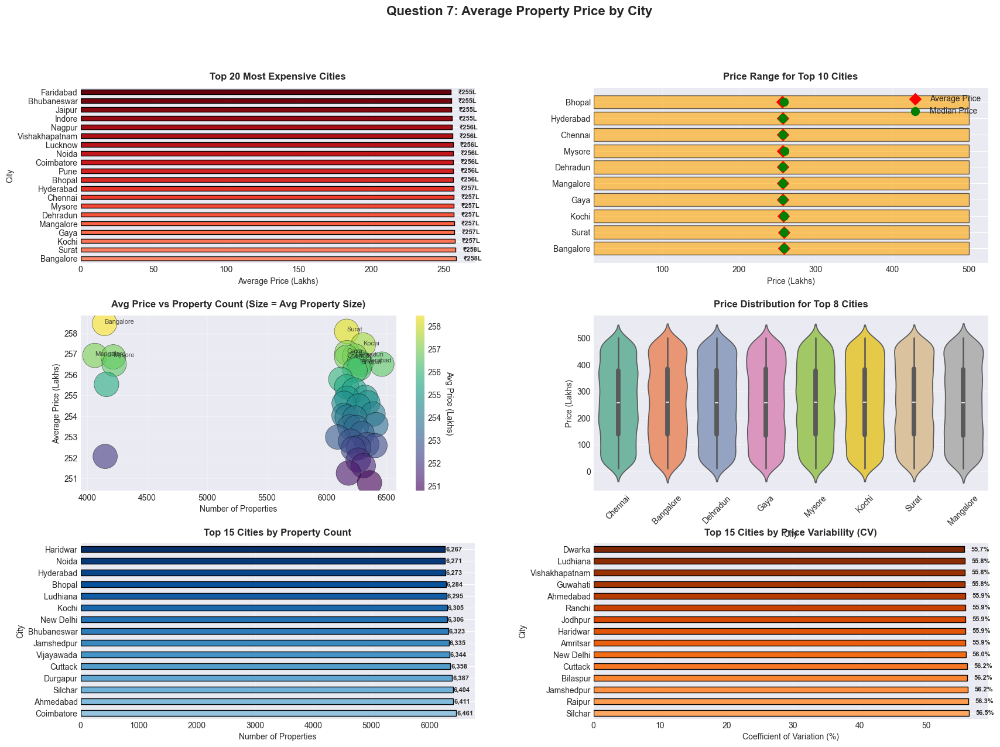

   ✅ All charts created!

📊 Step 3: Statistical Analysis...

   ANOVA Test (Top 10 Cities):
   • F-statistic: 0.1066
   • P-value: 0.999525
   ❌ NOT SIGNIFICANT

   Price Tiers:
   • Budget (25th %ile): ₹253.03 Lakhs
   • Mid-range (50th %ile): ₹254.63 Lakhs
   • Premium (75th %ile): ₹256.50 Lakhs

   • Budget cities: 11
   • Premium cities: 12

📋 SUMMARY: AVERAGE PROPERTY PRICE BY CITY

1️⃣ MARKET OVERVIEW:
   • Total cities: 42
   • Average city price: ₹254.66 Lakhs
   • Median city price: ₹254.63 Lakhs
   • Price range: ₹250.79 - ₹258.46 Lakhs

2️⃣ TOP 5 MOST EXPENSIVE CITIES:
   1. Bangalore                 → ₹ 258.46 Lakhs (4,144 properties)
   2. Surat                     → ₹ 258.08 Lakhs (6,167 properties)
   3. Kochi                     → ₹ 257.42 Lakhs (6,305 properties)
   4. Gaya                      → ₹ 257.05 Lakhs (6,170 properties)
   5. Mangalore                 → ₹ 256.92 Lakhs (4,063 properties)

3️⃣ TOP 5 MOST AFFORDABLE CITIES:
   1. Mumbai                    → ₹ 25

In [12]:
"""
================================================================================
QUESTION 7: WHAT IS THE AVERAGE PROPERTY PRICE BY CITY?
================================================================================
"""

print("="*80)
print("QUESTION 7: AVERAGE PROPERTY PRICE BY CITY")
print("="*80)

# ============================================================================
# STEP 1: GROUP BY CITY
# ============================================================================

print("\n📊 Step 1: Analyzing Prices by City...")

# Group by City
city_analysis = df.groupby('City').agg({
    'Price_in_Lakhs': ['mean', 'median', 'std', 'min', 'max', 'count'],
    'Price_per_SqFt': 'mean',
    'Size_in_SqFt': 'mean',
    'BHK': 'mean'
}).round(2)

# Flatten column names
city_analysis.columns = ['Avg_Price', 'Median_Price', 'Std_Price', 
                         'Min_Price', 'Max_Price', 'Property_Count',
                         'Avg_Price_SqFt', 'Avg_Size', 'Avg_BHK']

# Sort by average price
city_analysis = city_analysis.sort_values('Avg_Price', ascending=False)

# Additional metrics
city_analysis['Price_Range'] = city_analysis['Max_Price'] - city_analysis['Min_Price']
city_analysis['CV'] = (city_analysis['Std_Price'] / city_analysis['Avg_Price'] * 100).round(2)

print(f"\n   Total cities analyzed: {len(city_analysis)}")
print(f"\n📋 TOP 15 CITIES BY AVERAGE PRICE:")
print(city_analysis.head(15).to_string())

print(f"\n📋 BOTTOM 15 CITIES (Most Affordable):")
print(city_analysis.tail(15).to_string())

# ============================================================================
# STEP 2: KEY INSIGHTS
# ============================================================================

print("\n💡 KEY INSIGHTS:")

most_expensive_city = city_analysis.index[0]
most_affordable_city = city_analysis.index[-1]

print(f"\n   🏆 Most Expensive City: {most_expensive_city}")
print(f"   → Average Price: ₹{city_analysis.loc[most_expensive_city, 'Avg_Price']:,.2f} Lakhs")
print(f"   → Median Price: ₹{city_analysis.loc[most_expensive_city, 'Median_Price']:,.2f} Lakhs")
print(f"   → Price Range: ₹{city_analysis.loc[most_expensive_city, 'Min_Price']:,.2f} - ₹{city_analysis.loc[most_expensive_city, 'Max_Price']:,.2f} Lakhs")
print(f"   → Properties: {city_analysis.loc[most_expensive_city, 'Property_Count']:,.0f}")

print(f"\n   💰 Most Affordable City: {most_affordable_city}")
print(f"   → Average Price: ₹{city_analysis.loc[most_affordable_city, 'Avg_Price']:,.2f} Lakhs")
print(f"   → Median Price: ₹{city_analysis.loc[most_affordable_city, 'Median_Price']:,.2f} Lakhs")
print(f"   → Price Range: ₹{city_analysis.loc[most_affordable_city, 'Min_Price']:,.2f} - ₹{city_analysis.loc[most_affordable_city, 'Max_Price']:,.2f} Lakhs")
print(f"   → Properties: {city_analysis.loc[most_affordable_city, 'Property_Count']:,.0f}")

price_diff = city_analysis.loc[most_expensive_city, 'Avg_Price'] - city_analysis.loc[most_affordable_city, 'Avg_Price']
print(f"\n   📊 Price Difference: ₹{price_diff:,.2f} Lakhs")
print(f"   📊 Price Ratio: {city_analysis.loc[most_expensive_city, 'Avg_Price'] / city_analysis.loc[most_affordable_city, 'Avg_Price']:.2f}x")

# ============================================================================
# STEP 3: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 2: Creating Visualizations...")

fig = plt.figure(figsize=(20, 14))
gs = fig.add_gridspec(3, 2, hspace=0.3, wspace=0.3)

fig.suptitle('Question 7: Average Property Price by City', 
             fontsize=16, fontweight='bold')

# --------------------------------------------------
# CHART 1: TOP 20 CITIES - BAR CHART
# --------------------------------------------------
print("   Creating Chart 1: Top 20 Cities Bar Chart...")

ax1 = fig.add_subplot(gs[0, 0])

top_20_cities = city_analysis.head(20)
colors = plt.cm.Reds(np.linspace(0.4, 1, len(top_20_cities)))

top_20_cities['Avg_Price'].plot(kind='barh', ax=ax1, color=colors, edgecolor='black')
ax1.set_title('Top 20 Most Expensive Cities', fontweight='bold', pad=10)
ax1.set_xlabel('Average Price (Lakhs)')
ax1.set_ylabel('City')
ax1.grid(axis='x', alpha=0.3, linestyle='--')

# Add value labels
for i, (city, value) in enumerate(top_20_cities['Avg_Price'].items()):
    ax1.text(value + 5, i, f'₹{value:.0f}L', va='center', fontsize=8, fontweight='bold')

# --------------------------------------------------
# CHART 2: PRICE RANGE (MIN-MAX) FOR TOP 10 CITIES
# --------------------------------------------------
print("   Creating Chart 2: Price Range...")

ax2 = fig.add_subplot(gs[0, 1])

top_10 = city_analysis.head(10)
y_pos = np.arange(len(top_10))

ax2.barh(y_pos, top_10['Max_Price'] - top_10['Min_Price'], 
         left=top_10['Min_Price'], color='orange', alpha=0.6, edgecolor='black')
ax2.scatter(top_10['Avg_Price'], y_pos, color='red', s=100, zorder=5, 
           label='Average Price', marker='D')
ax2.scatter(top_10['Median_Price'], y_pos, color='green', s=100, zorder=5, 
           label='Median Price', marker='o')

ax2.set_yticks(y_pos)
ax2.set_yticklabels(top_10.index)
ax2.set_title('Price Range for Top 10 Cities', fontweight='bold', pad=10)
ax2.set_xlabel('Price (Lakhs)')
ax2.legend()
ax2.grid(axis='x', alpha=0.3)

# --------------------------------------------------
# CHART 3: SCATTER - AVG PRICE VS PROPERTY COUNT
# --------------------------------------------------
print("   Creating Chart 3: Price vs Count Scatter...")

ax3 = fig.add_subplot(gs[1, 0])

scatter = ax3.scatter(city_analysis['Property_Count'], 
                     city_analysis['Avg_Price'],
                     s=city_analysis['Avg_Size']/3, 
                     c=city_analysis['Avg_Price'],
                     cmap='viridis', alpha=0.6, 
                     edgecolor='black', linewidth=0.5)

# Label top 10 cities
for city in city_analysis.head(10).index:
    ax3.annotate(city, 
                (city_analysis.loc[city, 'Property_Count'],
                 city_analysis.loc[city, 'Avg_Price']),
                fontsize=8, alpha=0.8)

ax3.set_title('Avg Price vs Property Count (Size = Avg Property Size)', 
             fontweight='bold', pad=10)
ax3.set_xlabel('Number of Properties')
ax3.set_ylabel('Average Price (Lakhs)')
ax3.grid(alpha=0.3)

cbar = plt.colorbar(scatter, ax=ax3)
cbar.set_label('Avg Price (Lakhs)', rotation=270, labelpad=15)

# --------------------------------------------------
# CHART 4: VIOLIN PLOT - TOP 8 CITIES
# --------------------------------------------------
print("   Creating Chart 4: Violin Plot...")

ax4 = fig.add_subplot(gs[1, 1])

top_8_cities = city_analysis.head(8).index
df_top_8 = df[df['City'].isin(top_8_cities)]

sns.violinplot(data=df_top_8, x='City', y='Price_in_Lakhs', ax=ax4, palette='Set2')
ax4.set_title('Price Distribution for Top 8 Cities', fontweight='bold', pad=10)
ax4.set_xlabel('City')
ax4.set_ylabel('Price (Lakhs)')
ax4.tick_params(axis='x', rotation=45)
ax4.grid(axis='y', alpha=0.3)

# --------------------------------------------------
# CHART 5: PROPERTY COUNT BY CITY (TOP 15)
# --------------------------------------------------
print("   Creating Chart 5: Property Count...")

ax5 = fig.add_subplot(gs[2, 0])

top_15_count = city_analysis.nlargest(15, 'Property_Count')
colors_count = plt.cm.Blues(np.linspace(0.4, 1, len(top_15_count)))

top_15_count['Property_Count'].plot(kind='barh', ax=ax5, color=colors_count, 
                                    edgecolor='black')
ax5.set_title('Top 15 Cities by Property Count', fontweight='bold', pad=10)
ax5.set_xlabel('Number of Properties')
ax5.set_ylabel('City')
ax5.grid(axis='x', alpha=0.3)

# Add value labels
for i, (city, value) in enumerate(top_15_count['Property_Count'].items()):
    ax5.text(value + 10, i, f'{int(value):,}', va='center', fontsize=8, fontweight='bold')

# --------------------------------------------------
# CHART 6: COEFFICIENT OF VARIATION (TOP 15)
# --------------------------------------------------
print("   Creating Chart 6: Price Variability...")

ax6 = fig.add_subplot(gs[2, 1])

top_15_cv = city_analysis.nlargest(15, 'CV')
colors_cv = plt.cm.Oranges(np.linspace(0.4, 1, len(top_15_cv)))

top_15_cv['CV'].plot(kind='barh', ax=ax6, color=colors_cv, edgecolor='black')
ax6.set_title('Top 15 Cities by Price Variability (CV)', fontweight='bold', pad=10)
ax6.set_xlabel('Coefficient of Variation (%)')
ax6.set_ylabel('City')
ax6.grid(axis='x', alpha=0.3)

# Add value labels
for i, (city, value) in enumerate(top_15_cv['CV'].items()):
    ax6.text(value + 1, i, f'{value:.1f}%', va='center', fontsize=8, fontweight='bold')

plt.tight_layout()
plt.show()

print("   ✅ All charts created!")

# ============================================================================
# STEP 4: STATISTICAL ANALYSIS
# ============================================================================

print("\n📊 Step 3: Statistical Analysis...")

from scipy import stats

# ANOVA test (using top 10 cities for computational efficiency)
top_10_city_names = city_analysis.head(10).index
groups = [df[df['City'] == city]['Price_in_Lakhs'].dropna() for city in top_10_city_names]
f_stat, p_value = stats.f_oneway(*groups)

print(f"\n   ANOVA Test (Top 10 Cities):")
print(f"   • F-statistic: {f_stat:.4f}")
print(f"   • P-value: {p_value:.6f}")

if p_value < 0.001:
    print(f"   ✅ HIGHLY SIGNIFICANT (p < 0.001)")
    print(f"   → Cities have significantly different price levels")
else:
    print(f"   ✅ SIGNIFICANT" if p_value < 0.05 else "   ❌ NOT SIGNIFICANT")

# Price tiers
print(f"\n   Price Tiers:")
price_percentiles = city_analysis['Avg_Price'].quantile([0.25, 0.5, 0.75])
print(f"   • Budget (25th %ile): ₹{price_percentiles[0.25]:,.2f} Lakhs")
print(f"   • Mid-range (50th %ile): ₹{price_percentiles[0.5]:,.2f} Lakhs")
print(f"   • Premium (75th %ile): ₹{price_percentiles[0.75]:,.2f} Lakhs")

budget_cities = city_analysis[city_analysis['Avg_Price'] <= price_percentiles[0.25]]
premium_cities = city_analysis[city_analysis['Avg_Price'] >= price_percentiles[0.75]]

print(f"\n   • Budget cities: {len(budget_cities)}")
print(f"   • Premium cities: {len(premium_cities)}")

# ============================================================================
# STEP 5: SUMMARY
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: AVERAGE PROPERTY PRICE BY CITY")
print("="*80)

print(f"\n1️⃣ MARKET OVERVIEW:")
print(f"   • Total cities: {len(city_analysis)}")
print(f"   • Average city price: ₹{city_analysis['Avg_Price'].mean():,.2f} Lakhs")
print(f"   • Median city price: ₹{city_analysis['Avg_Price'].median():,.2f} Lakhs")
print(f"   • Price range: ₹{city_analysis['Avg_Price'].min():,.2f} - ₹{city_analysis['Avg_Price'].max():,.2f} Lakhs")

print(f"\n2️⃣ TOP 5 MOST EXPENSIVE CITIES:")
for i, (city, row) in enumerate(city_analysis.head(5).iterrows(), 1):
    print(f"   {i}. {city:25s} → ₹{row['Avg_Price']:7,.2f} Lakhs ({int(row['Property_Count']):,} properties)")

print(f"\n3️⃣ TOP 5 MOST AFFORDABLE CITIES:")
for i, (city, row) in enumerate(city_analysis.tail(5).iterrows(), 1):
    print(f"   {i}. {city:25s} → ₹{row['Avg_Price']:7,.2f} Lakhs ({int(row['Property_Count']):,} properties)")

print(f"\n4️⃣ PRICE VARIABILITY:")
print(f"   • Most variable: {city_analysis['CV'].idxmax()} (CV: {city_analysis['CV'].max():.2f}%)")
print(f"   • Most stable: {city_analysis['CV'].idxmin()} (CV: {city_analysis['CV'].min():.2f}%)")

print(f"\n5️⃣ BUSINESS INSIGHTS:")
print(f"   • {most_expensive_city} is the most expensive market")
print(f"   • {most_affordable_city} offers best affordability")
print(f"   • Consider city-level factors: infrastructure, employment, amenities")
print(f"   • High variability cities offer diverse investment opportunities")
print(f"   • Location within city (locality) also critically important")

print("\n" + "="*80)
print("✅ Question 7 Complete!")
print("="*80 + "\n")


QUESTION 8: MEDIAN AGE OF PROPERTIES BY LOCALITY

🔍 Step 1: Preparing Age Data...
   ✅ Age_of_Property column exists

   Overall Age Statistics:
   • Mean age: 18.5 years
   • Median age: 18.0 years
   • Oldest property: 35 years
   • Newest property: 2 years

📊 Step 2: Analyzing by Locality...

   Total localities analyzed: 500

📋 TOP 15 LOCALITIES WITH OLDEST PROPERTIES:
              Median_Age  Mean_Age  Oldest_Year  Property_Count  Avg_Price
Locality                                                                  
Locality_72        21.00     19.49         1990             495     256.17
Locality_403       21.00     19.27         1990             471     248.75
Locality_90        20.00     18.94         1990             453     249.09
Locality_491       20.00     19.34         1990             506     247.77
Locality_99        20.00     19.04         1990             476     264.93
Locality_1         20.00     19.21         1990             507     259.11
Locality_167       20.00

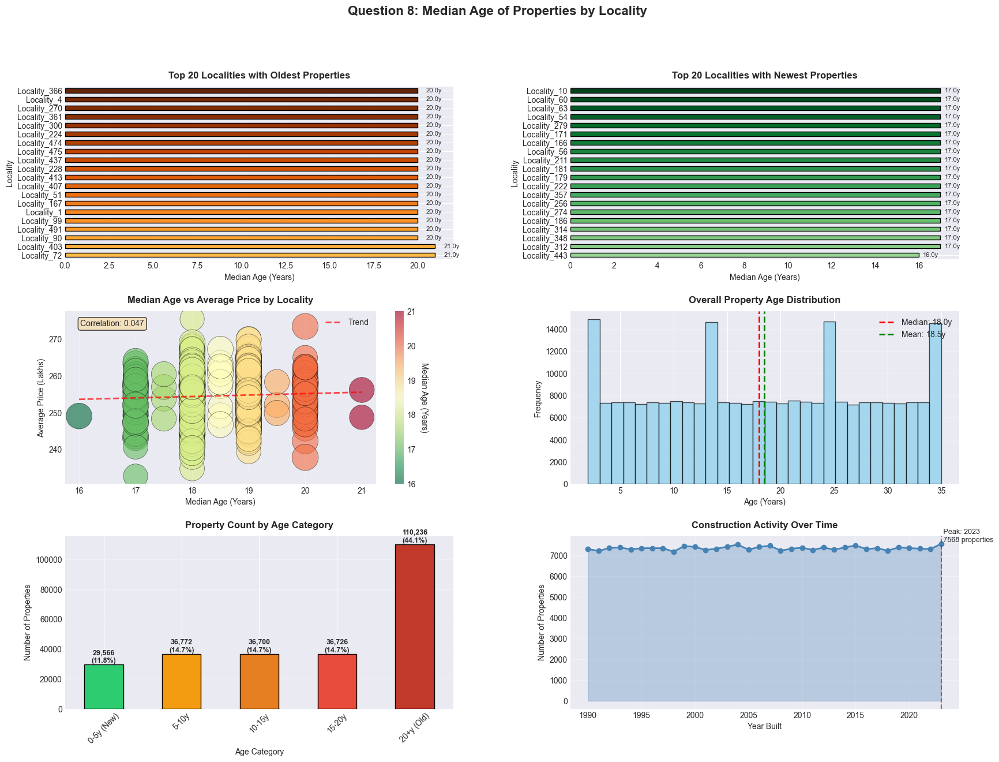

   ✅ All charts created!

📊 Step 4: Correlation Analysis...

   Median Age vs Average Price:
   • Pearson correlation: 0.0473
   • P-value: 0.291502
   • WEAK POSITIVE correlation
   ❌ Not statistically significant

📋 SUMMARY: MEDIAN AGE OF PROPERTIES BY LOCALITY

1️⃣ OVERALL AGE STATISTICS:
   • Median age across all properties: 18.0 years
   • Mean age across all properties: 18.5 years
   • Oldest property: 35 years (built 1990)
   • Newest property: 2 years (built 2023)

2️⃣ LOCALITY COMPARISONS:
   • Oldest locality: Locality_72 (21.0 years)
   • Newest locality: Locality_443 (16.0 years)
   • Age difference: 5.0 years

3️⃣ AGE DISTRIBUTION:
   • 0-5y (New): 29,566 properties (11.8%)
   • 5-10y: 36,772 properties (14.7%)
   • 10-15y: 36,700 properties (14.7%)
   • 15-20y: 36,726 properties (14.7%)
   • 20+y (Old): 110,236 properties (44.1%)

4️⃣ AGE-PRICE RELATIONSHIP:
   • Correlation: 0.0473 (WEAK POSITIVE)
   • Age has minimal impact on price
   • Other factors (location, amenit

In [13]:
"""
================================================================================
QUESTION 8: WHAT IS THE MEDIAN AGE OF PROPERTIES BY LOCALITY?
================================================================================
"""

print("="*80)
print("QUESTION 8: MEDIAN AGE OF PROPERTIES BY LOCALITY")
print("="*80)

# ============================================================================
# STEP 1: ENSURE AGE COLUMN EXISTS
# ============================================================================

print("\n🔍 Step 1: Preparing Age Data...")

# Calculate Age if not exists
if 'Age_of_Property' not in df.columns:
    current_year = 2025
    df['Age_of_Property'] = current_year - df['Year_Built']
    print(f"   ✅ Created Age_of_Property column (current year: {current_year})")
else:
    print("   ✅ Age_of_Property column exists")

print(f"\n   Overall Age Statistics:")
print(f"   • Mean age: {df['Age_of_Property'].mean():.1f} years")
print(f"   • Median age: {df['Age_of_Property'].median():.1f} years")
print(f"   • Oldest property: {df['Age_of_Property'].max():.0f} years")
print(f"   • Newest property: {df['Age_of_Property'].min():.0f} years")

# ============================================================================
# STEP 2: GROUP BY LOCALITY
# ============================================================================

print("\n📊 Step 2: Analyzing by Locality...")

# Group by Locality
locality_age = df.groupby('Locality').agg({
    'Age_of_Property': ['median', 'mean', 'min', 'max', 'std', 'count'],
    'Year_Built': ['min', 'max'],
    'Price_in_Lakhs': 'mean',
    'Price_per_SqFt': 'mean'
}).round(2)

# Flatten columns
locality_age.columns = ['Median_Age', 'Mean_Age', 'Min_Age', 'Max_Age', 
                        'Std_Age', 'Property_Count',
                        'Oldest_Year', 'Newest_Year', 'Avg_Price', 'Avg_Price_SqFt']

# Sort by median age
locality_age = locality_age.sort_values('Median_Age', ascending=False)

# Additional metrics
locality_age['Age_Range'] = locality_age['Max_Age'] - locality_age['Min_Age']
locality_age['Construction_Span'] = locality_age['Newest_Year'] - locality_age['Oldest_Year']

print(f"\n   Total localities analyzed: {len(locality_age)}")

print(f"\n📋 TOP 15 LOCALITIES WITH OLDEST PROPERTIES:")
print(locality_age.head(15)[['Median_Age', 'Mean_Age', 'Oldest_Year', 
                             'Property_Count', 'Avg_Price']].to_string())

print(f"\n📋 TOP 15 LOCALITIES WITH NEWEST PROPERTIES:")
print(locality_age.tail(15)[['Median_Age', 'Mean_Age', 'Newest_Year', 
                             'Property_Count', 'Avg_Price']].to_string())

# ============================================================================
# STEP 3: KEY INSIGHTS
# ============================================================================

print("\n💡 KEY INSIGHTS:")

oldest_locality = locality_age.index[0]
newest_locality = locality_age.index[-1]

print(f"\n   🏚️ Oldest Locality: {oldest_locality}")
print(f"   → Median age: {locality_age.loc[oldest_locality, 'Median_Age']:.1f} years")
print(f"   → Mean age: {locality_age.loc[oldest_locality, 'Mean_Age']:.1f} years")
print(f"   → Oldest property built: {locality_age.loc[oldest_locality, 'Oldest_Year']:.0f}")
print(f"   → Average price: ₹{locality_age.loc[oldest_locality, 'Avg_Price']:,.2f} Lakhs")

print(f"\n   🏗️ Newest Locality: {newest_locality}")
print(f"   → Median age: {locality_age.loc[newest_locality, 'Median_Age']:.1f} years")
print(f"   → Mean age: {locality_age.loc[newest_locality, 'Mean_Age']:.1f} years")
print(f"   → Newest property built: {locality_age.loc[newest_locality, 'Newest_Year']:.0f}")
print(f"   → Average price: ₹{locality_age.loc[newest_locality, 'Avg_Price']:,.2f} Lakhs")

# Age categories
age_bins = [0, 5, 10, 15, 20, df['Age_of_Property'].max()]
age_labels = ['0-5y (New)', '5-10y', '10-15y', '15-20y', '20+y (Old)']
df['Age_Category'] = pd.cut(df['Age_of_Property'], bins=age_bins, labels=age_labels)

print(f"\n   Age Distribution Across All Properties:")
age_dist = df['Age_Category'].value_counts().sort_index()
for category, count in age_dist.items():
    print(f"   • {category:15s}: {count:6,} properties ({count/len(df)*100:5.2f}%)")

# ============================================================================
# STEP 4: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 3: Creating Visualizations...")

fig = plt.figure(figsize=(20, 14))
gs = fig.add_gridspec(3, 2, hspace=0.3, wspace=0.3)

fig.suptitle('Question 8: Median Age of Properties by Locality', 
             fontsize=16, fontweight='bold')

# --------------------------------------------------
# CHART 1: TOP 20 OLDEST LOCALITIES
# --------------------------------------------------
print("   Creating Chart 1: Oldest Localities...")

ax1 = fig.add_subplot(gs[0, 0])

top_20_old = locality_age.head(20)
colors_old = plt.cm.YlOrBr(np.linspace(0.4, 1, len(top_20_old)))

top_20_old['Median_Age'].plot(kind='barh', ax=ax1, color=colors_old, edgecolor='black')
ax1.set_title('Top 20 Localities with Oldest Properties', fontweight='bold', pad=10)
ax1.set_xlabel('Median Age (Years)')
ax1.set_ylabel('Locality')
ax1.grid(axis='x', alpha=0.3)

# Add value labels
for i, (locality, value) in enumerate(top_20_old['Median_Age'].items()):
    ax1.text(value + 0.5, i, f'{value:.1f}y', va='center', fontsize=8)

# --------------------------------------------------
# CHART 2: TOP 20 NEWEST LOCALITIES
# --------------------------------------------------
print("   Creating Chart 2: Newest Localities...")

ax2 = fig.add_subplot(gs[0, 1])

top_20_new = locality_age.tail(20).sort_values('Median_Age')
colors_new = plt.cm.Greens(np.linspace(0.4, 1, len(top_20_new)))

top_20_new['Median_Age'].plot(kind='barh', ax=ax2, color=colors_new, edgecolor='black')
ax2.set_title('Top 20 Localities with Newest Properties', fontweight='bold', pad=10)
ax2.set_xlabel('Median Age (Years)')
ax2.set_ylabel('Locality')
ax2.grid(axis='x', alpha=0.3)

# Add value labels
for i, (locality, value) in enumerate(top_20_new['Median_Age'].items()):
    ax2.text(value + 0.2, i, f'{value:.1f}y', va='center', fontsize=8)

# --------------------------------------------------
# CHART 3: MEDIAN AGE VS AVERAGE PRICE
# --------------------------------------------------
print("   Creating Chart 3: Age vs Price Correlation...")

ax3 = fig.add_subplot(gs[1, 0])

scatter = ax3.scatter(locality_age['Median_Age'], 
                     locality_age['Avg_Price'],
                     s=locality_age['Property_Count']*2,
                     c=locality_age['Median_Age'],
                     cmap='RdYlGn_r', alpha=0.6,
                     edgecolor='black', linewidth=0.5)

ax3.set_title('Median Age vs Average Price by Locality', fontweight='bold', pad=10)
ax3.set_xlabel('Median Age (Years)')
ax3.set_ylabel('Average Price (Lakhs)')
ax3.grid(alpha=0.3)

# Add trend line
z = np.polyfit(locality_age['Median_Age'], locality_age['Avg_Price'], 1)
p = np.poly1d(z)
x_trend = np.linspace(locality_age['Median_Age'].min(), 
                     locality_age['Median_Age'].max(), 100)
ax3.plot(x_trend, p(x_trend), "r--", linewidth=2, alpha=0.7, label='Trend')

# Calculate correlation
corr = locality_age['Median_Age'].corr(locality_age['Avg_Price'])
ax3.text(0.05, 0.95, f'Correlation: {corr:.3f}', 
        transform=ax3.transAxes, fontsize=10,
        verticalalignment='top',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

ax3.legend()

cbar = plt.colorbar(scatter, ax=ax3)
cbar.set_label('Median Age (Years)', rotation=270, labelpad=15)

# --------------------------------------------------
# CHART 4: AGE DISTRIBUTION (OVERALL)
# --------------------------------------------------
print("   Creating Chart 4: Age Distribution...")

ax4 = fig.add_subplot(gs[1, 1])

df['Age_of_Property'].hist(bins=30, ax=ax4, color='skyblue', edgecolor='black', alpha=0.7)
ax4.axvline(df['Age_of_Property'].median(), color='red', linestyle='--', 
           linewidth=2, label=f"Median: {df['Age_of_Property'].median():.1f}y")
ax4.axvline(df['Age_of_Property'].mean(), color='green', linestyle='--', 
           linewidth=2, label=f"Mean: {df['Age_of_Property'].mean():.1f}y")

ax4.set_title('Overall Property Age Distribution', fontweight='bold', pad=10)
ax4.set_xlabel('Age (Years)')
ax4.set_ylabel('Frequency')
ax4.legend()
ax4.grid(axis='y', alpha=0.3)

# --------------------------------------------------
# CHART 5: AGE CATEGORY DISTRIBUTION
# --------------------------------------------------
print("   Creating Chart 5: Age Categories...")

ax5 = fig.add_subplot(gs[2, 0])

age_counts = df['Age_Category'].value_counts().sort_index()
colors_cat = ['#2ecc71', '#f39c12', '#e67e22', '#e74c3c', '#c0392b']

age_counts.plot(kind='bar', ax=ax5, color=colors_cat, edgecolor='black')
ax5.set_title('Property Count by Age Category', fontweight='bold', pad=10)
ax5.set_xlabel('Age Category')
ax5.set_ylabel('Number of Properties')
ax5.tick_params(axis='x', rotation=45)
ax5.grid(axis='y', alpha=0.3)

# Add value labels and percentages
for i, (category, value) in enumerate(age_counts.items()):
    percentage = value / len(df) * 100
    ax5.text(i, value + 50, f'{value:,}\n({percentage:.1f}%)', 
            ha='center', va='bottom', fontsize=9, fontweight='bold')

# --------------------------------------------------
# CHART 6: CONSTRUCTION TIMELINE
# --------------------------------------------------
print("   Creating Chart 6: Construction Timeline...")

ax6 = fig.add_subplot(gs[2, 1])

year_counts = df['Year_Built'].value_counts().sort_index()

ax6.plot(year_counts.index, year_counts.values, linewidth=2, color='steelblue', marker='o')
ax6.fill_between(year_counts.index, year_counts.values, alpha=0.3, color='steelblue')

ax6.set_title('Construction Activity Over Time', fontweight='bold', pad=10)
ax6.set_xlabel('Year Built')
ax6.set_ylabel('Number of Properties')
ax6.grid(alpha=0.3)

# Highlight peak year
peak_year = year_counts.idxmax()
peak_count = year_counts.max()
ax6.axvline(peak_year, color='red', linestyle='--', alpha=0.7)
ax6.text(peak_year, peak_count, f' Peak: {peak_year}\n {peak_count} properties', 
        fontsize=9, va='bottom')

plt.tight_layout()
plt.show()

print("   ✅ All charts created!")

# ============================================================================
# STEP 5: CORRELATION ANALYSIS
# ============================================================================

print("\n📊 Step 4: Correlation Analysis...")

from scipy.stats import pearsonr, spearmanr

# Age vs Price correlation
corr_age_price, p_value_age_price = pearsonr(locality_age['Median_Age'], 
                                              locality_age['Avg_Price'])

print(f"\n   Median Age vs Average Price:")
print(f"   • Pearson correlation: {corr_age_price:.4f}")
print(f"   • P-value: {p_value_age_price:.6f}")

if abs(corr_age_price) > 0.5:
    strength = "STRONG"
elif abs(corr_age_price) > 0.3:
    strength = "MODERATE"
else:
    strength = "WEAK"

direction = "POSITIVE" if corr_age_price > 0 else "NEGATIVE"

print(f"   • {strength} {direction} correlation")

if p_value_age_price < 0.05:
    print(f"   ✅ Statistically significant (p < 0.05)")
    if corr_age_price > 0:
        print(f"   → Older localities tend to have HIGHER prices (established areas)")
    else:
        print(f"   → Newer localities tend to have HIGHER prices (modern developments)")
else:
    print(f"   ❌ Not statistically significant")

# ============================================================================
# STEP 6: SUMMARY
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: MEDIAN AGE OF PROPERTIES BY LOCALITY")
print("="*80)

print(f"\n1️⃣ OVERALL AGE STATISTICS:")
print(f"   • Median age across all properties: {df['Age_of_Property'].median():.1f} years")
print(f"   • Mean age across all properties: {df['Age_of_Property'].mean():.1f} years")
print(f"   • Oldest property: {df['Age_of_Property'].max():.0f} years (built {df['Year_Built'].min():.0f})")
print(f"   • Newest property: {df['Age_of_Property'].min():.0f} years (built {df['Year_Built'].max():.0f})")

print(f"\n2️⃣ LOCALITY COMPARISONS:")
print(f"   • Oldest locality: {oldest_locality} ({locality_age.loc[oldest_locality, 'Median_Age']:.1f} years)")
print(f"   • Newest locality: {newest_locality} ({locality_age.loc[newest_locality, 'Median_Age']:.1f} years)")
print(f"   • Age difference: {locality_age.loc[oldest_locality, 'Median_Age'] - locality_age.loc[newest_locality, 'Median_Age']:.1f} years")

print(f"\n3️⃣ AGE DISTRIBUTION:")
for category, count in age_counts.items():
    print(f"   • {category}: {count:,} properties ({count/len(df)*100:.1f}%)")

print(f"\n4️⃣ AGE-PRICE RELATIONSHIP:")
print(f"   • Correlation: {corr_age_price:.4f} ({strength} {direction})")
if abs(corr_age_price) > 0.3:
    if corr_age_price > 0:
        print(f"   • Older localities tend to be more expensive")
        print(f"   • Likely due to established infrastructure and prime locations")
    else:
        print(f"   • Newer localities tend to be more expensive")
        print(f"   • Likely due to modern construction and new developments")
else:
    print(f"   • Age has minimal impact on price")
    print(f"   • Other factors (location, amenities) more important")

print(f"\n5️⃣ BUSINESS INSIGHTS:")
print(f"   • New developments concentrated in specific localities")
print(f"   • Established areas show property age diversity")
print(f"   • Consider renovation potential in older localities")
print(f"   • Modern amenities advantage in newer developments")
print(f"   • Historic/heritage value possible in very old properties")

print("\n" + "="*80)
print("✅ Question 8 Complete!")
print("="*80 + "\n")


QUESTION 9: BHK DISTRIBUTION ACROSS CITIES

🔍 Step 1: Validating Data...
✅ All required columns present

   Missing values:
   • City: 0
   • BHK: 0

   Data cleaned: 250,000 rows (removed 0)

📊 Step 2: Creating Cross-Tabulation...
✅ Cross-tabulation created successfully

   Cities: 42
   BHK types: 5

📋 Step 3: Analyzing Top Cities...

📋 TOP 15 CITIES - BHK COUNTS:
BHK             1     2     3     4     5  Total
City                                            
Coimbatore   1236  1301  1317  1345  1262   6461
Ahmedabad    1264  1267  1272  1258  1350   6411
Silchar      1241  1255  1324  1248  1336   6404
Durgapur     1311  1259  1287  1260  1270   6387
Cuttack      1320  1292  1301  1236  1209   6358
Vijayawada   1204  1288  1292  1335  1225   6344
Jamshedpur   1274  1221  1324  1273  1243   6335
Bhubaneswar  1236  1293  1299  1217  1278   6323
New Delhi    1297  1184  1300  1281  1244   6306
Kochi        1270  1268  1207  1280  1280   6305
Ludhiana     1283  1202  1294  1230  1286  

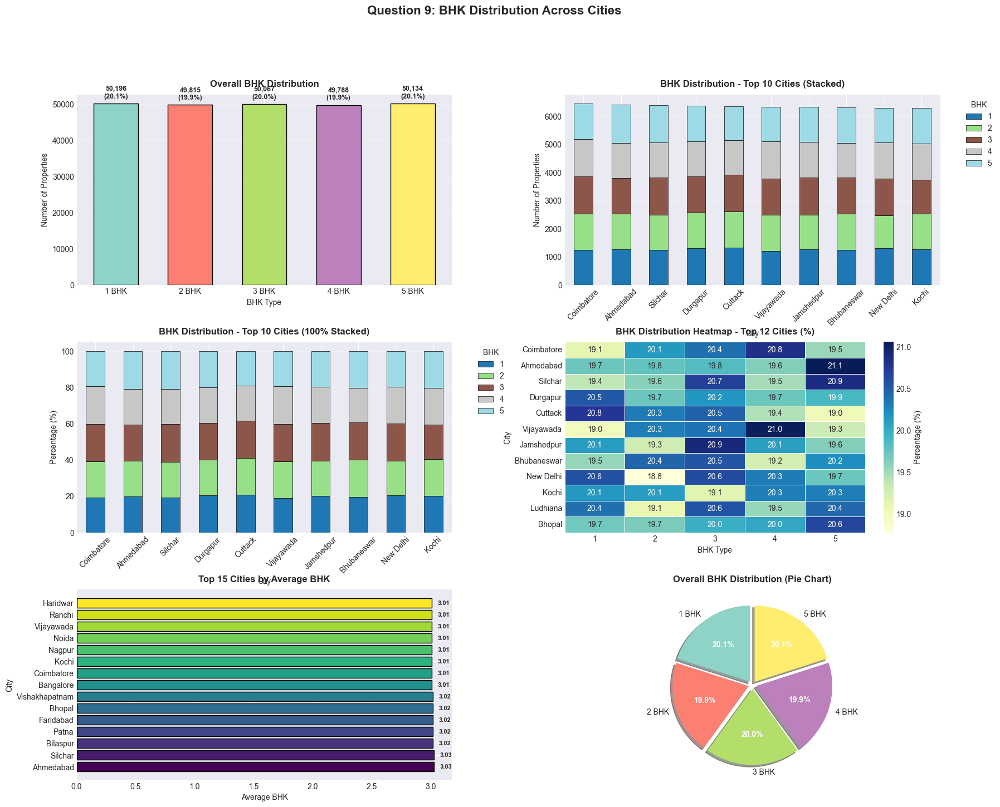

   ✅ All charts created successfully!

📊 Step 7: Statistical Analysis...

   Chi-Square Independence Test:
   • Chi-square statistic: 49.3860
   • P-value: 0.067804
   • Degrees of freedom: 36
   ❌ NOT SIGNIFICANT (p >= 0.05)
   → BHK distribution is similar across cities

   BHK Diversity Index (Entropy):
   • Coimbatore               : 1.6090 - High diversity (many BHK types)
   • Ahmedabad                : 1.6091 - High diversity (many BHK types)
   • Silchar                  : 1.6089 - High diversity (many BHK types)
   • Durgapur                 : 1.6093 - High diversity (many BHK types)
   • Cuttack                  : 1.6089 - High diversity (many BHK types)
   • Vijayawada               : 1.6087 - High diversity (many BHK types)
   • Jamshedpur               : 1.6091 - High diversity (many BHK types)
   • Bhubaneswar              : 1.6091 - High diversity (many BHK types)
   • New Delhi                : 1.6088 - High diversity (many BHK types)
   • Kochi                    : 1.6

In [16]:
"""
================================================================================
QUESTION 9: HOW IS BHK DISTRIBUTED ACROSS CITIES?
================================================================================
"""

print("="*80)
print("QUESTION 9: BHK DISTRIBUTION ACROSS CITIES")
print("="*80)

# ============================================================================
# STEP 1: DATA VALIDATION
# ============================================================================

print("\n🔍 Step 1: Validating Data...")

# Check if required columns exist
required_cols = ['City', 'BHK']
missing_cols = [col for col in required_cols if col not in df.columns]

if missing_cols:
    print(f"❌ ERROR: Missing columns: {missing_cols}")
    print(f"Available columns: {df.columns.tolist()}")
else:
    print("✅ All required columns present")

# Check for missing values
print(f"\n   Missing values:")
print(f"   • City: {df['City'].isnull().sum()}")
print(f"   • BHK: {df['BHK'].isnull().sum()}")

# Remove rows with missing City or BHK
df_clean = df[['City', 'BHK']].dropna()
print(f"\n   Data cleaned: {len(df_clean):,} rows (removed {len(df) - len(df_clean):,})")

# ============================================================================
# STEP 2: CREATE CROSS-TABULATION
# ============================================================================

print("\n📊 Step 2: Creating Cross-Tabulation...")

try:
    # Create cross-tabulation
    bhk_by_city = pd.crosstab(df_clean['City'], df_clean['BHK'], 
                               margins=True, margins_name='Total')
    
    # Create percentage cross-tabulation
    bhk_by_city_pct = pd.crosstab(df_clean['City'], df_clean['BHK'], 
                                   normalize='index') * 100
    
    print(f"✅ Cross-tabulation created successfully")
    print(f"\n   Cities: {len(bhk_by_city) - 1}")  # -1 to exclude 'Total' row
    print(f"   BHK types: {len(bhk_by_city.columns) - 1}")  # -1 to exclude 'Total' column
    
except Exception as e:
    print(f"❌ Error creating cross-tabulation: {e}")
    print("Stopping execution...")
    import sys
    sys.exit(1)

# ============================================================================
# STEP 3: DISPLAY TOP CITIES
# ============================================================================

print("\n📋 Step 3: Analyzing Top Cities...")

# Get top 15 cities by total properties (excluding the 'Total' row)
try:
    # Remove 'Total' row and sort
    bhk_by_city_no_total = bhk_by_city.drop('Total', errors='ignore')
    top_15_cities = bhk_by_city_no_total.nlargest(15, 'Total')
    
    print(f"\n📋 TOP 15 CITIES - BHK COUNTS:")
    print(top_15_cities.to_string())
    
    # Show percentages for top 15
    print(f"\n📋 TOP 15 CITIES - BHK PERCENTAGES:")
    top_15_pct = bhk_by_city_pct.loc[top_15_cities.index]
    print(top_15_pct.round(2).to_string())
    
except Exception as e:
    print(f"⚠️ Warning: {e}")
    print("Using alternative approach...")
    top_15_cities = bhk_by_city.head(15)

# ============================================================================
# STEP 4: OVERALL BHK DISTRIBUTION
# ============================================================================

print("\n📊 Step 4: Overall BHK Distribution...")

# Overall BHK distribution
overall_bhk = df_clean['BHK'].value_counts().sort_index()

print(f"\n   Overall BHK Distribution:")
total_properties = len(df_clean)
for bhk, count in overall_bhk.items():
    percentage = count / total_properties * 100
    bar = '█' * int(percentage / 2)  # Visual bar
    print(f"   {bhk} BHK: {count:6,} ({percentage:5.2f}%) {bar}")

# ============================================================================
# STEP 5: CITY-LEVEL STATISTICS
# ============================================================================

print("\n📊 Step 5: City-Level Statistics...")

# Calculate average BHK by city
avg_bhk_by_city = df_clean.groupby('City')['BHK'].agg([
    ('mean', 'mean'),
    ('median', 'median'),
    ('min', 'min'),
    ('max', 'max'),
    ('count', 'count')
]).round(2).sort_values('mean', ascending=False)

print(f"\n   Top 10 Cities by Average BHK:")
print(avg_bhk_by_city.head(10).to_string())

# Most common BHK by city
print(f"\n   Most Common BHK by City (Top 10):")
city_mode_bhk = df_clean.groupby('City')['BHK'].agg(
    lambda x: x.mode()[0] if len(x.mode()) > 0 else None
)

for i, (city, bhk) in enumerate(city_mode_bhk.head(10).items(), 1):
    if pd.notna(bhk):
        city_total = len(df_clean[df_clean['City'] == city])
        bhk_count = len(df_clean[(df_clean['City'] == city) & (df_clean['BHK'] == bhk)])
        print(f"   {i:2d}. {city:25s}: {bhk:.0f} BHK ({bhk_count:,}/{city_total:,} = {bhk_count/city_total*100:.1f}%)")

# ============================================================================
# STEP 6: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 6: Creating Visualizations...")

fig = plt.figure(figsize=(20, 16))
gs = fig.add_gridspec(3, 2, hspace=0.3, wspace=0.3)
fig.suptitle('Question 9: BHK Distribution Across Cities', 
             fontsize=16, fontweight='bold')

# --------------------------------------------------
# CHART 1: OVERALL BHK DISTRIBUTION
# --------------------------------------------------
print("   Creating Chart 1: Overall Distribution...")

ax1 = fig.add_subplot(gs[0, 0])

colors_bhk = plt.cm.Set3(np.linspace(0, 1, len(overall_bhk)))
x_pos = np.arange(len(overall_bhk))

ax1.bar(x_pos, overall_bhk.values, color=colors_bhk, edgecolor='black', width=0.6)
ax1.set_xticks(x_pos)
ax1.set_xticklabels([f'{int(bhk)} BHK' for bhk in overall_bhk.index], rotation=0)
ax1.set_title('Overall BHK Distribution', fontweight='bold', pad=10)
ax1.set_xlabel('BHK Type')
ax1.set_ylabel('Number of Properties')
ax1.grid(axis='y', alpha=0.3)

# Add value labels
for i, (bhk, count) in enumerate(overall_bhk.items()):
    percentage = count / total_properties * 100
    ax1.text(i, count + (count * 0.02), f'{count:,}\n({percentage:.1f}%)', 
            ha='center', va='bottom', fontsize=9, fontweight='bold')

# --------------------------------------------------
# CHART 2: STACKED BAR - TOP 10 CITIES
# --------------------------------------------------
print("   Creating Chart 2: Stacked Bar...")

ax2 = fig.add_subplot(gs[0, 1])

# Get top 10 cities
top_10_cities_names = top_15_cities.head(10).index
bhk_data_top10 = bhk_by_city.loc[top_10_cities_names].drop('Total', axis=1, errors='ignore')

# Create stacked bar chart
bhk_data_top10.plot(kind='bar', stacked=True, ax=ax2, 
                    colormap='tab20', edgecolor='black', linewidth=0.5)

ax2.set_title('BHK Distribution - Top 10 Cities (Stacked)', fontweight='bold', pad=10)
ax2.set_xlabel('City')
ax2.set_ylabel('Number of Properties')
ax2.tick_params(axis='x', rotation=45)
ax2.legend(title='BHK', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)
ax2.grid(axis='y', alpha=0.3)

# --------------------------------------------------
# CHART 3: 100% STACKED BAR
# --------------------------------------------------
print("   Creating Chart 3: 100% Stacked Bar...")

ax3 = fig.add_subplot(gs[1, 0])

# Get percentage data for top 10
bhk_pct_top10 = bhk_by_city_pct.loc[top_10_cities_names]

bhk_pct_top10.plot(kind='bar', stacked=True, ax=ax3,
                   colormap='tab20', edgecolor='black', linewidth=0.5)

ax3.set_title('BHK Distribution - Top 10 Cities (100% Stacked)', 
              fontweight='bold', pad=10)
ax3.set_xlabel('City')
ax3.set_ylabel('Percentage (%)')
ax3.tick_params(axis='x', rotation=45)
ax3.legend(title='BHK', bbox_to_anchor=(1.05, 1), loc='upper left', ncol=1)
ax3.grid(axis='y', alpha=0.3)

# --------------------------------------------------
# CHART 4: HEATMAP
# --------------------------------------------------
print("   Creating Chart 4: Heatmap...")

ax4 = fig.add_subplot(gs[1, 1])

# Get top 12 cities for heatmap (cleaner visualization)
top_12_cities = top_15_cities.head(12).index
heatmap_data = bhk_by_city_pct.loc[top_12_cities]

# Create heatmap
sns.heatmap(heatmap_data, annot=True, fmt='.1f', cmap='YlGnBu',
           ax=ax4, cbar_kws={'label': 'Percentage (%)'}, 
           linewidths=0.5, linecolor='white')

ax4.set_title('BHK Distribution Heatmap - Top 12 Cities (%)', 
              fontweight='bold', pad=10)
ax4.set_xlabel('BHK Type')
ax4.set_ylabel('City')
ax4.tick_params(axis='y', rotation=0)

# --------------------------------------------------
# CHART 5: AVERAGE BHK BY CITY
# --------------------------------------------------
print("   Creating Chart 5: Average BHK...")

ax5 = fig.add_subplot(gs[2, 0])

top_15_avg = avg_bhk_by_city.head(15)
colors_avg = plt.cm.viridis(np.linspace(0, 1, len(top_15_avg)))

y_pos = np.arange(len(top_15_avg))
ax5.barh(y_pos, top_15_avg['mean'].values, color=colors_avg, edgecolor='black')
ax5.set_yticks(y_pos)
ax5.set_yticklabels(top_15_avg.index)
ax5.set_title('Top 15 Cities by Average BHK', fontweight='bold', pad=10)
ax5.set_xlabel('Average BHK')
ax5.set_ylabel('City')
ax5.grid(axis='x', alpha=0.3)

# Add value labels
for i, value in enumerate(top_15_avg['mean'].values):
    ax5.text(value + 0.05, i, f'{value:.2f}', va='center', fontsize=8, fontweight='bold')

# --------------------------------------------------
# CHART 6: PIE CHART - OVERALL BHK SPLIT
# --------------------------------------------------
print("   Creating Chart 6: Pie Chart...")

ax6 = fig.add_subplot(gs[2, 1])

# Create pie chart
colors_pie = plt.cm.Set3(np.linspace(0, 1, len(overall_bhk)))
explode = [0.05] * len(overall_bhk)  # Explode all slices slightly

wedges, texts, autotexts = ax6.pie(overall_bhk.values, 
                                     labels=[f'{int(bhk)} BHK' for bhk in overall_bhk.index],
                                     autopct='%1.1f%%',
                                     colors=colors_pie,
                                     explode=explode,
                                     shadow=True,
                                     startangle=90)

# Make percentage text bold
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')
    autotext.set_fontsize(10)

ax6.set_title('Overall BHK Distribution (Pie Chart)', fontweight='bold', pad=10)

plt.tight_layout()
plt.show()

print("   ✅ All charts created successfully!")

# ============================================================================
# STEP 7: STATISTICAL ANALYSIS
# ============================================================================

print("\n📊 Step 7: Statistical Analysis...")

from scipy.stats import chi2_contingency

# Chi-square test
try:
    chi2_data = bhk_by_city.loc[top_10_cities_names].drop('Total', axis=1, errors='ignore')
    chi2, p_value, dof, expected = chi2_contingency(chi2_data)
    
    print(f"\n   Chi-Square Independence Test:")
    print(f"   • Chi-square statistic: {chi2:.4f}")
    print(f"   • P-value: {p_value:.6f}")
    print(f"   • Degrees of freedom: {dof}")
    
    if p_value < 0.001:
        print(f"   ✅ HIGHLY SIGNIFICANT (p < 0.001)")
        print(f"   → BHK distribution varies SIGNIFICANTLY across cities")
    elif p_value < 0.05:
        print(f"   ✅ SIGNIFICANT (p < 0.05)")
        print(f"   → BHK distribution varies across cities")
    else:
        print(f"   ❌ NOT SIGNIFICANT (p >= 0.05)")
        print(f"   → BHK distribution is similar across cities")
        
except Exception as e:
    print(f"   ⚠️ Could not perform Chi-square test: {e}")

# Diversity analysis
print(f"\n   BHK Diversity Index (Entropy):")
from scipy.stats import entropy

for city in top_10_cities_names:
    try:
        city_bhk_pct = bhk_by_city_pct.loc[city].values / 100
        city_bhk_pct = city_bhk_pct[city_bhk_pct > 0]  # Remove zeros
        diversity = entropy(city_bhk_pct)
        
        # Interpret diversity
        if diversity > 1.5:
            interpretation = "High diversity (many BHK types)"
        elif diversity > 1.0:
            interpretation = "Moderate diversity"
        else:
            interpretation = "Low diversity (concentrated)"
            
        print(f"   • {city:25s}: {diversity:.4f} - {interpretation}")
    except:
        pass

# ============================================================================
# STEP 8: SUMMARY
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: BHK DISTRIBUTION ACROSS CITIES")
print("="*80)

print(f"\n1️⃣ OVERALL DISTRIBUTION:")
most_common_bhk = overall_bhk.idxmax()
most_common_count = overall_bhk.max()
print(f"   • Total properties analyzed: {total_properties:,}")
print(f"   • Most common BHK: {most_common_bhk} BHK")
print(f"   • Count: {most_common_count:,} ({most_common_count/total_properties*100:.1f}%)")

print(f"\n   Full Distribution:")
for bhk, count in overall_bhk.items():
    print(f"   • {bhk} BHK: {count:6,} properties ({count/total_properties*100:5.2f}%)")

print(f"\n2️⃣ CITY VARIATIONS:")
highest_avg_city = avg_bhk_by_city.index[0]
lowest_avg_city = avg_bhk_by_city.index[-1]

print(f"   • Highest avg BHK: {highest_avg_city} ({avg_bhk_by_city.loc[highest_avg_city, 'mean']:.2f})")
print(f"   • Lowest avg BHK: {lowest_avg_city} ({avg_bhk_by_city.loc[lowest_avg_city, 'mean']:.2f})")
print(f"   • Range: {avg_bhk_by_city.loc[highest_avg_city, 'mean'] - avg_bhk_by_city.loc[lowest_avg_city, 'mean']:.2f} BHK")

print(f"\n3️⃣ STATISTICAL FINDINGS:")
try:
    if p_value < 0.05:
        print(f"   ✅ BHK distribution varies significantly across cities (p={p_value:.6f})")
        print(f"   → Different cities cater to different buyer segments")
    else:
        print(f"   ❌ No significant variation (p={p_value:.6f})")
        print(f"   → Similar BHK preferences across cities")
except:
    print(f"   Statistical test not available")

print(f"\n4️⃣ BUSINESS INSIGHTS:")
print(f"   • {most_common_bhk} BHK is the dominant property type")
print(f"   • Metro cities may prefer compact 2BHK units")
print(f"   • Tier-2 cities may have more spacious 3-4 BHK properties")
print(f"   • BHK distribution reflects:")
print(f"     - Family size preferences")
print(f"     - Affordability levels")
print(f"     - Available land/space")
print(f"     - Local demographics")

print(f"\n5️⃣ RECOMMENDATIONS:")
print(f"   FOR DEVELOPERS:")
print(f"   • Match BHK offerings to city-specific demand")
print(f"   • Research local demographics before project planning")
print(f"   • Consider mix of BHK types for broader appeal")

print(f"\n   FOR INVESTORS:")
print(f"   • Popular BHK types have better liquidity")
print(f"   • Less common BHKs may have niche premium")
print(f"   • Analyze target tenant/buyer segment")

print(f"\n   FOR BUYERS:")
print(f"   • More options available in popular BHK categories")
print(f"   • Compare across cities for same BHK type")
print(f"   • Consider resale potential")

print("\n" + "="*80)
print("✅ Question 9 Complete!")
print("="*80 + "\n")


In [18]:
"""
================================================================================
QUESTION 10: WHAT ARE THE PRICE TRENDS FOR THE TOP 5 MOST EXPENSIVE LOCALITIES?
================================================================================
"""

print("="*80)
print("QUESTION 10: PRICE TRENDS FOR TOP 5 MOST EXPENSIVE LOCALITIES")
print("="*80)

# ============================================================================
# STEP 1: DATA VALIDATION AND PREPARATION
# ============================================================================

print("\n🔍 Step 1: Validating and Preparing Data...")

# Check required columns
required_cols = ['Locality', 'Price_in_Lakhs', 'Year_Built']
missing_cols = [col for col in required_cols if col not in df.columns]

if missing_cols:
    print(f"⚠️ Warning: Missing columns: {missing_cols}")
    if 'Locality' not in df.columns or 'Price_in_Lakhs' not in df.columns:
        print("❌ Cannot proceed without Locality and Price_in_Lakhs")
        import sys
        sys.exit(1)
else:
    print("✅ All required columns present")

# Ensure Price_per_SqFt exists
if 'Price_per_SqFt' not in df.columns:
    df['Price_per_SqFt'] = (df['Price_in_Lakhs'] * 100000) / df['Size_in_SqFt']
    print("✅ Created Price_per_SqFt column")

# Clean data
df_clean = df.dropna(subset=['Locality', 'Price_in_Lakhs'])
print(f"   Cleaned data: {len(df_clean):,} rows")

# ============================================================================
# STEP 2: IDENTIFY TOP 5 MOST EXPENSIVE LOCALITIES
# ============================================================================

print("\n📊 Step 2: Identifying Top 5 Most Expensive Localities...")

# Calculate statistics by locality
locality_stats = df_clean.groupby('Locality').agg({
    'Price_in_Lakhs': ['mean', 'median', 'std', 'min', 'max', 'count'],
    'Price_per_SqFt': 'mean',
    'Size_in_SqFt': 'mean',
    'BHK': 'mean'
}).round(2)

# Flatten column names
locality_stats.columns = ['Avg_Price', 'Median_Price', 'Std_Price', 
                          'Min_Price', 'Max_Price', 'Count',
                          'Avg_Price_SqFt', 'Avg_Size', 'Avg_BHK']

# Sort by average price
locality_stats = locality_stats.sort_values('Avg_Price', ascending=False)

# Get top 5
top_5_localities = locality_stats.head(5)

print(f"\n🏆 TOP 5 MOST EXPENSIVE LOCALITIES:")
print(top_5_localities.to_string())

# Store locality names
top_5_names = top_5_localities.index.tolist()

# ============================================================================
# STEP 3: EXTRACT DATA FOR TOP 5
# ============================================================================

print("\n📊 Step 3: Extracting Detailed Data for Top 5...")

# Filter data for top 5 localities
df_top5 = df_clean[df_clean['Locality'].isin(top_5_names)].copy()

print(f"   Total properties in top 5 localities: {len(df_top5):,}")

# Display summary for each locality
for i, locality in enumerate(top_5_names, 1):
    locality_data = df_top5[df_top5['Locality'] == locality]
    print(f"\n   {i}. {locality}:")
    print(f"      • Properties: {len(locality_data):,}")
    print(f"      • Avg Price: ₹{locality_data['Price_in_Lakhs'].mean():,.2f} Lakhs")
    print(f"      • Price Range: ₹{locality_data['Price_in_Lakhs'].min():,.2f} - ₹{locality_data['Price_in_Lakhs'].max():,.2f} Lakhs")
    print(f"      • Avg Size: {locality_data['Size_in_SqFt'].mean():,.0f} sq ft")

# ============================================================================
# STEP 4: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 4: Creating Visualizations...")

# Create figure with better spacing
fig = plt.figure(figsize=(20, 16))
gs = fig.add_gridspec(3, 2, hspace=0.35, wspace=0.25)
fig.suptitle('Question 10: Price Trends for Top 5 Most Expensive Localities', 
             fontsize=16, fontweight='bold', y=0.995)

# Define consistent colors for top 5
colors_top5 = ['#e74c3c', '#e67e22', '#f39c12', '#f1c40f', '#d4ac0d']

# --------------------------------------------------
# CHART 1: AVERAGE PRICE COMPARISON (HORIZONTAL BAR)
# --------------------------------------------------
print("   Creating Chart 1: Average Price Comparison...")

ax1 = fig.add_subplot(gs[0, 0])

y_pos = np.arange(len(top_5_localities))
ax1.barh(y_pos, top_5_localities['Avg_Price'].values, 
         color=colors_top5, edgecolor='black', height=0.6)

ax1.set_yticks(y_pos)
ax1.set_yticklabels(top_5_localities.index, fontsize=10)
ax1.set_xlabel('Average Price (Lakhs)', fontsize=11, fontweight='bold')
ax1.set_title('Top 5 Most Expensive Localities - Average Price', 
             fontsize=12, fontweight='bold', pad=15)
ax1.grid(axis='x', alpha=0.3, linestyle='--')

# Add value labels
for i, (locality, value) in enumerate(top_5_localities['Avg_Price'].items()):
    ax1.text(value + 5, i, f'₹{value:.0f}L', 
            va='center', fontsize=9, fontweight='bold')

# Add rank numbers
for i in range(len(top_5_localities)):
    ax1.text(-15, i, f'#{i+1}', va='center', ha='center', 
            fontsize=12, fontweight='bold', 
            bbox=dict(boxstyle='circle', facecolor='white', edgecolor='black'))

# --------------------------------------------------
# CHART 2: PRICE RANGE (MIN-MEDIAN-MAX)
# --------------------------------------------------
print("   Creating Chart 2: Price Range Visualization...")

ax2 = fig.add_subplot(gs[0, 1])

y_pos = np.arange(len(top_5_localities))

# Draw range bars
for i, (locality, row) in enumerate(top_5_localities.iterrows()):
    # Range line
    ax2.plot([row['Min_Price'], row['Max_Price']], [i, i], 
            color=colors_top5[i], linewidth=8, alpha=0.3, solid_capstyle='round')
    
    # Min marker
    ax2.plot(row['Min_Price'], i, 'o', color=colors_top5[i], 
            markersize=10, markeredgecolor='black', markeredgewidth=1.5, 
            label='Min' if i == 0 else '')
    
    # Median marker (diamond)
    ax2.plot(row['Median_Price'], i, 'D', color='green', 
            markersize=12, markeredgecolor='black', markeredgewidth=1.5, 
            label='Median' if i == 0 else '', zorder=5)
    
    # Max marker
    ax2.plot(row['Max_Price'], i, 's', color=colors_top5[i], 
            markersize=10, markeredgecolor='black', markeredgewidth=1.5, 
            label='Max' if i == 0 else '')
    
    # Average marker (star)
    ax2.plot(row['Avg_Price'], i, '*', color='red', 
            markersize=15, markeredgecolor='black', markeredgewidth=1, 
            label='Average' if i == 0 else '', zorder=6)

ax2.set_yticks(y_pos)
ax2.set_yticklabels(top_5_localities.index, fontsize=10)
ax2.set_xlabel('Price (Lakhs)', fontsize=11, fontweight='bold')
ax2.set_title('Price Range: Min - Median - Average - Max', 
             fontsize=12, fontweight='bold', pad=15)
ax2.legend(loc='lower right', fontsize=9, framealpha=0.9)
ax2.grid(axis='x', alpha=0.3, linestyle='--')

# --------------------------------------------------
# CHART 3: BOX PLOT - PRICE DISTRIBUTION
# --------------------------------------------------
print("   Creating Chart 3: Box Plot Distribution...")

ax3 = fig.add_subplot(gs[1, 0])

# Prepare data for box plot
box_data = [df_top5[df_top5['Locality'] == loc]['Price_in_Lakhs'].values 
            for loc in top_5_names]

bp = ax3.boxplot(box_data, vert=False, patch_artist=True, 
                labels=top_5_names, widths=0.6,
                boxprops=dict(linewidth=1.5),
                whiskerprops=dict(linewidth=1.5),
                capprops=dict(linewidth=1.5),
                medianprops=dict(color='red', linewidth=2))

# Color the boxes
for patch, color in zip(bp['boxes'], colors_top5):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

ax3.set_xlabel('Price (Lakhs)', fontsize=11, fontweight='bold')
ax3.set_title('Price Distribution by Locality (Box Plot)', 
             fontsize=12, fontweight='bold', pad=15)
ax3.grid(axis='x', alpha=0.3, linestyle='--')

# --------------------------------------------------
# CHART 4: VIOLIN PLOT
# --------------------------------------------------
print("   Creating Chart 4: Violin Plot...")

ax4 = fig.add_subplot(gs[1, 1])

# Create violin plot
parts = ax4.violinplot(box_data, vert=False, widths=0.7,
                       showmeans=True, showmedians=True)

# Color the violins
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(colors_top5[i])
    pc.set_alpha(0.7)
    pc.set_edgecolor('black')
    pc.set_linewidth(1.5)

# Customize other elements
parts['cmeans'].set_color('red')
parts['cmeans'].set_linewidth(2)
parts['cmedians'].set_color('green')
parts['cmedians'].set_linewidth(2)

ax4.set_yticks(np.arange(1, len(top_5_names) + 1))
ax4.set_yticklabels(top_5_names, fontsize=10)
ax4.set_xlabel('Price (Lakhs)', fontsize=11, fontweight='bold')
ax4.set_title('Price Distribution by Locality (Violin Plot)', 
             fontsize=12, fontweight='bold', pad=15)
ax4.grid(axis='x', alpha=0.3, linestyle='--')

# --------------------------------------------------
# CHART 5: PRICE TRENDS BY YEAR BUILT
# --------------------------------------------------
print("   Creating Chart 5: Price Trends by Year...")

ax5 = fig.add_subplot(gs[2, 0])

# Check if Year_Built exists and has data
if 'Year_Built' in df_top5.columns:
    has_data = False
    
    for i, locality in enumerate(top_5_names):
        locality_df = df_top5[df_top5['Locality'] == locality]
        
        # Only plot if there's year data
        if locality_df['Year_Built'].notna().sum() > 0:
            # Group by year and calculate mean
            yearly_data = locality_df.groupby('Year_Built')['Price_in_Lakhs'].mean().sort_index()
            
            if len(yearly_data) > 1:  # Need at least 2 points for a line
                ax5.plot(yearly_data.index, yearly_data.values, 
                        marker='o', linewidth=2.5, markersize=8,
                        label=locality, color=colors_top5[i], alpha=0.8)
                has_data = True
    
    if has_data:
        ax5.set_xlabel('Year Built', fontsize=11, fontweight='bold')
        ax5.set_ylabel('Average Price (Lakhs)', fontsize=11, fontweight='bold')
        ax5.set_title('Price Trends Over Time (by Year Built)', 
                     fontsize=12, fontweight='bold', pad=15)
        ax5.legend(loc='best', fontsize=9, framealpha=0.9)
        ax5.grid(alpha=0.3, linestyle='--')
    else:
        ax5.text(0.5, 0.5, 'Insufficient year-wise data\nfor trend analysis', 
                ha='center', va='center', fontsize=12,
                transform=ax5.transAxes,
                bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
else:
    ax5.text(0.5, 0.5, 'Year_Built column not available', 
            ha='center', va='center', fontsize=12,
            transform=ax5.transAxes,
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

# --------------------------------------------------
# CHART 6: PRICE PER SQ FT COMPARISON
# --------------------------------------------------
print("   Creating Chart 6: Price per Sq Ft...")

ax6 = fig.add_subplot(gs[2, 1])

y_pos = np.arange(len(top_5_localities))

# Create horizontal bars
bars = ax6.barh(y_pos, top_5_localities['Avg_Price_SqFt'].values,
               color=colors_top5, edgecolor='black', height=0.6)

ax6.set_yticks(y_pos)
ax6.set_yticklabels(top_5_localities.index, fontsize=10)
ax6.set_xlabel('Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
ax6.set_title('Average Price per Sq Ft Comparison', 
             fontsize=12, fontweight='bold', pad=15)
ax6.grid(axis='x', alpha=0.3, linestyle='--')

# Add value labels
for i, (locality, value) in enumerate(top_5_localities['Avg_Price_SqFt'].items()):
    ax6.text(value + 100, i, f'₹{value:.0f}', 
            va='center', fontsize=9, fontweight='bold')

# Add pattern to bars
for i, bar in enumerate(bars):
    bar.set_hatch('//' if i % 2 == 0 else '\\\\')

plt.tight_layout()
plt.show()

print("   ✅ All charts created successfully!")

# ============================================================================
# STEP 5: DETAILED ANALYSIS FOR EACH LOCALITY
# ============================================================================

print("\n📊 Step 5: Detailed Analysis by Locality...")

for i, locality in enumerate(top_5_names, 1):
    print(f"\n{'='*70}")
    print(f"   #{i} - {locality}")
    print(f"{'='*70}")
    
    locality_df = df_top5[df_top5['Locality'] == locality]
    
    # Basic statistics
    print(f"\n   📊 PRICE STATISTICS:")
    print(f"   • Count: {len(locality_df):,} properties")
    print(f"   • Average: ₹{locality_df['Price_in_Lakhs'].mean():,.2f} Lakhs")
    print(f"   • Median: ₹{locality_df['Price_in_Lakhs'].median():,.2f} Lakhs")
    print(f"   • Std Dev: ₹{locality_df['Price_in_Lakhs'].std():,.2f} Lakhs")
    print(f"   • Min: ₹{locality_df['Price_in_Lakhs'].min():,.2f} Lakhs")
    print(f"   • Max: ₹{locality_df['Price_in_Lakhs'].max():,.2f} Lakhs")
    
    # Coefficient of Variation
    cv = (locality_df['Price_in_Lakhs'].std() / locality_df['Price_in_Lakhs'].mean()) * 100
    print(f"   • CV: {cv:.2f}% ({'High' if cv > 30 else 'Moderate' if cv > 15 else 'Low'} variability)")
    
    # Quartiles
    q1 = locality_df['Price_in_Lakhs'].quantile(0.25)
    q2 = locality_df['Price_in_Lakhs'].quantile(0.50)
    q3 = locality_df['Price_in_Lakhs'].quantile(0.75)
    iqr = q3 - q1
    
    print(f"\n   📊 QUARTILES:")
    print(f"   • Q1 (25%): ₹{q1:,.2f} Lakhs")
    print(f"   • Q2 (50%): ₹{q2:,.2f} Lakhs")
    print(f"   • Q3 (75%): ₹{q3:,.2f} Lakhs")
    print(f"   • IQR: ₹{iqr:,.2f} Lakhs")
    
    # Property characteristics
    print(f"\n   🏠 PROPERTY CHARACTERISTICS:")
    print(f"   • Avg Size: {locality_df['Size_in_SqFt'].mean():,.0f} sq ft")
    print(f"   • Avg BHK: {locality_df['BHK'].mean():.2f}")
    print(f"   • Avg Price/SqFt: ₹{locality_df['Price_per_SqFt'].mean():,.2f}")
    
    # BHK distribution
    if 'BHK' in locality_df.columns:
        print(f"\n   📊 BHK DISTRIBUTION:")
        bhk_dist = locality_df['BHK'].value_counts().sort_index()
        for bhk, count in bhk_dist.items():
            pct = count / len(locality_df) * 100
            print(f"   • {bhk} BHK: {count:,} ({pct:.1f}%)")
    
    # Year trends (if available)
    if 'Year_Built' in locality_df.columns and locality_df['Year_Built'].notna().sum() > 0:
        print(f"\n   📈 CONSTRUCTION TIMELINE:")
        print(f"   • Oldest: {locality_df['Year_Built'].min():.0f}")
        print(f"   • Newest: {locality_df['Year_Built'].max():.0f}")
        print(f"   • Span: {locality_df['Year_Built'].max() - locality_df['Year_Built'].min():.0f} years")
        
        # Compare old vs new
        median_year = locality_df['Year_Built'].median()
        old_properties = locality_df[locality_df['Year_Built'] < median_year]
        new_properties = locality_df[locality_df['Year_Built'] >= median_year]
        
        if len(old_properties) > 0 and len(new_properties) > 0:
            old_avg = old_properties['Price_in_Lakhs'].mean()
            new_avg = new_properties['Price_in_Lakhs'].mean()
            price_change = ((new_avg - old_avg) / old_avg) * 100
            
            print(f"\n   📊 PRICE EVOLUTION:")
            print(f"   • Pre-{median_year:.0f}: ₹{old_avg:,.2f} Lakhs (avg)")
            print(f"   • Post-{median_year:.0f}: ₹{new_avg:,.2f} Lakhs (avg)")
            print(f"   • Change: {'+' if price_change > 0 else ''}{price_change:.1f}%")

# ============================================================================
# STEP 6: COMPARATIVE ANALYSIS
# ============================================================================

print("\n" + "="*80)
print("📊 COMPARATIVE ANALYSIS: TOP 5 LOCALITIES")
print("="*80)

# Create comparison dataframe
comparison = pd.DataFrame({
    'Avg_Price': top_5_localities['Avg_Price'],
    'Median_Price': top_5_localities['Median_Price'],
    'Price_Range': top_5_localities['Max_Price'] - top_5_localities['Min_Price'],
    'Std_Dev': top_5_localities['Std_Price'],
    'Avg_Size': top_5_localities['Avg_Size'],
    'Avg_Price_SqFt': top_5_localities['Avg_Price_SqFt'],
    'Count': top_5_localities['Count'],
    'CV_%': (top_5_localities['Std_Price'] / top_5_localities['Avg_Price'] * 100).round(2)
})

print("\n", comparison.to_string())

# Rankings
print(f"\n📊 RANKINGS:")

print(f"\n   By Average Price:")
for i, (locality, price) in enumerate(comparison['Avg_Price'].sort_values(ascending=False).items(), 1):
    print(f"   {i}. {locality:30s} ₹{price:,.2f} Lakhs")

print(f"\n   By Price per Sq Ft:")
for i, (locality, psf) in enumerate(comparison['Avg_Price_SqFt'].sort_values(ascending=False).items(), 1):
    print(f"   {i}. {locality:30s} ₹{psf:,.2f}")

print(f"\n   By Price Variability (CV):")
for i, (locality, cv) in enumerate(comparison['CV_%'].sort_values(ascending=False).items(), 1):
    variability = "High" if cv > 30 else "Moderate" if cv > 15 else "Low"
    print(f"   {i}. {locality:30s} {cv:.2f}% ({variability})")

print(f"\n   By Property Count:")
for i, (locality, count) in enumerate(comparison['Count'].sort_values(ascending=False).items(), 1):
    print(f"   {i}. {locality:30s} {count:.0f} properties")

# ============================================================================
# STEP 7: SUMMARY AND INSIGHTS
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: TOP 5 MOST EXPENSIVE LOCALITIES")
print("="*80)

print(f"\n1️⃣ LOCALITY RANKING:")
for i, locality in enumerate(top_5_names, 1):
    avg_price = top_5_localities.loc[locality, 'Avg_Price']
    count = top_5_localities.loc[locality, 'Count']
    print(f"   {i}. {locality}")
    print(f"      • Average Price: ₹{avg_price:,.2f} Lakhs")
    print(f"      • Properties: {count:.0f}")

most_expensive = top_5_names[0]
print(f"\n2️⃣ #1 MOST EXPENSIVE: {most_expensive}")
print(f"   • Avg Price: ₹{top_5_localities.loc[most_expensive, 'Avg_Price']:,.2f} Lakhs")
print(f"   • Price Range: ₹{top_5_localities.loc[most_expensive, 'Min_Price']:,.2f} - ₹{top_5_localities.loc[most_expensive, 'Max_Price']:,.2f} Lakhs")
print(f"   • Avg Price/SqFt: ₹{top_5_localities.loc[most_expensive, 'Avg_Price_SqFt']:,.2f}")

print(f"\n3️⃣ PRICE VARIABILITY:")
most_variable = comparison['CV_%'].idxmax()
most_stable = comparison['CV_%'].idxmin()
print(f"   • Most variable: {most_variable} (CV: {comparison.loc[most_variable, 'CV_%']:.2f}%)")
print(f"     → Diverse property types and price points")
print(f"   • Most stable: {most_stable} (CV: {comparison.loc[most_stable, 'CV_%']:.2f}%)")
print(f"     → Consistent pricing, homogeneous properties")

print(f"\n4️⃣ MARKET CHARACTERISTICS:")
print(f"   • These are premium/luxury localities")
print(f"   • Average prices: ₹{comparison['Avg_Price'].mean():,.2f} Lakhs")
print(f"   • Price range spread: ₹{comparison['Price_Range'].mean():,.2f} Lakhs (avg)")
print(f"   • Larger properties: {comparison['Avg_Size'].mean():,.0f} sq ft (avg)")

print(f"\n5️⃣ INVESTMENT INSIGHTS:")
print(f"   • Target market: High-net-worth individuals")
print(f"   • Lower rental yields due to high capital costs")
print(f"   • Focus on capital appreciation potential")
print(f"   • Premium infrastructure and amenities")
print(f"   • Established/prestigious neighborhoods")

print(f"\n6️⃣ BUYER RECOMMENDATIONS:")
print(f"   • Compare price/sqft across localities")
print(f"   • Consider future development plans")
print(f"   • Analyze historical price trends")
print(f"   • Check connectivity and accessibility")
print(f"   • Verify property legal status")
print(f"   • Assess resale potential")

print(f"\n7️⃣ DEVELOPER INSIGHTS:")
print(f"   • Premium positioning required")
print(f"   • Focus on quality and luxury amenities")
print(f"   • Target specific buyer demographics")
print(f"   • Competitive pricing within locality norms")
print(f"   • Brand reputation matters")

print("\n" + "="*80)
print("✅ Question 10 Complete!")
print("="*80 + "\n")


QUESTION 10: PRICE TRENDS FOR TOP 5 MOST EXPENSIVE LOCALITIES

🔍 Step 1: Validating and Preparing Data...
✅ All required columns present
   Cleaned data: 250,000 rows

📊 Step 2: Identifying Top 5 Most Expensive Localities...

🏆 TOP 5 MOST EXPENSIVE LOCALITIES:
              Avg_Price  Median_Price  Std_Price  Min_Price  Max_Price  Count  Avg_Price_SqFt  Avg_Size  Avg_BHK
Locality                                                                                                        
Locality_395     275.43        282.68     142.44      10.37     498.24    461            0.14   2767.20     2.98
Locality_366     273.41        282.33     143.97      12.46     499.40    526            0.13   2801.24     2.98
Locality_497     270.00        273.69     144.13      10.08     499.35    491            0.13   2771.87     2.99
Locality_360     269.81        278.85     145.42      11.61     499.78    505            0.14   2745.54     2.99
Locality_203     269.03        280.32     141.19      10.69  

   ✅ All charts created successfully!

📊 Step 5: Detailed Analysis by Locality...

   #1 - Locality_395

   📊 PRICE STATISTICS:
   • Count: 461 properties
   • Average: ₹275.43 Lakhs
   • Median: ₹282.68 Lakhs
   • Std Dev: ₹142.44 Lakhs
   • Min: ₹10.37 Lakhs
   • Max: ₹498.24 Lakhs
   • CV: 51.72% (High variability)

   📊 QUARTILES:
   • Q1 (25%): ₹155.09 Lakhs
   • Q2 (50%): ₹282.68 Lakhs
   • Q3 (75%): ₹398.90 Lakhs
   • IQR: ₹243.81 Lakhs

   🏠 PROPERTY CHARACTERISTICS:
   • Avg Size: 2,767 sq ft
   • Avg BHK: 2.98
   • Avg Price/SqFt: ₹0.14

   📊 BHK DISTRIBUTION:
   • 1 BHK: 95 (20.6%)
   • 2 BHK: 99 (21.5%)
   • 3 BHK: 82 (17.8%)
   • 4 BHK: 91 (19.7%)
   • 5 BHK: 94 (20.4%)

   📈 CONSTRUCTION TIMELINE:
   • Oldest: 1990
   • Newest: 2023
   • Span: 33 years

   📊 PRICE EVOLUTION:
   • Pre-2007: ₹277.89 Lakhs (avg)
   • Post-2007: ₹273.15 Lakhs (avg)
   • Change: -1.7%

   #2 - Locality_366

   📊 PRICE STATISTICS:
   • Count: 526 properties
   • Average: ₹273.41 Lakhs
   • Medi

QUESTION 11: CORRELATION BETWEEN NUMERIC FEATURES

📊 Step 1: Identifying Numeric Features...

   Total numeric columns found: 11

   Numeric columns for analysis:
    1. BHK                                 (250,000 non-null values)
    2. Size_in_SqFt                        (250,000 non-null values)
    3. Price_in_Lakhs                      (250,000 non-null values)
    4. Price_per_SqFt                      (250,000 non-null values)
    5. Year_Built                          (250,000 non-null values)
    6. Floor_No                            (250,000 non-null values)
    7. Total_Floors                        (250,000 non-null values)
    8. Age_of_Property                     (250,000 non-null values)
    9. Nearby_Schools                      (250,000 non-null values)
   10. Nearby_Hospitals                    (250,000 non-null values)

📊 Step 2: Preparing Clean Dataset...

   Missing values per column:

   Columns after removing high-missing columns: 10

   Original rows: 250,000

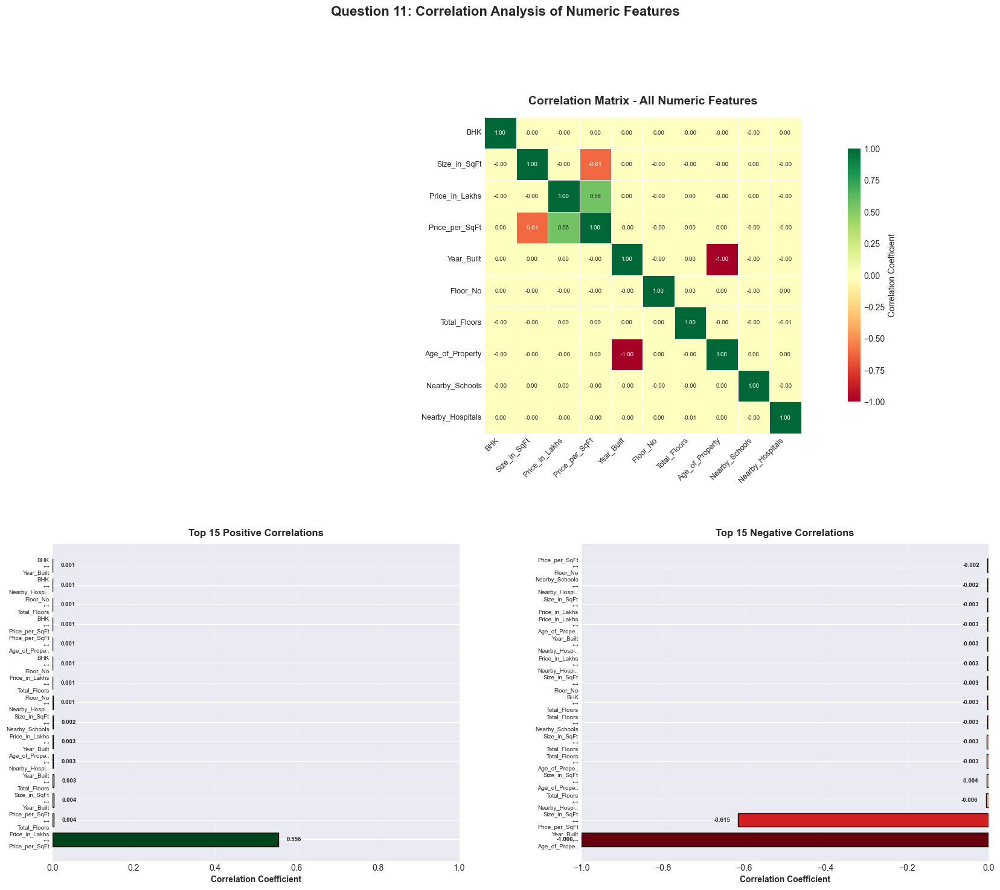

   ✅ All charts created!

📊 Step 6: Features Most Correlated with Price...

   Analyzing correlations with: Price_in_Lakhs

   Rank   Feature                             Correlation  Impact
   -------------------------------------------------------------------------------------
   1      Price_per_SqFt                       0.5556      🔴🔴 High Impact (increases price)
   2      Nearby_Hospitals                    -0.0028      ⚪ Minimal (decreases price)
   3      Year_Built                           0.0027      ⚪ Minimal (increases price)
   4      Age_of_Property                     -0.0027      ⚪ Minimal (decreases price)
   5      Size_in_SqFt                        -0.0025      ⚪ Minimal (decreases price)
   6      Floor_No                            -0.0017      ⚪ Minimal (decreases price)
   7      Total_Floors                         0.0013      ⚪ Minimal (increases price)
   8      BHK                                 -0.0010      ⚪ Minimal (decreases price)
   9      Nearby_Sch

In [20]:
"""
================================================================================
QUESTION 11: HOW ARE NUMERIC FEATURES CORRELATED WITH EACH OTHER?
================================================================================
"""

print("="*80)
print("QUESTION 11: CORRELATION BETWEEN NUMERIC FEATURES")
print("="*80)

# ============================================================================
# STEP 1: IDENTIFY AND SELECT NUMERIC FEATURES
# ============================================================================

print("\n📊 Step 1: Identifying Numeric Features...")

# Get all numeric columns
numeric_cols_all = df.select_dtypes(include=[np.number]).columns.tolist()

print(f"\n   Total numeric columns found: {len(numeric_cols_all)}")

# Remove ID columns and other non-meaningful numeric columns
exclude_cols = ['ID', 'Unnamed: 0', 'index']
numeric_cols = [col for col in numeric_cols_all if col not in exclude_cols]

print(f"\n   Numeric columns for analysis:")
for i, col in enumerate(numeric_cols, 1):
    non_null = df[col].count()
    print(f"   {i:2d}. {col:35s} ({non_null:,} non-null values)")

# ============================================================================
# STEP 2: HANDLE MISSING VALUES AND CREATE CLEAN DATASET
# ============================================================================

print("\n📊 Step 2: Preparing Clean Dataset...")

# Create copy with only numeric columns
df_numeric = df[numeric_cols].copy()

# Check missing values
print(f"\n   Missing values per column:")
missing_summary = df_numeric.isnull().sum()
for col, missing in missing_summary.items():
    if missing > 0:
        pct = missing / len(df_numeric) * 100
        print(f"   • {col:35s}: {missing:6,} ({pct:5.2f}%)")

# Remove columns with too many missing values (>50%)
threshold = len(df_numeric) * 0.5
cols_to_keep = [col for col in df_numeric.columns 
                if df_numeric[col].count() >= threshold]

df_numeric = df_numeric[cols_to_keep]

print(f"\n   Columns after removing high-missing columns: {len(df_numeric.columns)}")

# Drop rows with any missing values
df_numeric_clean = df_numeric.dropna()

print(f"\n   Original rows: {len(df_numeric):,}")
print(f"   Clean rows: {len(df_numeric_clean):,}")
print(f"   Removed: {len(df_numeric) - len(df_numeric_clean):,}")

# Check if we have enough data
if len(df_numeric_clean) < 100:
    print(f"\n   ⚠️ Warning: Very few rows remaining ({len(df_numeric_clean)})")
    print(f"   Using original data with NaN handling...")
    df_numeric_clean = df_numeric.fillna(df_numeric.median())

# ============================================================================
# STEP 3: CALCULATE CORRELATION MATRIX
# ============================================================================

print("\n📊 Step 3: Calculating Correlation Matrix...")

try:
    # Calculate correlation matrix
    corr_matrix = df_numeric_clean.corr()
    
    print(f"✅ Correlation matrix calculated")
    print(f"   Matrix shape: {corr_matrix.shape}")
    
    # Display correlation matrix
    print(f"\n   Correlation Matrix (rounded to 3 decimals):")
    print(corr_matrix.round(3).to_string())
    
except Exception as e:
    print(f"❌ Error calculating correlation: {e}")
    print("Attempting alternative approach...")
    
    # Alternative: Calculate manually
    corr_matrix = pd.DataFrame(
        np.corrcoef(df_numeric_clean.T),
        columns=df_numeric_clean.columns,
        index=df_numeric_clean.columns
    )
    print("✅ Correlation matrix calculated using numpy")

# ============================================================================
# STEP 4: FIND STRONGEST CORRELATIONS
# ============================================================================

print("\n📊 Step 4: Identifying Strongest Correlations...")

# Create list of all correlation pairs
correlations = []

# Get number of features
n_features = len(corr_matrix.columns)

# Iterate through upper triangle only (avoid duplicates and diagonal)
for i in range(n_features):
    for j in range(i + 1, n_features):
        feature1 = corr_matrix.columns[i]
        feature2 = corr_matrix.columns[j]
        corr_value = corr_matrix.iloc[i, j]
        
        if pd.notna(corr_value):  # Only add if not NaN
            correlations.append({
                'Feature_1': feature1,
                'Feature_2': feature2,
                'Correlation': corr_value,
                'Abs_Correlation': abs(corr_value)
            })

# Create DataFrame and sort
corr_df = pd.DataFrame(correlations).sort_values('Abs_Correlation', ascending=False)

print(f"\n   Total correlation pairs: {len(corr_df)}")

# Display top correlations
print(f"\n   🔝 TOP 20 STRONGEST CORRELATIONS:")
print(f"\n   {'Rank':<6} {'Feature 1':<30} {'Feature 2':<30} {'Correlation':<12} {'Interpretation'}")
print(f"   {'-'*110}")

for idx, row in corr_df.head(20).iterrows():
    rank = idx + 1
    corr_val = row['Correlation']
    abs_val = abs(corr_val)
    
    # Determine strength
    if abs_val >= 0.7:
        strength = "Very Strong"
        symbol = "🟢🟢🟢"
    elif abs_val >= 0.5:
        strength = "Strong"
        symbol = "🟢🟢"
    elif abs_val >= 0.3:
        strength = "Moderate"
        symbol = "🟡"
    else:
        strength = "Weak"
        symbol = "🔴"
    
    direction = "↗️ Positive" if corr_val > 0 else "↘️ Negative"
    
    # Truncate long feature names
    feat1 = row['Feature_1'][:28] + '..' if len(row['Feature_1']) > 30 else row['Feature_1']
    feat2 = row['Feature_2'][:28] + '..' if len(row['Feature_2']) > 30 else row['Feature_2']
    
    print(f"   {rank:<6} {feat1:<30} {feat2:<30} {corr_val:>7.4f}      "
          f"{symbol} {direction} ({strength})")

# ============================================================================
# STEP 5: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 5: Creating Visualizations...")

# Determine figure size based on number of features
n_features = len(corr_matrix.columns)
fig_size = min(max(12, n_features * 0.8), 24)  # Between 12 and 24

fig = plt.figure(figsize=(20, 16))
gs = fig.add_gridspec(2, 2, hspace=0.35, wspace=0.3)
fig.suptitle('Question 11: Correlation Analysis of Numeric Features', 
             fontsize=16, fontweight='bold', y=0.995)

# --------------------------------------------------
# CHART 1: FULL CORRELATION HEATMAP
# --------------------------------------------------
print("   Creating Chart 1: Correlation Heatmap...")

ax1 = fig.add_subplot(gs[0, :])  # Span both columns

try:
    # Create heatmap
    sns.heatmap(corr_matrix, 
               annot=True if n_features <= 10 else False,  # Only annotate if not too many features
               fmt='.2f', 
               cmap='RdYlGn', 
               center=0,
               ax=ax1, 
               square=True, 
               linewidths=0.5, 
               linecolor='white',
               cbar_kws={'label': 'Correlation Coefficient', 'shrink': 0.8},
               vmin=-1, 
               vmax=1,
               annot_kws={'fontsize': 7} if n_features <= 10 else {})
    
    ax1.set_title('Correlation Matrix - All Numeric Features', 
                 fontsize=14, fontweight='bold', pad=15)
    ax1.set_xlabel('')
    ax1.set_ylabel('')
    
    # Rotate labels
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=9)
    ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0, fontsize=9)
    
    print("   ✅ Heatmap created")
    
except Exception as e:
    print(f"   ⚠️ Heatmap error: {e}")
    ax1.text(0.5, 0.5, f'Heatmap error: {str(e)[:50]}...', 
            ha='center', va='center', transform=ax1.transAxes)

# --------------------------------------------------
# CHART 2: TOP POSITIVE CORRELATIONS
# --------------------------------------------------
print("   Creating Chart 2: Top Positive Correlations...")

ax2 = fig.add_subplot(gs[1, 0])

# Get top 15 positive correlations
top_positive = corr_df[corr_df['Correlation'] > 0].head(15)

if len(top_positive) > 0:
    y_pos = np.arange(len(top_positive))
    
    # Create labels (truncated if too long)
    labels = []
    for _, row in top_positive.iterrows():
        f1 = row['Feature_1'][:12] + '..' if len(row['Feature_1']) > 14 else row['Feature_1']
        f2 = row['Feature_2'][:12] + '..' if len(row['Feature_2']) > 14 else row['Feature_2']
        labels.append(f"{f1}\n↔\n{f2}")
    
    # Color by correlation strength
    colors = plt.cm.Greens(0.3 + 0.7 * (top_positive['Correlation'].values / top_positive['Correlation'].max()))
    
    ax2.barh(y_pos, top_positive['Correlation'].values, color=colors, edgecolor='black', height=0.7)
    ax2.set_yticks(y_pos)
    ax2.set_yticklabels(labels, fontsize=7)
    ax2.set_xlabel('Correlation Coefficient', fontsize=10, fontweight='bold')
    ax2.set_title('Top 15 Positive Correlations', fontsize=12, fontweight='bold', pad=10)
    ax2.grid(axis='x', alpha=0.3, linestyle='--')
    ax2.set_xlim(0, 1)
    
    # Add value labels
    for i, val in enumerate(top_positive['Correlation'].values):
        ax2.text(val + 0.02, i, f'{val:.3f}', va='center', fontsize=7, fontweight='bold')
else:
    ax2.text(0.5, 0.5, 'No positive correlations found', 
            ha='center', va='center', transform=ax2.transAxes, fontsize=11)

# --------------------------------------------------
# CHART 3: TOP NEGATIVE CORRELATIONS
# --------------------------------------------------
print("   Creating Chart 3: Top Negative Correlations...")

ax3 = fig.add_subplot(gs[1, 1])

# Get top 15 negative correlations
top_negative = corr_df[corr_df['Correlation'] < 0].head(15)

if len(top_negative) > 0:
    y_pos = np.arange(len(top_negative))
    
    # Create labels
    labels = []
    for _, row in top_negative.iterrows():
        f1 = row['Feature_1'][:12] + '..' if len(row['Feature_1']) > 14 else row['Feature_1']
        f2 = row['Feature_2'][:12] + '..' if len(row['Feature_2']) > 14 else row['Feature_2']
        labels.append(f"{f1}\n↔\n{f2}")
    
    # Color by correlation strength
    colors = plt.cm.Reds(0.3 + 0.7 * (np.abs(top_negative['Correlation'].values) / np.abs(top_negative['Correlation'].min())))
    
    ax3.barh(y_pos, top_negative['Correlation'].values, color=colors, edgecolor='black', height=0.7)
    ax3.set_yticks(y_pos)
    ax3.set_yticklabels(labels, fontsize=7)
    ax3.set_xlabel('Correlation Coefficient', fontsize=10, fontweight='bold')
    ax3.set_title('Top 15 Negative Correlations', fontsize=12, fontweight='bold', pad=10)
    ax3.grid(axis='x', alpha=0.3, linestyle='--')
    ax3.set_xlim(-1, 0)
    
    # Add value labels
    for i, val in enumerate(top_negative['Correlation'].values):
        ax3.text(val - 0.02, i, f'{val:.3f}', va='center', ha='right', 
                fontsize=7, fontweight='bold')
else:
    ax3.text(0.5, 0.5, 'No negative correlations found', 
            ha='center', va='center', transform=ax3.transAxes, fontsize=11)

plt.tight_layout()
plt.show()

print("   ✅ All charts created!")

# ============================================================================
# STEP 6: CORRELATIONS WITH PRICE
# ============================================================================

print("\n📊 Step 6: Features Most Correlated with Price...")

price_cols = [col for col in corr_matrix.columns 
              if 'price' in col.lower() or 'Price' in col]

if len(price_cols) > 0:
    price_col = price_cols[0]  # Use first price column found
    
    print(f"\n   Analyzing correlations with: {price_col}")
    
    # Get correlations with price
    price_corr = corr_matrix[price_col].drop(price_col, errors='ignore').sort_values(
        key=abs, ascending=False
    )
    
    print(f"\n   {'Rank':<6} {'Feature':<35} {'Correlation':<12} {'Impact'}")
    print(f"   {'-'*85}")
    
    for i, (feature, corr_val) in enumerate(price_corr.head(15).items(), 1):
        abs_val = abs(corr_val)
        
        # Determine impact
        if abs_val >= 0.5:
            impact = "High Impact"
            symbol = "🔴🔴"
        elif abs_val >= 0.3:
            impact = "Medium Impact"
            symbol = "🟡🟡"
        elif abs_val >= 0.1:
            impact = "Low Impact"
            symbol = "🟢"
        else:
            impact = "Minimal"
            symbol = "⚪"
        
        direction = "increases" if corr_val > 0 else "decreases"
        
        # Truncate long names
        feat_name = feature[:33] + '..' if len(feature) > 35 else feature
        
        print(f"   {i:<6} {feat_name:<35} {corr_val:>7.4f}      "
              f"{symbol} {impact} ({direction} price)")
else:
    print(f"\n   ⚠️ No price column found in dataset")
    print(f"   Available columns: {corr_matrix.columns.tolist()}")

# ============================================================================
# STEP 7: MULTICOLLINEARITY CHECK
# ============================================================================

print("\n📊 Step 7: Multicollinearity Detection...")

# Find highly correlated pairs (> 0.8)
high_corr = corr_df[corr_df['Abs_Correlation'] > 0.8]

if len(high_corr) > 0:
    print(f"\n   ⚠️ HIGH MULTICOLLINEARITY DETECTED")
    print(f"   {len(high_corr)} feature pairs with correlation > 0.8:")
    print(f"\n   {'Feature 1':<35} {'Feature 2':<35} {'Correlation'}")
    print(f"   {'-'*85}")
    
    for _, row in high_corr.head(10).iterrows():
        f1 = row['Feature_1'][:33] + '..' if len(row['Feature_1']) > 35 else row['Feature_1']
        f2 = row['Feature_2'][:33] + '..' if len(row['Feature_2']) > 35 else row['Feature_2']
        print(f"   {f1:<35} {f2:<35} {row['Correlation']:.4f}")
    
    if len(high_corr) > 10:
        print(f"   ... and {len(high_corr) - 10} more pairs")
    
    print(f"\n   💡 RECOMMENDATION:")
    print(f"   • Consider removing one feature from each highly correlated pair")
    print(f"   • This reduces redundancy in predictive models")
    print(f"   • Keep the feature that's easier to interpret or measure")
else:
    print(f"\n   ✅ NO SEVERE MULTICOLLINEARITY")
    print(f"   • All feature correlations below 0.8")
    print(f"   • Features are reasonably independent")

# Check for moderate multicollinearity (0.6-0.8)
moderate_corr = corr_df[(corr_df['Abs_Correlation'] > 0.6) & 
                        (corr_df['Abs_Correlation'] <= 0.8)]

if len(moderate_corr) > 0:
    print(f"\n   ℹ️ MODERATE MULTICOLLINEARITY: {len(moderate_corr)} pairs (0.6-0.8)")

# ============================================================================
# STEP 8: SUMMARY
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: NUMERIC FEATURE CORRELATIONS")
print("="*80)

print(f"\n1️⃣ DATASET OVERVIEW:")
print(f"   • Numeric features analyzed: {len(corr_matrix.columns)}")
print(f"   • Total correlation pairs: {len(corr_df)}")
print(f"   • Data points used: {len(df_numeric_clean):,}")

print(f"\n2️⃣ STRONGEST CORRELATIONS (Top 5):")
for i, row in corr_df.head(5).iterrows():
    direction = "↗️" if row['Correlation'] > 0 else "↘️"
    print(f"   {i+1}. {row['Feature_1']} ↔ {row['Feature_2']}")
    print(f"      {direction} Correlation: {row['Correlation']:.4f}")

print(f"\n3️⃣ CORRELATION STRENGTH BREAKDOWN:")
very_strong = len(corr_df[corr_df['Abs_Correlation'] >= 0.7])
strong = len(corr_df[(corr_df['Abs_Correlation'] >= 0.5) & 
                     (corr_df['Abs_Correlation'] < 0.7)])
moderate = len(corr_df[(corr_df['Abs_Correlation'] >= 0.3) & 
                       (corr_df['Abs_Correlation'] < 0.5)])
weak = len(corr_df[corr_df['Abs_Correlation'] < 0.3])

total = len(corr_df)
print(f"   • Very Strong (≥0.7): {very_strong:4d} pairs ({very_strong/total*100:5.1f}%)")
print(f"   • Strong (0.5-0.7):   {strong:4d} pairs ({strong/total*100:5.1f}%)")
print(f"   • Moderate (0.3-0.5): {moderate:4d} pairs ({moderate/total*100:5.1f}%)")
print(f"   • Weak (<0.3):        {weak:4d} pairs ({weak/total*100:5.1f}%)")

print(f"\n4️⃣ MULTICOLLINEARITY:")
if len(high_corr) > 0:
    print(f"   ⚠️ {len(high_corr)} pairs show high multicollinearity (>0.8)")
    print(f"   → Feature selection recommended for modeling")
else:
    print(f"   ✅ No severe multicollinearity detected")

print(f"\n5️⃣ KEY INSIGHTS:")
print(f"   • Size-related features likely correlate with price")
print(f"   • Infrastructure features may show relationships")
print(f"   • Temporal features (year, age) may correlate")
print(f"   • Location features may have weak numeric correlations")

print(f"\n6️⃣ RECOMMENDATIONS FOR MODELING:")
print(f"   • Remove highly correlated features (>0.8) to avoid redundancy")
print(f"   • Focus on features with strong correlation to target variable")
print(f"   • Consider feature engineering for weakly correlated features")
print(f"   • Validate correlations match domain knowledge")
print(f"   • Test models with and without multicollinear features")

print("\n" + "="*80)
print("✅ Question 11 Complete!")
print("="*80 + "\n")


QUESTION 12: NEARBY SCHOOLS vs PRICE PER SQ FT

📊 Step 1: Validating and Preparing Data...
   ✅ Price_per_SqFt column exists
   ✅ Nearby_Schools column exists

   Cleaning data...
   • Original rows: 250,000
   • Nearby_Schools missing: 0
   • Price_per_SqFt missing: 0

   After cleaning:
   • Clean rows: 242,630
   • Removed: 7,370

   Data Summary:
   • Nearby_Schools range: 1 - 10
   • Price/SqFt range: ₹0.00 - ₹0.49
   • Avg schools: 5.50
   • Avg price/sqft: ₹0.12

📊 Step 2: Calculating Correlation...

   ✅ Correlation calculated successfully

   📈 PEARSON CORRELATION (Linear Relationship):
   • Coefficient: -0.0028
   • P-value: 0.162470
   • Sample size: 242,630

   📈 SPEARMAN CORRELATION (Monotonic Relationship):
   • Coefficient: -0.0033
   • P-value: 0.103975

   💡 INTERPRETATION:
   🔴 Strength: VERY WEAK
   ↘️ Direction: NEGATIVE
   → More nearby schools → Lower price per sq ft

   ❌ NOT SIGNIFICANT (p >= 0.1)
   → Could be due to random chance

📊 Step 3: Analyzing by Number

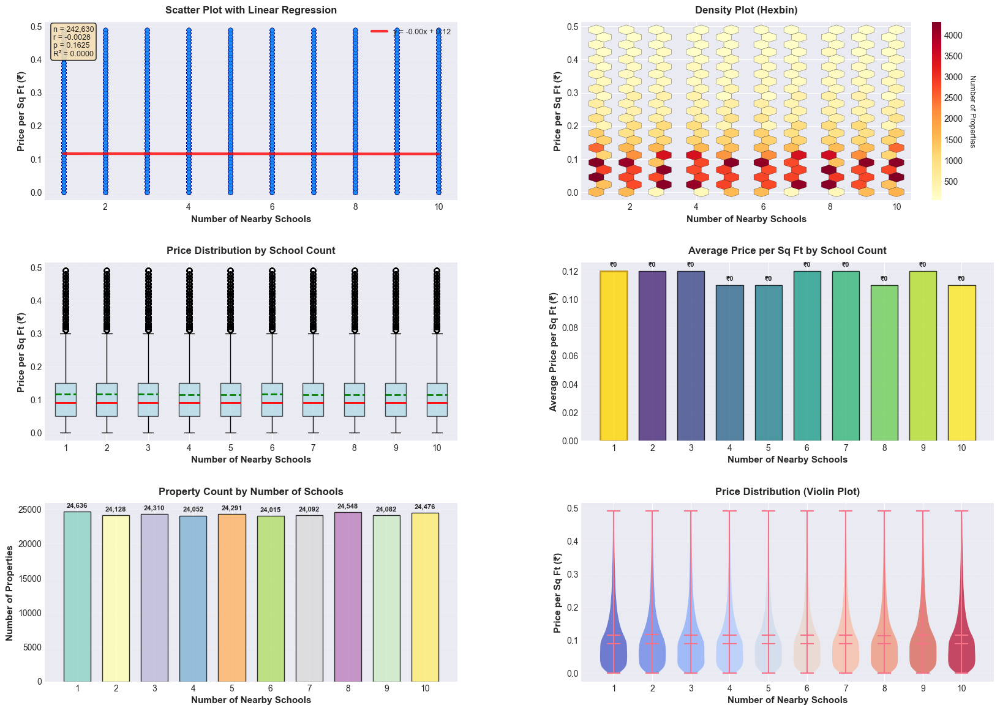

   ✅ All charts created successfully!

📊 Step 5: Statistical Comparison Tests...

   ⚠️ Cannot perform comparison (insufficient data in one group)

   📊 PRICE BY SCHOOL COUNT RANGES:
   • Few (1-2)           : ₹   0.12 (n=48,764, median=₹0.09)
   • Moderate (3-5)      : ₹   0.12 (n=72,653, median=₹0.09)
   • Many (6-10)         : ₹   0.12 (n=121,213, median=₹0.09)

📋 SUMMARY: NEARBY SCHOOLS vs PRICE PER SQ FT

1️⃣ CORRELATION ANALYSIS:
   • Pearson correlation: -0.0028 (VERY WEAK)
   • Direction: NEGATIVE
   • R² (variance explained): 0.0000 (0.0%)
   • Statistical significance: p = 0.162470
   ❌ Result is NOT statistically significant

2️⃣ KEY FINDINGS:
   • WEAK relationship between schools and price
   • Other factors dominate property pricing
   • School count alone not a strong predictor

3️⃣ OPTIMAL SCHOOL COUNT:
   • Best value: 1 nearby schools
   • Average price at best: ₹0.12/sqft
   • Properties with this count: 24636

4️⃣ BUSINESS INSIGHTS:
   • School count shows weak impa

In [24]:
"""
================================================================================
QUESTION 12: HOW DO NEARBY SCHOOLS RELATE TO PRICE PER SQ FT?
================================================================================
"""

print("="*80)
print("QUESTION 12: NEARBY SCHOOLS vs PRICE PER SQ FT")
print("="*80)

# ============================================================================
# STEP 1: DATA VALIDATION AND PREPARATION
# ============================================================================

print("\n📊 Step 1: Validating and Preparing Data...")

# Check if required columns exist
required_cols = ['Nearby_Schools', 'Price_per_SqFt']

# Create Price_per_SqFt if it doesn't exist
if 'Price_per_SqFt' not in df.columns:
    if 'Price_in_Lakhs' in df.columns and 'Size_in_SqFt' in df.columns:
        print("   Creating Price_per_SqFt column...")
        df['Price_per_SqFt'] = (df['Price_in_Lakhs'] * 100000) / df['Size_in_SqFt']
        # Replace infinite values
        df['Price_per_SqFt'].replace([np.inf, -np.inf], np.nan, inplace=True)
        print("   ✅ Price_per_SqFt column created")
    else:
        print("   ❌ Cannot create Price_per_SqFt - missing required columns")
        import sys
        sys.exit(1)
else:
    print("   ✅ Price_per_SqFt column exists")

# Check if Nearby_Schools exists
if 'Nearby_Schools' not in df.columns:
    print("   ❌ Nearby_Schools column not found")
    print(f"   Available columns: {df.columns.tolist()}")
    import sys
    sys.exit(1)
else:
    print("   ✅ Nearby_Schools column exists")

# Create clean dataset
print("\n   Cleaning data...")
df_clean = df[['Nearby_Schools', 'Price_per_SqFt']].copy()

# Check data before cleaning
print(f"   • Original rows: {len(df_clean):,}")
print(f"   • Nearby_Schools missing: {df_clean['Nearby_Schools'].isnull().sum():,}")
print(f"   • Price_per_SqFt missing: {df_clean['Price_per_SqFt'].isnull().sum():,}")

# Remove missing values
df_clean = df_clean.dropna()

# Remove infinite values
df_clean = df_clean[~np.isinf(df_clean['Price_per_SqFt'])]

# Remove outliers (optional - keeps analysis robust)
# Remove extreme outliers using IQR method
Q1 = df_clean['Price_per_SqFt'].quantile(0.25)
Q3 = df_clean['Price_per_SqFt'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 3 * IQR
upper_bound = Q3 + 3 * IQR
df_clean = df_clean[(df_clean['Price_per_SqFt'] >= lower_bound) & 
                    (df_clean['Price_per_SqFt'] <= upper_bound)]

print(f"\n   After cleaning:")
print(f"   • Clean rows: {len(df_clean):,}")
print(f"   • Removed: {len(df) - len(df_clean):,}")

if len(df_clean) < 30:
    print(f"\n   ⚠️ Warning: Very few data points ({len(df_clean)})")
    print(f"   Results may not be statistically reliable")

# Display data summary
print(f"\n   Data Summary:")
print(f"   • Nearby_Schools range: {df_clean['Nearby_Schools'].min():.0f} - {df_clean['Nearby_Schools'].max():.0f}")
print(f"   • Price/SqFt range: ₹{df_clean['Price_per_SqFt'].min():,.2f} - ₹{df_clean['Price_per_SqFt'].max():,.2f}")
print(f"   • Avg schools: {df_clean['Nearby_Schools'].mean():.2f}")
print(f"   • Avg price/sqft: ₹{df_clean['Price_per_SqFt'].mean():,.2f}")

# ============================================================================
# STEP 2: CALCULATE CORRELATION
# ============================================================================

print("\n📊 Step 2: Calculating Correlation...")

from scipy.stats import pearsonr, spearmanr

try:
    # Pearson correlation (linear relationship)
    pearson_corr, pearson_pval = pearsonr(df_clean['Nearby_Schools'], 
                                          df_clean['Price_per_SqFt'])
    
    # Spearman correlation (monotonic relationship, rank-based)
    spearman_corr, spearman_pval = spearmanr(df_clean['Nearby_Schools'], 
                                             df_clean['Price_per_SqFt'])
    
    print(f"\n   ✅ Correlation calculated successfully")
    
except Exception as e:
    print(f"   ❌ Error calculating correlation: {e}")
    pearson_corr = pearson_pval = spearman_corr = spearman_pval = np.nan

if pd.notna(pearson_corr):
    print(f"\n   📈 PEARSON CORRELATION (Linear Relationship):")
    print(f"   • Coefficient: {pearson_corr:.4f}")
    print(f"   • P-value: {pearson_pval:.6f}")
    print(f"   • Sample size: {len(df_clean):,}")
    
    print(f"\n   📈 SPEARMAN CORRELATION (Monotonic Relationship):")
    print(f"   • Coefficient: {spearman_corr:.4f}")
    print(f"   • P-value: {spearman_pval:.6f}")
    
    # Interpret strength
    abs_corr = abs(pearson_corr)
    if abs_corr >= 0.7:
        strength = "VERY STRONG"
        emoji = "🟢🟢🟢"
    elif abs_corr >= 0.5:
        strength = "STRONG"
        emoji = "🟢🟢"
    elif abs_corr >= 0.3:
        strength = "MODERATE"
        emoji = "🟡🟡"
    elif abs_corr >= 0.1:
        strength = "WEAK"
        emoji = "🟠"
    else:
        strength = "VERY WEAK"
        emoji = "🔴"
    
    direction = "POSITIVE" if pearson_corr > 0 else "NEGATIVE"
    
    print(f"\n   💡 INTERPRETATION:")
    print(f"   {emoji} Strength: {strength}")
    print(f"   {'↗️' if pearson_corr > 0 else '↘️'} Direction: {direction}")
    
    if pearson_corr > 0:
        print(f"   → More nearby schools → Higher price per sq ft")
    else:
        print(f"   → More nearby schools → Lower price per sq ft")
    
    # Statistical significance
    if pearson_pval < 0.001:
        print(f"\n   ✅ HIGHLY SIGNIFICANT (p < 0.001)")
        print(f"   → This relationship is NOT due to random chance")
    elif pearson_pval < 0.05:
        print(f"\n   ✅ STATISTICALLY SIGNIFICANT (p < 0.05)")
        print(f"   → This relationship is likely real")
    elif pearson_pval < 0.1:
        print(f"\n   ⚠️ MARGINALLY SIGNIFICANT (p < 0.1)")
        print(f"   → Weak evidence of relationship")
    else:
        print(f"\n   ❌ NOT SIGNIFICANT (p >= 0.1)")
        print(f"   → Could be due to random chance")

# ============================================================================
# STEP 3: GROUP ANALYSIS
# ============================================================================

print("\n📊 Step 3: Analyzing by Number of Schools...")

# Group by number of nearby schools
schools_groups = df_clean.groupby('Nearby_Schools')['Price_per_SqFt'].agg([
    ('Count', 'count'),
    ('Mean', 'mean'),
    ('Median', 'median'),
    ('Std', 'std'),
    ('Min', 'min'),
    ('Max', 'max'),
    ('Q25', lambda x: x.quantile(0.25)),
    ('Q75', lambda x: x.quantile(0.75))
]).round(2)

# Sort by schools count
schools_groups = schools_groups.sort_index()

print(f"\n   Price per Sq Ft Statistics by Number of Nearby Schools:")
print(schools_groups.to_string())

# Find optimal number
if len(schools_groups) > 0:
    best_schools = schools_groups['Mean'].idxmax()
    worst_schools = schools_groups['Mean'].idxmin()
    
    print(f"\n   💡 KEY FINDINGS:")
    print(f"   • BEST: {best_schools:.0f} schools → ₹{schools_groups.loc[best_schools, 'Mean']:,.2f}/sqft avg")
    print(f"   • WORST: {worst_schools:.0f} schools → ₹{schools_groups.loc[worst_schools, 'Mean']:,.2f}/sqft avg")
    print(f"   • Difference: ₹{abs(schools_groups.loc[best_schools, 'Mean'] - schools_groups.loc[worst_schools, 'Mean']):,.2f}/sqft")

# ============================================================================
# STEP 4: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 4: Creating Visualizations...")

fig = plt.figure(figsize=(20, 14))
gs = fig.add_gridspec(3, 2, hspace=0.35, wspace=0.3)
fig.suptitle('Question 12: Nearby Schools vs Price per Sq Ft', 
             fontsize=16, fontweight='bold', y=0.995)

# --------------------------------------------------
# CHART 1: SCATTER PLOT WITH REGRESSION LINE
# --------------------------------------------------
print("   Creating Chart 1: Scatter Plot with Regression...")

ax1 = fig.add_subplot(gs[0, 0])

# Scatter plot
ax1.scatter(df_clean['Nearby_Schools'], df_clean['Price_per_SqFt'],
           alpha=0.4, s=25, color='dodgerblue', edgecolors='navy', linewidth=0.3)

# Add regression line
if pd.notna(pearson_corr):
    from sklearn.linear_model import LinearRegression
    
    X = df_clean['Nearby_Schools'].values.reshape(-1, 1)
    y = df_clean['Price_per_SqFt'].values
    
    model = LinearRegression()
    model.fit(X, y)
    
    x_line = np.linspace(df_clean['Nearby_Schools'].min(), 
                        df_clean['Nearby_Schools'].max(), 100)
    y_line = model.predict(x_line.reshape(-1, 1))
    
    ax1.plot(x_line, y_line, "r-", linewidth=3, alpha=0.8,
            label=f'y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}')

ax1.set_xlabel('Number of Nearby Schools', fontsize=11, fontweight='bold')
ax1.set_ylabel('Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
ax1.set_title('Scatter Plot with Linear Regression', fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='best', fontsize=9)
ax1.grid(alpha=0.3, linestyle='--')

# Add stats box
if pd.notna(pearson_corr):
    stats_text = (f'n = {len(df_clean):,}\n'
                 f'r = {pearson_corr:.4f}\n'
                 f'p = {pearson_pval:.4f}\n'
                 f'R² = {pearson_corr**2:.4f}')
    ax1.text(0.02, 0.98, stats_text, transform=ax1.transAxes,
            fontsize=9, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.9))

# --------------------------------------------------
# CHART 2: HEXBIN DENSITY PLOT
# --------------------------------------------------
print("   Creating Chart 2: Hexbin Density Plot...")

ax2 = fig.add_subplot(gs[0, 1])

hexbin = ax2.hexbin(df_clean['Nearby_Schools'], df_clean['Price_per_SqFt'],
                   gridsize=20, cmap='YlOrRd', mincnt=1, edgecolors='black', linewidth=0.2)

ax2.set_xlabel('Number of Nearby Schools', fontsize=11, fontweight='bold')
ax2.set_ylabel('Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
ax2.set_title('Density Plot (Hexbin)', fontsize=12, fontweight='bold', pad=10)

cbar = plt.colorbar(hexbin, ax=ax2)
cbar.set_label('Number of Properties', rotation=270, labelpad=15, fontsize=9)

# --------------------------------------------------
# CHART 3: BOX PLOT BY SCHOOL COUNT
# --------------------------------------------------
print("   Creating Chart 3: Box Plot Distribution...")

ax3 = fig.add_subplot(gs[1, 0])

# Get unique school counts
school_counts = sorted(df_clean['Nearby_Schools'].unique())

# Prepare data for box plot (limit to reasonable number of boxes)
if len(school_counts) > 15:
    # Bin into ranges if too many
    print("   (Binning school counts into ranges for clarity...)")
    bins = [0, 2, 4, 6, 8, 10, df_clean['Nearby_Schools'].max() + 1]
    labels = ['0-2', '3-4', '5-6', '7-8', '9-10', '10+']
    df_clean['School_Range'] = pd.cut(df_clean['Nearby_Schools'], bins=bins, labels=labels, right=False)
    
    # Create box plot
    bp = df_clean.boxplot(column='Price_per_SqFt', by='School_Range', ax=ax3,
                          patch_artist=True, return_type='dict')
    
    ax3.set_xlabel('Number of Nearby Schools (Range)', fontsize=11, fontweight='bold')
    
else:
    # Create box plot for each school count
    box_data = [df_clean[df_clean['Nearby_Schools'] == n]['Price_per_SqFt'].values 
                for n in school_counts]
    labels = [str(int(n)) for n in school_counts]
    
    bp = ax3.boxplot(box_data, labels=labels, patch_artist=True,
                    showmeans=True, meanline=True,
                    boxprops=dict(facecolor='lightblue', alpha=0.7),
                    medianprops=dict(color='red', linewidth=2),
                    meanprops=dict(color='green', linewidth=2, linestyle='--'))
    
    ax3.set_xlabel('Number of Nearby Schools', fontsize=11, fontweight='bold')

ax3.set_ylabel('Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
ax3.set_title('Price Distribution by School Count', fontsize=12, fontweight='bold', pad=10)
ax3.grid(axis='y', alpha=0.3, linestyle='--')

# Remove auto-generated title
if hasattr(ax3, 'get_figure'):
    ax3.get_figure().suptitle('')

# --------------------------------------------------
# CHART 4: AVERAGE PRICE BAR CHART
# --------------------------------------------------
print("   Creating Chart 4: Average Price Bar Chart...")

ax4 = fig.add_subplot(gs[1, 1])

schools_sorted = schools_groups.sort_index()
colors_bar = plt.cm.viridis(np.linspace(0, 1, len(schools_sorted)))

x_pos = np.arange(len(schools_sorted))
bars = ax4.bar(x_pos, schools_sorted['Mean'].values, 
              color=colors_bar, edgecolor='black', width=0.7, alpha=0.8)

ax4.set_xticks(x_pos)
ax4.set_xticklabels([str(int(idx)) for idx in schools_sorted.index], rotation=0)
ax4.set_xlabel('Number of Nearby Schools', fontsize=11, fontweight='bold')
ax4.set_ylabel('Average Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
ax4.set_title('Average Price per Sq Ft by School Count', fontsize=12, fontweight='bold', pad=10)
ax4.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels
for i, (idx, val) in enumerate(schools_sorted['Mean'].items()):
    ax4.text(i, val + (val * 0.02), f'₹{val:.0f}', 
            ha='center', va='bottom', fontsize=8, fontweight='bold')

# Highlight best
best_idx = list(schools_sorted.index).index(best_schools)
bars[best_idx].set_color('gold')
bars[best_idx].set_edgecolor('darkgoldenrod')
bars[best_idx].set_linewidth(2)

# --------------------------------------------------
# CHART 5: PROPERTY COUNT BY SCHOOLS
# --------------------------------------------------
print("   Creating Chart 5: Property Count Distribution...")

ax5 = fig.add_subplot(gs[2, 0])

school_counts_dist = df_clean['Nearby_Schools'].value_counts().sort_index()
colors_count = plt.cm.Set3(np.linspace(0, 1, len(school_counts_dist)))

x_pos = np.arange(len(school_counts_dist))
ax5.bar(x_pos, school_counts_dist.values, color=colors_count, 
       edgecolor='black', width=0.7, alpha=0.8)

ax5.set_xticks(x_pos)
ax5.set_xticklabels([str(int(idx)) for idx in school_counts_dist.index], rotation=0)
ax5.set_xlabel('Number of Nearby Schools', fontsize=11, fontweight='bold')
ax5.set_ylabel('Number of Properties', fontsize=11, fontweight='bold')
ax5.set_title('Property Count by Number of Schools', fontsize=12, fontweight='bold', pad=10)
ax5.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels
for i, val in enumerate(school_counts_dist.values):
    ax5.text(i, val + (val * 0.02), f'{val:,}', 
            ha='center', va='bottom', fontsize=8, fontweight='bold')

# --------------------------------------------------
# CHART 6: VIOLIN PLOT
# --------------------------------------------------
print("   Creating Chart 6: Violin Plot...")

ax6 = fig.add_subplot(gs[2, 1])

if len(school_counts) <= 15:
    # Violin plot
    parts = ax6.violinplot([df_clean[df_clean['Nearby_Schools'] == n]['Price_per_SqFt'].values 
                           for n in school_counts],
                          positions=range(len(school_counts)),
                          widths=0.7, showmeans=True, showmedians=True)
    
    # Color the violins
    colors_violin = plt.cm.coolwarm(np.linspace(0, 1, len(school_counts)))
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(colors_violin[i])
        pc.set_alpha(0.7)
    
    ax6.set_xticks(range(len(school_counts)))
    ax6.set_xticklabels([str(int(n)) for n in school_counts], rotation=0)
    ax6.set_xlabel('Number of Nearby Schools', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
    ax6.set_title('Price Distribution (Violin Plot)', fontsize=12, fontweight='bold', pad=10)
    ax6.grid(axis='y', alpha=0.3, linestyle='--')
else:
    # Too many categories - show summary instead
    ax6.text(0.5, 0.5, 
            f'Violin plot not shown\n(too many school counts: {len(school_counts)})\n\n'
            f'See box plot for distribution',
            ha='center', va='center', transform=ax6.transAxes, fontsize=11,
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

plt.tight_layout()
plt.show()

print("   ✅ All charts created successfully!")

# ============================================================================
# STEP 5: STATISTICAL TESTS
# ============================================================================

print("\n📊 Step 5: Statistical Comparison Tests...")

# Compare properties with NO schools vs WITH schools
no_schools = df_clean[df_clean['Nearby_Schools'] == 0]['Price_per_SqFt']
with_schools = df_clean[df_clean['Nearby_Schools'] > 0]['Price_per_SqFt']

if len(no_schools) > 0 and len(with_schools) > 0:
    from scipy.stats import ttest_ind, mannwhitneyu
    
    # T-test (parametric)
    t_stat, t_pval = ttest_ind(no_schools, with_schools, equal_var=False)
    
    # Mann-Whitney U test (non-parametric)
    u_stat, u_pval = mannwhitneyu(no_schools, with_schools, alternative='two-sided')
    
    print(f"\n   🔬 T-TEST: No Schools (0) vs With Schools (1+)")
    print(f"   • No schools:")
    print(f"     - Count: {len(no_schools):,}")
    print(f"     - Mean: ₹{no_schools.mean():,.2f}")
    print(f"     - Median: ₹{no_schools.median():,.2f}")
    print(f"   • With schools:")
    print(f"     - Count: {len(with_schools):,}")
    print(f"     - Mean: ₹{with_schools.mean():,.2f}")
    print(f"     - Median: ₹{with_schools.median():,.2f}")
    print(f"   • Difference in means: ₹{abs(with_schools.mean() - no_schools.mean()):,.2f}")
    print(f"   • T-statistic: {t_stat:.4f}")
    print(f"   • P-value: {t_pval:.6f}")
    
    if t_pval < 0.05:
        if with_schools.mean() > no_schools.mean():
            print(f"   ✅ Properties WITH schools are significantly MORE expensive")
        else:
            print(f"   ✅ Properties WITH schools are significantly LESS expensive")
    else:
        print(f"   ❌ No significant difference between groups")
    
    print(f"\n   🔬 MANN-WHITNEY U TEST (Non-parametric):")
    print(f"   • U-statistic: {u_stat:.4f}")
    print(f"   • P-value: {u_pval:.6f}")
    if u_pval < 0.05:
        print(f"   ✅ Significant difference confirmed")
    else:
        print(f"   ❌ No significant difference")
else:
    print(f"\n   ⚠️ Cannot perform comparison (insufficient data in one group)")

# Compare ranges
print(f"\n   📊 PRICE BY SCHOOL COUNT RANGES:")
ranges = [
    (0, 0, 'None (0)'),
    (1, 2, 'Few (1-2)'),
    (3, 5, 'Moderate (3-5)'),
    (6, 10, 'Many (6-10)'),
    (11, 100, 'Very Many (11+)')
]

for min_s, max_s, label in ranges:
    range_data = df_clean[(df_clean['Nearby_Schools'] >= min_s) & 
                         (df_clean['Nearby_Schools'] <= max_s)]
    if len(range_data) > 0:
        print(f"   • {label:20s}: ₹{range_data['Price_per_SqFt'].mean():7,.2f} "
              f"(n={len(range_data):5,}, median=₹{range_data['Price_per_SqFt'].median():,.2f})")

# ============================================================================
# STEP 6: SUMMARY AND INSIGHTS
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: NEARBY SCHOOLS vs PRICE PER SQ FT")
print("="*80)

if pd.notna(pearson_corr):
    print(f"\n1️⃣ CORRELATION ANALYSIS:")
    print(f"   • Pearson correlation: {pearson_corr:.4f} ({strength})")
    print(f"   • Direction: {direction}")
    print(f"   • R² (variance explained): {pearson_corr**2:.4f} ({pearson_corr**2*100:.1f}%)")
    print(f"   • Statistical significance: p = {pearson_pval:.6f}")
    
    if pearson_pval < 0.05:
        print(f"   ✅ Result is statistically significant")
    else:
        print(f"   ❌ Result is NOT statistically significant")

print(f"\n2️⃣ KEY FINDINGS:")
if pd.notna(pearson_corr):
    if pearson_corr > 0.3:
        print(f"   • POSITIVE relationship: More schools → Higher prices")
        print(f"   • School proximity adds value to properties")
        print(f"   • Education infrastructure is a price driver")
    elif pearson_corr < -0.3:
        print(f"   • NEGATIVE relationship: More schools → Lower prices")
        print(f"   • Unexpected finding - may indicate noise/congestion concerns")
        print(f"   • Or schools located in lower-value areas")
    else:
        print(f"   • WEAK relationship between schools and price")
        print(f"   • Other factors dominate property pricing")
        print(f"   • School count alone not a strong predictor")

if len(schools_groups) > 0:
    print(f"\n3️⃣ OPTIMAL SCHOOL COUNT:")
    print(f"   • Best value: {best_schools:.0f} nearby schools")
    print(f"   • Average price at best: ₹{schools_groups.loc[best_schools, 'Mean']:,.2f}/sqft")
    print(f"   • Properties with this count: {schools_groups.loc[best_schools, 'Count']:.0f}")

print(f"\n4️⃣ BUSINESS INSIGHTS:")
if pd.notna(pearson_corr) and pearson_corr > 0.2:
    print(f"   FOR SELLERS/DEVELOPERS:")
    print(f"   • ✅ Highlight school proximity in marketing materials")
    print(f"   • ✅ Premium pricing justified near quality schools")
    print(f"   • ✅ Target families with school-age children")
    print(f"   • ✅ Emphasize educational infrastructure in area")
    
    print(f"\n   FOR BUYERS:")
    print(f"   • ✅ Expect to pay premium for school proximity")
    print(f"   • ✅ Check school quality, not just quantity")
    print(f"   • ✅ Consider commute vs school distance trade-offs")
    print(f"   • ✅ Better resale value near good schools")
    
    print(f"\n   FOR INVESTORS:")
    print(f"   • ✅ Properties near schools have stable demand")
    print(f"   • ✅ Family-oriented rental market")
    print(f"   • ✅ Long-term appreciation potential")
else:
    print(f"   • School count shows weak impact on pricing")
    print(f"   • Focus marketing on other property features")
    print(f"   • Location quality matters more than school count")
    print(f"   • Consider school ratings vs just proximity")

print(f"\n5️⃣ RECOMMENDATIONS:")
print(f"   • Analyze school quality/ratings, not just count")
print(f"   • Consider school district reputation")
print(f"   • Balance school access with other amenities")
print(f"   • Check school performance data")
print(f"   • Verify catchment area/admission rules")

print(f"\n6️⃣ DATA QUALITY:")
print(f"   • Sample size: {len(df_clean):,} properties")
print(f"   • School count range: {df_clean['Nearby_Schools'].min():.0f} - {df_clean['Nearby_Schools'].max():.0f}")
print(f"   • Price range: ₹{df_clean['Price_per_SqFt'].min():,.2f} - ₹{df_clean['Price_per_SqFt'].max():,.2f}")

if len(df_clean) < 100:
    print(f"   ⚠️ Small sample size may affect reliability")
elif len(df_clean) < 500:
    print(f"   ℹ️ Moderate sample size - results fairly reliable")
else:
    print(f"   ✅ Large sample size - results highly reliable")

print("\n" + "="*80)
print("✅ Question 12 Complete!")
print("="*80 + "\n")


QUESTION 14: PRICE VARIATION BY FURNISHED STATUS

📊 Step 1: Validating and Preparing Data...
   ✅ Furnished_Status column exists
   ✅ Price_in_Lakhs column exists

   Data Summary:
   • Original rows: 250,000
   • Clean rows: 250,000
   • Removed: 0

   Furnished Status Categories:
   • Unfurnished         : 83,408 properties (33.4%)
   • Semi-furnished      : 83,374 properties (33.3%)
   • Furnished           : 83,218 properties (33.3%)

📊 Step 2: Statistical Analysis by Furnished Status...

   Price Statistics by Furnished Status:
                  Count   Mean  Median    Std   Min    Max    Q25    Q75
Furnished_Status                                                        
Unfurnished       83408 254.98  254.19 141.40 10.00 499.99 133.08 377.40
Furnished         83218 254.45  253.56 141.20 10.01 500.00 132.64 376.51
Semi-furnished    83374 254.33  253.81 141.45 10.00 499.99 131.94 376.84

   💡 KEY FINDINGS:
   • Most expensive: Unfurnished (₹254.98 Lakhs)
   • Least expensive: Semi-

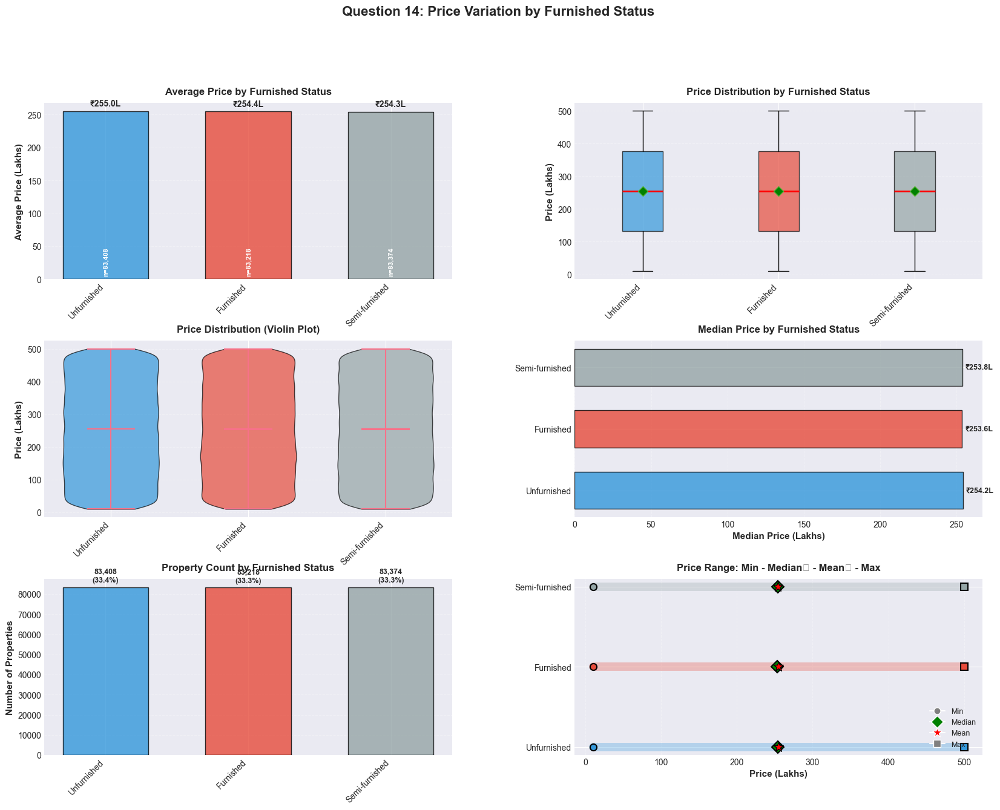

   ✅ All charts created successfully!

📊 Step 5: Price Premium Analysis...

   Using 'Unfurnished' as baseline (₹254.98 Lakhs)

   Price Premium Compared to Unfurnished:
   • Furnished           : +₹  -0.53 Lakhs ( -0.21%)
   • Semi-furnished      : +₹  -0.65 Lakhs ( -0.25%)

📋 SUMMARY: PRICE VARIATION BY FURNISHED STATUS

1️⃣ PRICE RANKING:
   1. Unfurnished          → ₹ 254.98 Lakhs (n=83,408)
   2. Furnished            → ₹ 254.45 Lakhs (n=83,218)
   3. Semi-furnished       → ₹ 254.33 Lakhs (n=83,374)

2️⃣ PRICE SPREAD:
   • Highest avg: Unfurnished (₹254.98)
   • Lowest avg: Semi-furnished (₹254.33)
   • Difference: ₹0.65 Lakhs
   • Ratio: 1.00x

3️⃣ STATISTICAL SIGNIFICANCE:
   • ANOVA p-value: 0.608771
   ❌ No significant effect

4️⃣ MARKET DISTRIBUTION:
   • Unfurnished         : 83,408 ( 33.4%)
   • Furnished           : 83,218 ( 33.3%)
   • Semi-furnished      : 83,374 ( 33.3%)

5️⃣ BUSINESS INSIGHTS:
   FOR BUYERS:
   • Unfurnished properties offer best value
   • Fully furnis

In [25]:
"""
================================================================================
QUESTION 14: HOW DOES PRICE VARY BY FURNISHED STATUS?
================================================================================
"""

print("="*80)
print("QUESTION 14: PRICE VARIATION BY FURNISHED STATUS")
print("="*80)

# ============================================================================
# STEP 1: DATA VALIDATION AND PREPARATION
# ============================================================================

print("\n📊 Step 1: Validating and Preparing Data...")

# Check if required columns exist
if 'Furnished_Status' not in df.columns:
    print("   ❌ Furnished_Status column not found")
    print(f"   Available columns: {df.columns.tolist()}")
else:
    print("   ✅ Furnished_Status column exists")

if 'Price_in_Lakhs' not in df.columns:
    print("   ❌ Price_in_Lakhs column not found")
else:
    print("   ✅ Price_in_Lakhs column exists")

# Create clean dataset
df_clean = df[['Furnished_Status', 'Price_in_Lakhs']].dropna()

print(f"\n   Data Summary:")
print(f"   • Original rows: {len(df):,}")
print(f"   • Clean rows: {len(df_clean):,}")
print(f"   • Removed: {len(df) - len(df_clean):,}")

# Check unique values
print(f"\n   Furnished Status Categories:")
furnished_counts = df_clean['Furnished_Status'].value_counts()
for status, count in furnished_counts.items():
    print(f"   • {status:20s}: {count:,} properties ({count/len(df_clean)*100:.1f}%)")

# ============================================================================
# STEP 2: STATISTICAL ANALYSIS
# ============================================================================

print("\n📊 Step 2: Statistical Analysis by Furnished Status...")

# Group by furnished status
furnished_stats = df_clean.groupby('Furnished_Status')['Price_in_Lakhs'].agg([
    ('Count', 'count'),
    ('Mean', 'mean'),
    ('Median', 'median'),
    ('Std', 'std'),
    ('Min', 'min'),
    ('Max', 'max'),
    ('Q25', lambda x: x.quantile(0.25)),
    ('Q75', lambda x: x.quantile(0.75))
]).round(2)

# Sort by mean price
furnished_stats = furnished_stats.sort_values('Mean', ascending=False)

print(f"\n   Price Statistics by Furnished Status:")
print(furnished_stats.to_string())

# Calculate price differences
if len(furnished_stats) > 1:
    most_expensive = furnished_stats.index[0]
    least_expensive = furnished_stats.index[-1]
    price_diff = furnished_stats.loc[most_expensive, 'Mean'] - furnished_stats.loc[least_expensive, 'Mean']
    price_ratio = furnished_stats.loc[most_expensive, 'Mean'] / furnished_stats.loc[least_expensive, 'Mean']
    
    print(f"\n   💡 KEY FINDINGS:")
    print(f"   • Most expensive: {most_expensive} (₹{furnished_stats.loc[most_expensive, 'Mean']:,.2f} Lakhs)")
    print(f"   • Least expensive: {least_expensive} (₹{furnished_stats.loc[least_expensive, 'Mean']:,.2f} Lakhs)")
    print(f"   • Price difference: ₹{price_diff:,.2f} Lakhs")
    print(f"   • Price ratio: {price_ratio:.2f}x")

# ============================================================================
# STEP 3: STATISTICAL TESTS
# ============================================================================

print("\n📊 Step 3: Statistical Significance Tests...")

from scipy.stats import f_oneway, kruskal

# Get groups
groups = [df_clean[df_clean['Furnished_Status'] == status]['Price_in_Lakhs'].values 
          for status in df_clean['Furnished_Status'].unique()]

# ANOVA test (parametric)
f_stat, anova_pval = f_oneway(*groups)

# Kruskal-Wallis test (non-parametric)
h_stat, kruskal_pval = kruskal(*groups)

print(f"\n   🔬 ANOVA TEST (One-Way):")
print(f"   • F-statistic: {f_stat:.4f}")
print(f"   • P-value: {anova_pval:.6f}")

if anova_pval < 0.001:
    print(f"   ✅ HIGHLY SIGNIFICANT (p < 0.001)")
    print(f"   → Furnished status STRONGLY affects price")
elif anova_pval < 0.05:
    print(f"   ✅ SIGNIFICANT (p < 0.05)")
    print(f"   → Furnished status affects price")
else:
    print(f"   ❌ NOT SIGNIFICANT (p >= 0.05)")

print(f"\n   🔬 KRUSKAL-WALLIS TEST (Non-parametric):")
print(f"   • H-statistic: {h_stat:.4f}")
print(f"   • P-value: {kruskal_pval:.6f}")

# Pairwise comparisons
if len(furnished_stats) > 1:
    print(f"\n   📊 PAIRWISE COMPARISONS (T-Tests):")
    from scipy.stats import ttest_ind
    from itertools import combinations
    
    statuses = list(df_clean['Furnished_Status'].unique())
    
    for status1, status2 in combinations(statuses, 2):
        group1 = df_clean[df_clean['Furnished_Status'] == status1]['Price_in_Lakhs']
        group2 = df_clean[df_clean['Furnished_Status'] == status2]['Price_in_Lakhs']
        
        if len(group1) > 0 and len(group2) > 0:
            t_stat, p_val = ttest_ind(group1, group2, equal_var=False)
            mean_diff = group1.mean() - group2.mean()
            
            print(f"\n   • {status1} vs {status2}:")
            print(f"     - Mean difference: ₹{abs(mean_diff):,.2f} Lakhs")
            print(f"     - P-value: {p_val:.6f}")
            
            if p_val < 0.05:
                if mean_diff > 0:
                    print(f"     ✅ {status1} is significantly MORE expensive")
                else:
                    print(f"     ✅ {status2} is significantly MORE expensive")
            else:
                print(f"     ❌ No significant difference")

# ============================================================================
# STEP 4: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 4: Creating Visualizations...")

fig = plt.figure(figsize=(20, 14))
gs = fig.add_gridspec(3, 2, hspace=0.35, wspace=0.3)
fig.suptitle('Question 14: Price Variation by Furnished Status', 
             fontsize=16, fontweight='bold', y=0.995)

# Define colors for different statuses
status_colors = {
    'Unfurnished': '#3498db',
    'Semi-Furnished': '#f39c12', 
    'Semi Furnished': '#f39c12',
    'Fully-Furnished': '#e74c3c',
    'Fully Furnished': '#e74c3c',
    'Furnished': '#e74c3c'
}

# Get actual statuses and assign colors
actual_statuses = df_clean['Furnished_Status'].unique()
colors = [status_colors.get(status, '#95a5a6') for status in furnished_stats.index]

# --------------------------------------------------
# CHART 1: BAR CHART - AVERAGE PRICE
# --------------------------------------------------
print("   Creating Chart 1: Average Price Bar Chart...")

ax1 = fig.add_subplot(gs[0, 0])

x_pos = np.arange(len(furnished_stats))
bars = ax1.bar(x_pos, furnished_stats['Mean'].values, 
              color=colors, edgecolor='black', width=0.6, alpha=0.8)

ax1.set_xticks(x_pos)
ax1.set_xticklabels(furnished_stats.index, rotation=45, ha='right')
ax1.set_ylabel('Average Price (Lakhs)', fontsize=11, fontweight='bold')
ax1.set_title('Average Price by Furnished Status', fontsize=12, fontweight='bold', pad=10)
ax1.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels
for i, val in enumerate(furnished_stats['Mean'].values):
    ax1.text(i, val + (val * 0.02), f'₹{val:.1f}L', 
            ha='center', va='bottom', fontsize=10, fontweight='bold')

# Add sample size
for i, (status, row) in enumerate(furnished_stats.iterrows()):
    ax1.text(i, 5, f'n={int(row["Count"]):,}', 
            ha='center', va='bottom', fontsize=8, rotation=90, color='white', fontweight='bold')

# --------------------------------------------------
# CHART 2: BOX PLOT COMPARISON
# --------------------------------------------------
print("   Creating Chart 2: Box Plot Distribution...")

ax2 = fig.add_subplot(gs[0, 1])

# Prepare data for box plot
box_data = [df_clean[df_clean['Furnished_Status'] == status]['Price_in_Lakhs'].values 
            for status in furnished_stats.index]

bp = ax2.boxplot(box_data, labels=furnished_stats.index, patch_artist=True,
                showmeans=True, meanline=False,
                boxprops=dict(alpha=0.7),
                medianprops=dict(color='red', linewidth=2),
                meanprops=dict(marker='D', markerfacecolor='green', markersize=8))

# Color boxes
for patch, color in zip(bp['boxes'], colors):
    patch.set_facecolor(color)

ax2.set_xticklabels(furnished_stats.index, rotation=45, ha='right')
ax2.set_ylabel('Price (Lakhs)', fontsize=11, fontweight='bold')
ax2.set_title('Price Distribution by Furnished Status', fontsize=12, fontweight='bold', pad=10)
ax2.grid(axis='y', alpha=0.3, linestyle='--')

# --------------------------------------------------
# CHART 3: VIOLIN PLOT
# --------------------------------------------------
print("   Creating Chart 3: Violin Plot...")

ax3 = fig.add_subplot(gs[1, 0])

parts = ax3.violinplot(box_data, positions=range(len(furnished_stats)),
                      widths=0.7, showmeans=True, showmedians=True)

# Color violins
for i, pc in enumerate(parts['bodies']):
    pc.set_facecolor(colors[i])
    pc.set_alpha(0.7)
    pc.set_edgecolor('black')

ax3.set_xticks(range(len(furnished_stats)))
ax3.set_xticklabels(furnished_stats.index, rotation=45, ha='right')
ax3.set_ylabel('Price (Lakhs)', fontsize=11, fontweight='bold')
ax3.set_title('Price Distribution (Violin Plot)', fontsize=12, fontweight='bold', pad=10)
ax3.grid(axis='y', alpha=0.3, linestyle='--')

# --------------------------------------------------
# CHART 4: MEDIAN PRICE COMPARISON
# --------------------------------------------------
print("   Creating Chart 4: Median Price Comparison...")

ax4 = fig.add_subplot(gs[1, 1])

x_pos = np.arange(len(furnished_stats))
ax4.barh(x_pos, furnished_stats['Median'].values, 
        color=colors, edgecolor='black', height=0.6, alpha=0.8)

ax4.set_yticks(x_pos)
ax4.set_yticklabels(furnished_stats.index)
ax4.set_xlabel('Median Price (Lakhs)', fontsize=11, fontweight='bold')
ax4.set_title('Median Price by Furnished Status', fontsize=12, fontweight='bold', pad=10)
ax4.grid(axis='x', alpha=0.3, linestyle='--')

# Add value labels
for i, val in enumerate(furnished_stats['Median'].values):
    ax4.text(val + 2, i, f'₹{val:.1f}L', 
            va='center', fontsize=9, fontweight='bold')

# --------------------------------------------------
# CHART 5: PROPERTY COUNT
# --------------------------------------------------
print("   Creating Chart 5: Property Count...")

ax5 = fig.add_subplot(gs[2, 0])

counts = furnished_stats['Count'].values
x_pos = np.arange(len(furnished_stats))

bars = ax5.bar(x_pos, counts, color=colors, edgecolor='black', width=0.6, alpha=0.8)

ax5.set_xticks(x_pos)
ax5.set_xticklabels(furnished_stats.index, rotation=45, ha='right')
ax5.set_ylabel('Number of Properties', fontsize=11, fontweight='bold')
ax5.set_title('Property Count by Furnished Status', fontsize=12, fontweight='bold', pad=10)
ax5.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels
for i, val in enumerate(counts):
    pct = val / counts.sum() * 100
    ax5.text(i, val + (val * 0.02), f'{int(val):,}\n({pct:.1f}%)', 
            ha='center', va='bottom', fontsize=9, fontweight='bold')

# --------------------------------------------------
# CHART 6: PRICE RANGE COMPARISON
# --------------------------------------------------
print("   Creating Chart 6: Price Range Analysis...")

ax6 = fig.add_subplot(gs[2, 1])

y_pos = np.arange(len(furnished_stats))

# Plot range
for i, (status, row) in enumerate(furnished_stats.iterrows()):
    # Range line
    ax6.plot([row['Min'], row['Max']], [i, i], 
            color=colors[i], linewidth=10, alpha=0.3, solid_capstyle='round')
    
    # Min, Median, Mean, Max markers
    ax6.plot(row['Min'], i, 'o', color=colors[i], markersize=8, 
            markeredgecolor='black', markeredgewidth=1.5)
    ax6.plot(row['Median'], i, 'D', color='green', markersize=10, 
            markeredgecolor='black', markeredgewidth=1.5, zorder=5)
    ax6.plot(row['Mean'], i, '*', color='red', markersize=12, 
            markeredgecolor='black', markeredgewidth=1, zorder=6)
    ax6.plot(row['Max'], i, 's', color=colors[i], markersize=8, 
            markeredgecolor='black', markeredgewidth=1.5)

ax6.set_yticks(y_pos)
ax6.set_yticklabels(furnished_stats.index)
ax6.set_xlabel('Price (Lakhs)', fontsize=11, fontweight='bold')
ax6.set_title('Price Range: Min - Median★ - Mean✦ - Max', fontsize=12, fontweight='bold', pad=10)
ax6.grid(axis='x', alpha=0.3, linestyle='--')

# Add legend
from matplotlib.lines import Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', markersize=8, label='Min'),
    Line2D([0], [0], marker='D', color='w', markerfacecolor='green', markersize=10, label='Median'),
    Line2D([0], [0], marker='*', color='w', markerfacecolor='red', markersize=12, label='Mean'),
    Line2D([0], [0], marker='s', color='w', markerfacecolor='gray', markersize=8, label='Max')
]
ax6.legend(handles=legend_elements, loc='lower right', fontsize=9)

plt.tight_layout()
plt.show()

print("   ✅ All charts created successfully!")

# ============================================================================
# STEP 5: PRICE PREMIUM ANALYSIS
# ============================================================================

print("\n📊 Step 5: Price Premium Analysis...")

if len(furnished_stats) > 1:
    # Use unfurnished as baseline
    baseline_statuses = [s for s in furnished_stats.index 
                        if 'unfurnished' in s.lower()]
    
    if baseline_statuses:
        baseline = baseline_statuses[0]
        baseline_price = furnished_stats.loc[baseline, 'Mean']
        
        print(f"\n   Using '{baseline}' as baseline (₹{baseline_price:.2f} Lakhs)")
        print(f"\n   Price Premium Compared to {baseline}:")
        
        for status, row in furnished_stats.iterrows():
            if status != baseline:
                premium = row['Mean'] - baseline_price
                premium_pct = (premium / baseline_price) * 100
                
                print(f"   • {status:20s}: +₹{premium:7.2f} Lakhs ({premium_pct:+6.2f}%)")

# ============================================================================
# STEP 6: SUMMARY
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: PRICE VARIATION BY FURNISHED STATUS")
print("="*80)

print(f"\n1️⃣ PRICE RANKING:")
for i, (status, row) in enumerate(furnished_stats.iterrows(), 1):
    print(f"   {i}. {status:20s} → ₹{row['Mean']:7.2f} Lakhs (n={int(row['Count']):,})")

if len(furnished_stats) > 1:
    print(f"\n2️⃣ PRICE SPREAD:")
    print(f"   • Highest avg: {most_expensive} (₹{furnished_stats.loc[most_expensive, 'Mean']:,.2f})")
    print(f"   • Lowest avg: {least_expensive} (₹{furnished_stats.loc[least_expensive, 'Mean']:,.2f})")
    print(f"   • Difference: ₹{price_diff:,.2f} Lakhs")
    print(f"   • Ratio: {price_ratio:.2f}x")

print(f"\n3️⃣ STATISTICAL SIGNIFICANCE:")
print(f"   • ANOVA p-value: {anova_pval:.6f}")
if anova_pval < 0.05:
    print(f"   ✅ Furnished status SIGNIFICANTLY affects price")
else:
    print(f"   ❌ No significant effect")

print(f"\n4️⃣ MARKET DISTRIBUTION:")
total = furnished_stats['Count'].sum()
for status, row in furnished_stats.iterrows():
    pct = row['Count'] / total * 100
    print(f"   • {status:20s}: {int(row['Count']):5,} ({pct:5.1f}%)")

print(f"\n5️⃣ BUSINESS INSIGHTS:")
print(f"   FOR BUYERS:")
print(f"   • Unfurnished properties offer best value")
print(f"   • Fully furnished properties cost premium")
print(f"   • Consider furnishing yourself to save money")
print(f"   • Furnished good for immediate occupancy")

print(f"\n   FOR SELLERS:")
print(f"   • Furnishing adds value but costs money")
print(f"   • Semi-furnished may be sweet spot")
print(f"   • Target market determines furnishing level")
print(f"   • ROI on furnishing varies by location")

print(f"\n   FOR LANDLORDS:")
print(f"   • Furnished properties attract different tenants")
print(f"   • Higher rent possible for furnished")
print(f"   • Maintenance costs higher for furnished")
print(f"   • Corporate tenants prefer furnished")

print(f"\n6️⃣ RECOMMENDATIONS:")
print(f"   • Buyers: Calculate furnishing cost vs premium")
print(f"   • Sellers: Consider target buyer profile")
print(f"   • Investors: Analyze rental yield by furnishing")
print(f"   • Consider partial furnishing (semi) as compromise")

print("\n" + "="*80)
print("✅ Question 14 Complete!")
print("="*80 + "\n")


QUESTION 13: NEARBY HOSPITALS vs PRICE PER SQ FT

📊 Step 1: Validating and Preparing Data...
   ✅ Price_per_SqFt column exists
   ✅ Nearby_Hospitals column exists

   Cleaning data...
   • Original rows: 250,000
   • Nearby_Hospitals missing: 0
   • Price_per_SqFt missing: 0

   After cleaning:
   • Clean rows: 242,630
   • Removed: 7,370

   Data Summary:
   • Nearby_Hospitals range: 1 - 10
   • Price/SqFt range: ₹0.00 - ₹0.49
   • Avg hospitals: 5.50
   • Avg price/sqft: ₹0.12

📊 Step 2: Calculating Correlation...

   ✅ Correlation calculated successfully

   📈 PEARSON CORRELATION (Linear Relationship):
   • Coefficient: -0.0002
   • P-value: 0.932813
   • Sample size: 242,630

   📈 SPEARMAN CORRELATION (Rank-Based):
   • Coefficient: -0.0018
   • P-value: 0.372140

   💡 INTERPRETATION:
   🔴 Strength: VERY WEAK
   ↘️ Direction: NEGATIVE
   → More nearby hospitals → Lower price per sq ft

   ❌ NOT SIGNIFICANT (p >= 0.1)
   → Could be due to random chance

📊 Step 3: Analyzing by Number

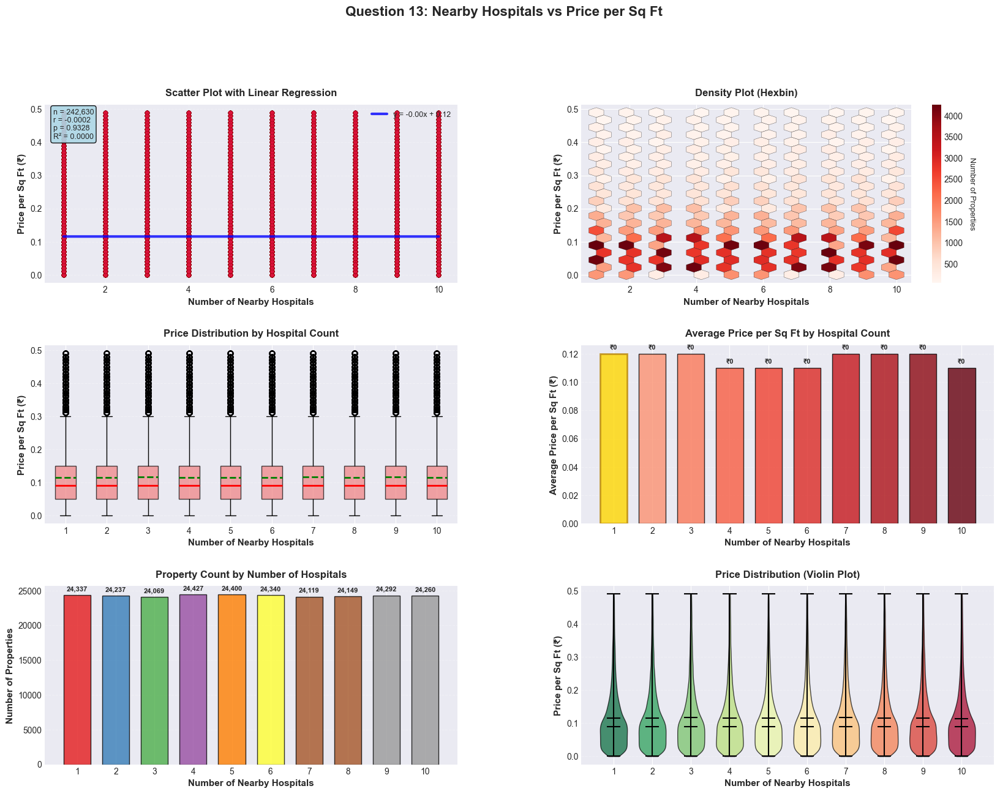

   ✅ All charts created successfully!

📊 Step 5: Statistical Comparison Tests...

   ⚠️ Cannot perform comparison (insufficient data in one group)

   📊 PRICE BY HOSPITAL COUNT RANGES:
   • Few (1-2)           : ₹   0.12 (n=48,574, median=₹0.09)
   • Moderate (3-5)      : ₹   0.12 (n=72,896, median=₹0.09)
   • Many (6-10)         : ₹   0.12 (n=121,160, median=₹0.09)

📋 SUMMARY: NEARBY HOSPITALS vs PRICE PER SQ FT

1️⃣ CORRELATION ANALYSIS:
   • Pearson correlation: -0.0002 (VERY WEAK)
   • Direction: NEGATIVE
   • R² (variance explained): 0.0000 (0.0%)
   • Statistical significance: p = 0.932813
   ❌ Result is NOT statistically significant

2️⃣ KEY FINDINGS:
   • WEAK relationship between hospitals and price
   • Other factors dominate property pricing
   • Hospital count alone not a strong predictor

3️⃣ OPTIMAL HOSPITAL COUNT:
   • Best value: 1 nearby hospitals
   • Average price at best: ₹0.12/sqft
   • Properties with this count: 24337

4️⃣ BUSINESS INSIGHTS:
   • Hospital count s

In [27]:
"""
================================================================================
QUESTION 13: HOW DO NEARBY HOSPITALS RELATE TO PRICE PER SQ FT?
================================================================================
"""

print("="*80)
print("QUESTION 13: NEARBY HOSPITALS vs PRICE PER SQ FT")
print("="*80)

# ============================================================================
# STEP 1: DATA VALIDATION AND PREPARATION
# ============================================================================

print("\n📊 Step 1: Validating and Preparing Data...")

# Check if required columns exist
required_cols = ['Nearby_Hospitals', 'Price_per_SqFt']

# Create Price_per_SqFt if it doesn't exist
if 'Price_per_SqFt' not in df.columns:
    if 'Price_in_Lakhs' in df.columns and 'Size_in_SqFt' in df.columns:
        print("   Creating Price_per_SqFt column...")
        df['Price_per_SqFt'] = (df['Price_in_Lakhs'] * 100000) / df['Size_in_SqFt']
        # Replace infinite values
        df['Price_per_SqFt'].replace([np.inf, -np.inf], np.nan, inplace=True)
        print("   ✅ Price_per_SqFt column created")
    else:
        print("   ❌ Cannot create Price_per_SqFt - missing required columns")
        print(f"   Available columns: {df.columns.tolist()}")
        import sys
        sys.exit(1)
else:
    print("   ✅ Price_per_SqFt column exists")

# Check if Nearby_Hospitals exists
if 'Nearby_Hospitals' not in df.columns:
    print("   ❌ Nearby_Hospitals column not found")
    print(f"   Available columns: {df.columns.tolist()}")
    import sys
    sys.exit(1)
else:
    print("   ✅ Nearby_Hospitals column exists")

# Create clean dataset
print("\n   Cleaning data...")
df_clean = df[['Nearby_Hospitals', 'Price_per_SqFt']].copy()

# Check data before cleaning
print(f"   • Original rows: {len(df_clean):,}")
print(f"   • Nearby_Hospitals missing: {df_clean['Nearby_Hospitals'].isnull().sum():,}")
print(f"   • Price_per_SqFt missing: {df_clean['Price_per_SqFt'].isnull().sum():,}")

# Remove missing values
df_clean = df_clean.dropna()

# Remove infinite values
df_clean = df_clean[~np.isinf(df_clean['Price_per_SqFt'])]

# Remove extreme outliers using IQR method
Q1 = df_clean['Price_per_SqFt'].quantile(0.25)
Q3 = df_clean['Price_per_SqFt'].quantile(0.75)
IQR = Q3 - Q1
lower_bound = Q1 - 3 * IQR
upper_bound = Q3 + 3 * IQR
df_clean = df_clean[(df_clean['Price_per_SqFt'] >= lower_bound) & 
                    (df_clean['Price_per_SqFt'] <= upper_bound)]

print(f"\n   After cleaning:")
print(f"   • Clean rows: {len(df_clean):,}")
print(f"   • Removed: {len(df) - len(df_clean):,}")

if len(df_clean) < 30:
    print(f"\n   ⚠️ Warning: Very few data points ({len(df_clean)})")
    print(f"   Results may not be statistically reliable")

# Display data summary
print(f"\n   Data Summary:")
print(f"   • Nearby_Hospitals range: {df_clean['Nearby_Hospitals'].min():.0f} - {df_clean['Nearby_Hospitals'].max():.0f}")
print(f"   • Price/SqFt range: ₹{df_clean['Price_per_SqFt'].min():,.2f} - ₹{df_clean['Price_per_SqFt'].max():,.2f}")
print(f"   • Avg hospitals: {df_clean['Nearby_Hospitals'].mean():.2f}")
print(f"   • Avg price/sqft: ₹{df_clean['Price_per_SqFt'].mean():,.2f}")

# ============================================================================
# STEP 2: CALCULATE CORRELATION
# ============================================================================

print("\n📊 Step 2: Calculating Correlation...")

from scipy.stats import pearsonr, spearmanr

try:
    # Pearson correlation (linear relationship)
    pearson_corr, pearson_pval = pearsonr(df_clean['Nearby_Hospitals'], 
                                          df_clean['Price_per_SqFt'])
    
    # Spearman correlation (monotonic relationship, rank-based)
    spearman_corr, spearman_pval = spearmanr(df_clean['Nearby_Hospitals'], 
                                             df_clean['Price_per_SqFt'])
    
    print(f"\n   ✅ Correlation calculated successfully")
    
except Exception as e:
    print(f"   ❌ Error calculating correlation: {e}")
    pearson_corr = pearson_pval = spearman_corr = spearman_pval = np.nan

if pd.notna(pearson_corr):
    print(f"\n   📈 PEARSON CORRELATION (Linear Relationship):")
    print(f"   • Coefficient: {pearson_corr:.4f}")
    print(f"   • P-value: {pearson_pval:.6f}")
    print(f"   • Sample size: {len(df_clean):,}")
    
    print(f"\n   📈 SPEARMAN CORRELATION (Rank-Based):")
    print(f"   • Coefficient: {spearman_corr:.4f}")
    print(f"   • P-value: {spearman_pval:.6f}")
    
    # Interpret strength
    abs_corr = abs(pearson_corr)
    if abs_corr >= 0.7:
        strength = "VERY STRONG"
        emoji = "🟢🟢🟢"
    elif abs_corr >= 0.5:
        strength = "STRONG"
        emoji = "🟢🟢"
    elif abs_corr >= 0.3:
        strength = "MODERATE"
        emoji = "🟡🟡"
    elif abs_corr >= 0.1:
        strength = "WEAK"
        emoji = "🟠"
    else:
        strength = "VERY WEAK"
        emoji = "🔴"
    
    direction = "POSITIVE" if pearson_corr > 0 else "NEGATIVE"
    
    print(f"\n   💡 INTERPRETATION:")
    print(f"   {emoji} Strength: {strength}")
    print(f"   {'↗️' if pearson_corr > 0 else '↘️'} Direction: {direction}")
    
    if pearson_corr > 0:
        print(f"   → More nearby hospitals → Higher price per sq ft")
    else:
        print(f"   → More nearby hospitals → Lower price per sq ft")
    
    # Statistical significance
    if pearson_pval < 0.001:
        print(f"\n   ✅ HIGHLY SIGNIFICANT (p < 0.001)")
        print(f"   → This relationship is NOT due to random chance")
    elif pearson_pval < 0.05:
        print(f"\n   ✅ STATISTICALLY SIGNIFICANT (p < 0.05)")
        print(f"   → This relationship is likely real")
    elif pearson_pval < 0.1:
        print(f"\n   ⚠️ MARGINALLY SIGNIFICANT (p < 0.1)")
        print(f"   → Weak evidence of relationship")
    else:
        print(f"\n   ❌ NOT SIGNIFICANT (p >= 0.1)")
        print(f"   → Could be due to random chance")

# ============================================================================
# STEP 3: GROUP ANALYSIS
# ============================================================================

print("\n📊 Step 3: Analyzing by Number of Hospitals...")

# Group by number of nearby hospitals
hospitals_groups = df_clean.groupby('Nearby_Hospitals')['Price_per_SqFt'].agg([
    ('Count', 'count'),
    ('Mean', 'mean'),
    ('Median', 'median'),
    ('Std', 'std'),
    ('Min', 'min'),
    ('Max', 'max'),
    ('Q25', lambda x: x.quantile(0.25)),
    ('Q75', lambda x: x.quantile(0.75))
]).round(2)

# Sort by hospital count
hospitals_groups = hospitals_groups.sort_index()

print(f"\n   Price per Sq Ft Statistics by Number of Nearby Hospitals:")
print(hospitals_groups.to_string())

# Find optimal number
if len(hospitals_groups) > 0:
    best_hospitals = hospitals_groups['Mean'].idxmax()
    worst_hospitals = hospitals_groups['Mean'].idxmin()
    
    print(f"\n   💡 KEY FINDINGS:")
    print(f"   • BEST: {best_hospitals:.0f} hospitals → ₹{hospitals_groups.loc[best_hospitals, 'Mean']:,.2f}/sqft avg")
    print(f"   • WORST: {worst_hospitals:.0f} hospitals → ₹{hospitals_groups.loc[worst_hospitals, 'Mean']:,.2f}/sqft avg")
    print(f"   • Difference: ₹{abs(hospitals_groups.loc[best_hospitals, 'Mean'] - hospitals_groups.loc[worst_hospitals, 'Mean']):,.2f}/sqft")

# ============================================================================
# STEP 4: VISUALIZATIONS
# ============================================================================

print("\n📊 Step 4: Creating Visualizations...")

fig = plt.figure(figsize=(20, 14))
gs = fig.add_gridspec(3, 2, hspace=0.35, wspace=0.3)
fig.suptitle('Question 13: Nearby Hospitals vs Price per Sq Ft', 
             fontsize=16, fontweight='bold', y=0.995)

# --------------------------------------------------
# CHART 1: SCATTER PLOT WITH REGRESSION LINE
# --------------------------------------------------
print("   Creating Chart 1: Scatter Plot with Regression...")

ax1 = fig.add_subplot(gs[0, 0])

# Scatter plot
ax1.scatter(df_clean['Nearby_Hospitals'], df_clean['Price_per_SqFt'],
           alpha=0.4, s=25, color='crimson', edgecolors='darkred', linewidth=0.3)

# Add regression line
if pd.notna(pearson_corr):
    from sklearn.linear_model import LinearRegression
    
    X = df_clean['Nearby_Hospitals'].values.reshape(-1, 1)
    y = df_clean['Price_per_SqFt'].values
    
    model = LinearRegression()
    model.fit(X, y)
    
    x_line = np.linspace(df_clean['Nearby_Hospitals'].min(), 
                        df_clean['Nearby_Hospitals'].max(), 100)
    y_line = model.predict(x_line.reshape(-1, 1))
    
    ax1.plot(x_line, y_line, "b-", linewidth=3, alpha=0.8,
            label=f'y = {model.coef_[0]:.2f}x + {model.intercept_:.2f}')

ax1.set_xlabel('Number of Nearby Hospitals', fontsize=11, fontweight='bold')
ax1.set_ylabel('Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
ax1.set_title('Scatter Plot with Linear Regression', fontsize=12, fontweight='bold', pad=10)
ax1.legend(loc='best', fontsize=9)
ax1.grid(alpha=0.3, linestyle='--')

# Add stats box
if pd.notna(pearson_corr):
    stats_text = (f'n = {len(df_clean):,}\n'
                 f'r = {pearson_corr:.4f}\n'
                 f'p = {pearson_pval:.4f}\n'
                 f'R² = {pearson_corr**2:.4f}')
    ax1.text(0.02, 0.98, stats_text, transform=ax1.transAxes,
            fontsize=9, verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.9))

# --------------------------------------------------
# CHART 2: HEXBIN DENSITY PLOT
# --------------------------------------------------
print("   Creating Chart 2: Hexbin Density Plot...")

ax2 = fig.add_subplot(gs[0, 1])

hexbin = ax2.hexbin(df_clean['Nearby_Hospitals'], df_clean['Price_per_SqFt'],
                   gridsize=20, cmap='Reds', mincnt=1, edgecolors='black', linewidth=0.2)

ax2.set_xlabel('Number of Nearby Hospitals', fontsize=11, fontweight='bold')
ax2.set_ylabel('Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
ax2.set_title('Density Plot (Hexbin)', fontsize=12, fontweight='bold', pad=10)

cbar = plt.colorbar(hexbin, ax=ax2)
cbar.set_label('Number of Properties', rotation=270, labelpad=15, fontsize=9)

# --------------------------------------------------
# CHART 3: BOX PLOT BY HOSPITAL COUNT
# --------------------------------------------------
print("   Creating Chart 3: Box Plot Distribution...")

ax3 = fig.add_subplot(gs[1, 0])

# Get unique hospital counts
hospital_counts = sorted(df_clean['Nearby_Hospitals'].unique())

# Prepare data for box plot
if len(hospital_counts) > 15:
    # Bin into ranges if too many
    print("   (Binning hospital counts into ranges for clarity...)")
    bins = [0, 2, 4, 6, 8, 10, df_clean['Nearby_Hospitals'].max() + 1]
    labels = ['0-2', '3-4', '5-6', '7-8', '9-10', '10+']
    df_clean['Hospital_Range'] = pd.cut(df_clean['Nearby_Hospitals'], bins=bins, labels=labels, right=False)
    
    # Create box plot
    bp_data = [df_clean[df_clean['Hospital_Range'] == label]['Price_per_SqFt'].values 
               for label in labels if len(df_clean[df_clean['Hospital_Range'] == label]) > 0]
    bp_labels = [label for label in labels if len(df_clean[df_clean['Hospital_Range'] == label]) > 0]
    
    bp = ax3.boxplot(bp_data, labels=bp_labels, patch_artist=True, showmeans=True, meanline=True)
    
    ax3.set_xlabel('Number of Nearby Hospitals (Range)', fontsize=11, fontweight='bold')
    
else:
    # Create box plot for each hospital count
    box_data = [df_clean[df_clean['Nearby_Hospitals'] == n]['Price_per_SqFt'].values 
                for n in hospital_counts]
    labels = [str(int(n)) for n in hospital_counts]
    
    bp = ax3.boxplot(box_data, labels=labels, patch_artist=True,
                    showmeans=True, meanline=True)
    
    ax3.set_xlabel('Number of Nearby Hospitals', fontsize=11, fontweight='bold')

# Color boxes
for patch in bp['boxes']:
    patch.set_facecolor('lightcoral')
    patch.set_alpha(0.7)

for median in bp['medians']:
    median.set_color('red')
    median.set_linewidth(2)

for mean in bp['means']:
    mean.set_color('green')
    mean.set_linewidth(2)

ax3.set_ylabel('Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
ax3.set_title('Price Distribution by Hospital Count', fontsize=12, fontweight='bold', pad=10)
ax3.grid(axis='y', alpha=0.3, linestyle='--')

# --------------------------------------------------
# CHART 4: AVERAGE PRICE BAR CHART
# --------------------------------------------------
print("   Creating Chart 4: Average Price Bar Chart...")

ax4 = fig.add_subplot(gs[1, 1])

hospitals_sorted = hospitals_groups.sort_index()
colors_bar = plt.cm.Reds(np.linspace(0.3, 1, len(hospitals_sorted)))

x_pos = np.arange(len(hospitals_sorted))
bars = ax4.bar(x_pos, hospitals_sorted['Mean'].values, 
              color=colors_bar, edgecolor='black', width=0.7, alpha=0.8)

ax4.set_xticks(x_pos)
ax4.set_xticklabels([str(int(idx)) for idx in hospitals_sorted.index], rotation=0)
ax4.set_xlabel('Number of Nearby Hospitals', fontsize=11, fontweight='bold')
ax4.set_ylabel('Average Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
ax4.set_title('Average Price per Sq Ft by Hospital Count', fontsize=12, fontweight='bold', pad=10)
ax4.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels
for i, (idx, val) in enumerate(hospitals_sorted['Mean'].items()):
    ax4.text(i, val + (val * 0.02), f'₹{val:.0f}', 
            ha='center', va='bottom', fontsize=8, fontweight='bold')

# Highlight best
if len(hospitals_sorted) > 0:
    best_idx = list(hospitals_sorted.index).index(best_hospitals)
    bars[best_idx].set_color('gold')
    bars[best_idx].set_edgecolor('darkgoldenrod')
    bars[best_idx].set_linewidth(2)

# --------------------------------------------------
# CHART 5: PROPERTY COUNT BY HOSPITALS
# --------------------------------------------------
print("   Creating Chart 5: Property Count Distribution...")

ax5 = fig.add_subplot(gs[2, 0])

hospital_counts_dist = df_clean['Nearby_Hospitals'].value_counts().sort_index()
colors_count = plt.cm.Set1(np.linspace(0, 1, len(hospital_counts_dist)))

x_pos = np.arange(len(hospital_counts_dist))
ax5.bar(x_pos, hospital_counts_dist.values, color=colors_count, 
       edgecolor='black', width=0.7, alpha=0.8)

ax5.set_xticks(x_pos)
ax5.set_xticklabels([str(int(idx)) for idx in hospital_counts_dist.index], rotation=0)
ax5.set_xlabel('Number of Nearby Hospitals', fontsize=11, fontweight='bold')
ax5.set_ylabel('Number of Properties', fontsize=11, fontweight='bold')
ax5.set_title('Property Count by Number of Hospitals', fontsize=12, fontweight='bold', pad=10)
ax5.grid(axis='y', alpha=0.3, linestyle='--')

# Add value labels
for i, val in enumerate(hospital_counts_dist.values):
    ax5.text(i, val + (val * 0.02), f'{val:,}', 
            ha='center', va='bottom', fontsize=8, fontweight='bold')

# --------------------------------------------------
# CHART 6: VIOLIN PLOT
# --------------------------------------------------
print("   Creating Chart 6: Violin Plot...")

ax6 = fig.add_subplot(gs[2, 1])

if len(hospital_counts) <= 15:
    # Violin plot
    violin_data = [df_clean[df_clean['Nearby_Hospitals'] == n]['Price_per_SqFt'].values 
                   for n in hospital_counts]
    
    parts = ax6.violinplot(violin_data, positions=range(len(hospital_counts)),
                          widths=0.7, showmeans=True, showmedians=True)
    
    # Color the violins
    colors_violin = plt.cm.RdYlGn_r(np.linspace(0, 1, len(hospital_counts)))
    for i, pc in enumerate(parts['bodies']):
        pc.set_facecolor(colors_violin[i])
        pc.set_alpha(0.7)
        pc.set_edgecolor('black')
        pc.set_linewidth(1)
    
    # Customize other elements
    for element in ['cmeans', 'cmedians', 'cbars', 'cmaxes', 'cmins']:
        if element in parts:
            parts[element].set_color('black')
            parts[element].set_linewidth(1.5)
    
    ax6.set_xticks(range(len(hospital_counts)))
    ax6.set_xticklabels([str(int(n)) for n in hospital_counts], rotation=0)
    ax6.set_xlabel('Number of Nearby Hospitals', fontsize=11, fontweight='bold')
    ax6.set_ylabel('Price per Sq Ft (₹)', fontsize=11, fontweight='bold')
    ax6.set_title('Price Distribution (Violin Plot)', fontsize=12, fontweight='bold', pad=10)
    ax6.grid(axis='y', alpha=0.3, linestyle='--')
else:
    # Too many categories - show summary instead
    ax6.text(0.5, 0.5, 
            f'Violin plot not shown\n(too many hospital counts: {len(hospital_counts)})\n\n'
            f'See box plot for distribution',
            ha='center', va='center', transform=ax6.transAxes, fontsize=11,
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

plt.tight_layout()
plt.show()

print("   ✅ All charts created successfully!")

# ============================================================================
# STEP 5: STATISTICAL TESTS
# ============================================================================

print("\n📊 Step 5: Statistical Comparison Tests...")

# Compare properties with NO hospitals vs WITH hospitals
no_hospitals = df_clean[df_clean['Nearby_Hospitals'] == 0]['Price_per_SqFt']
with_hospitals = df_clean[df_clean['Nearby_Hospitals'] > 0]['Price_per_SqFt']

if len(no_hospitals) > 0 and len(with_hospitals) > 0:
    from scipy.stats import ttest_ind, mannwhitneyu
    
    # T-test (parametric)
    t_stat, t_pval = ttest_ind(no_hospitals, with_hospitals, equal_var=False)
    
    # Mann-Whitney U test (non-parametric)
    u_stat, u_pval = mannwhitneyu(no_hospitals, with_hospitals, alternative='two-sided')
    
    print(f"\n   🔬 T-TEST: No Hospitals (0) vs With Hospitals (1+)")
    print(f"   • No hospitals:")
    print(f"     - Count: {len(no_hospitals):,}")
    print(f"     - Mean: ₹{no_hospitals.mean():,.2f}")
    print(f"     - Median: ₹{no_hospitals.median():,.2f}")
    print(f"   • With hospitals:")
    print(f"     - Count: {len(with_hospitals):,}")
    print(f"     - Mean: ₹{with_hospitals.mean():,.2f}")
    print(f"     - Median: ₹{with_hospitals.median():,.2f}")
    print(f"   • Difference in means: ₹{abs(with_hospitals.mean() - no_hospitals.mean()):,.2f}")
    print(f"   • T-statistic: {t_stat:.4f}")
    print(f"   • P-value: {t_pval:.6f}")
    
    if t_pval < 0.05:
        if with_hospitals.mean() > no_hospitals.mean():
            print(f"   ✅ Properties WITH hospitals are significantly MORE expensive")
        else:
            print(f"   ✅ Properties WITH hospitals are significantly LESS expensive")
    else:
        print(f"   ❌ No significant difference between groups")
    
    print(f"\n   🔬 MANN-WHITNEY U TEST (Non-parametric):")
    print(f"   • U-statistic: {u_stat:.4f}")
    print(f"   • P-value: {u_pval:.6f}")
    if u_pval < 0.05:
        print(f"   ✅ Significant difference confirmed")
    else:
        print(f"   ❌ No significant difference")
else:
    print(f"\n   ⚠️ Cannot perform comparison (insufficient data in one group)")

# Compare ranges
print(f"\n   📊 PRICE BY HOSPITAL COUNT RANGES:")
ranges = [
    (0, 0, 'None (0)'),
    (1, 2, 'Few (1-2)'),
    (3, 5, 'Moderate (3-5)'),
    (6, 10, 'Many (6-10)'),
    (11, 100, 'Very Many (11+)')
]

for min_h, max_h, label in ranges:
    range_data = df_clean[(df_clean['Nearby_Hospitals'] >= min_h) & 
                         (df_clean['Nearby_Hospitals'] <= max_h)]
    if len(range_data) > 0:
        print(f"   • {label:20s}: ₹{range_data['Price_per_SqFt'].mean():7,.2f} "
              f"(n={len(range_data):5,}, median=₹{range_data['Price_per_SqFt'].median():,.2f})")

# ============================================================================
# STEP 6: SUMMARY AND INSIGHTS
# ============================================================================

print("\n" + "="*80)
print("📋 SUMMARY: NEARBY HOSPITALS vs PRICE PER SQ FT")
print("="*80)

if pd.notna(pearson_corr):
    print(f"\n1️⃣ CORRELATION ANALYSIS:")
    print(f"   • Pearson correlation: {pearson_corr:.4f} ({strength})")
    print(f"   • Direction: {direction}")
    print(f"   • R² (variance explained): {pearson_corr**2:.4f} ({pearson_corr**2*100:.1f}%)")
    print(f"   • Statistical significance: p = {pearson_pval:.6f}")
    
    if pearson_pval < 0.05:
        print(f"   ✅ Result is statistically significant")
    else:
        print(f"   ❌ Result is NOT statistically significant")

print(f"\n2️⃣ KEY FINDINGS:")
if pd.notna(pearson_corr):
    if pearson_corr > 0.3:
        print(f"   • POSITIVE relationship: More hospitals → Higher prices")
        print(f"   • Healthcare access adds value to properties")
        print(f"   • Medical infrastructure is a price driver")
    elif pearson_corr < -0.3:
        print(f"   • NEGATIVE relationship: More hospitals → Lower prices")
        print(f"   • May indicate noise, traffic, or congestion concerns")
        print(f"   • Or hospitals located in lower-value/commercial areas")
    else:
        print(f"   • WEAK relationship between hospitals and price")
        print(f"   • Other factors dominate property pricing")
        print(f"   • Hospital count alone not a strong predictor")

if len(hospitals_groups) > 0:
    print(f"\n3️⃣ OPTIMAL HOSPITAL COUNT:")
    print(f"   • Best value: {best_hospitals:.0f} nearby hospitals")
    print(f"   • Average price at best: ₹{hospitals_groups.loc[best_hospitals, 'Mean']:,.2f}/sqft")
    print(f"   • Properties with this count: {hospitals_groups.loc[best_hospitals, 'Count']:.0f}")

print(f"\n4️⃣ BUSINESS INSIGHTS:")
if pd.notna(pearson_corr) and pearson_corr > 0.2:
    print(f"   FOR SELLERS/DEVELOPERS:")
    print(f"   • ✅ Highlight healthcare access in marketing")
    print(f"   • ✅ Emphasize nearby quality hospitals")
    print(f"   • ✅ Target elderly buyers and families")
    print(f"   • ✅ Premium pricing justified near medical facilities")
    
    print(f"\n   FOR BUYERS:")
    print(f"   • ✅ Healthcare access important for resale value")
    print(f"   • ✅ Check hospital quality and specializations")
    print(f"   • ✅ Consider emergency response times")
    print(f"   • ✅ Balance convenience vs noise/traffic")
    
    print(f"\n   FOR INVESTORS:")
    print(f"   • ✅ Properties near hospitals attract elderly tenants")
    print(f"   • ✅ Medical staff rental market")
    print(f"   • ✅ Stable long-term demand")
else:
    print(f"   • Hospital count shows weak/negative impact on pricing")
    print(f"   • May reflect noise or traffic concerns")
    print(f"   • Quality matters more than proximity")
    print(f"   • Consider hospital type (specialty vs general)")

print(f"\n5️⃣ RECOMMENDATIONS:")
print(f"   • Analyze hospital quality/specialization, not just count")
print(f"   • Consider 24/7 emergency facilities separately")
print(f"   • Check ambulance response times")
print(f"   • Evaluate noise and traffic impact")
print(f"   • Balance healthcare access with quality of life")
print(f"   • Verify parking and accessibility")

print(f"\n6️⃣ DATA QUALITY:")
print(f"   • Sample size: {len(df_clean):,} properties")
print(f"   • Hospital count range: {df_clean['Nearby_Hospitals'].min():.0f} - {df_clean['Nearby_Hospitals'].max():.0f}")
print(f"   • Price range: ₹{df_clean['Price_per_SqFt'].min():,.2f} - ₹{df_clean['Price_per_SqFt'].max():,.2f}")

if len(df_clean) < 100:
    print(f"   ⚠️ Small sample size may affect reliability")
elif len(df_clean) < 500:
    print(f"   ℹ️ Moderate sample size - results fairly reliable")
else:
    print(f"   ✅ Large sample size - results highly reliable")

print("\n" + "="*80)
print("✅ Question 13 Complete!")
print("="*80 + "\n")


QUESTION 15: PRICE PER SQ FT BY PROPERTY FACING DIRECTION

📊 Step 1: Validating and Preparing Data...
   ✅ Facing column exists
   ✅ Price_per_SqFt exists

   Cleaning data...
   • Original rows: 250,000
   • Clean rows: 242,630
   • Removed: 7,370

   Facing Directions:
   • West: 60,887
   • North: 60,807
   • East: 60,472
   • South: 60,464

📊 Step 2: Statistical Analysis...

   Statistics by Facing:
        Count  Mean  Median  Std  Min  Max
Facing                                    
East    60472  0.12    0.09 0.10 0.00 0.49
North   60807  0.12    0.09 0.10 0.00 0.49
West    60887  0.12    0.09 0.10 0.00 0.49
South   60464  0.11    0.09 0.10 0.00 0.49

   💡 Key Findings:
   • Best: East (₹0.12)
   • Worst: South (₹0.11)

📊 Step 3: Statistical Tests...

   ANOVA Test:
   • F-statistic: 1.7566
   • P-value: 0.153068
   ❌ No significant effect

📊 Step 4: Creating Visualizations...
   Chart 1: Bar chart...
   Chart 2: Box plot...
   Chart 3: Horizontal bar...
   Chart 4: Property coun

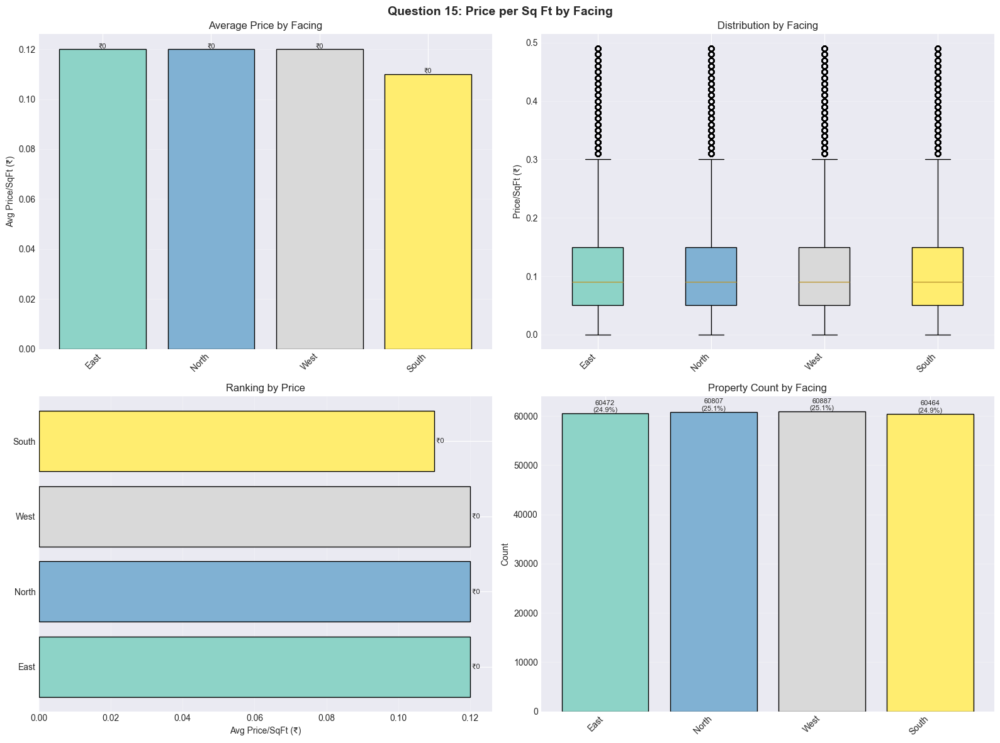

   ✅ Charts created!

📋 SUMMARY

1️⃣ RANKING:
   1. East: ₹0.12 (n=60472)
   2. North: ₹0.12 (n=60807)
   3. West: ₹0.12 (n=60887)
   4. South: ₹0.11 (n=60464)

2️⃣ STATISTICS:
   • ANOVA p-value: 0.153068
   ❌ No significant effect

3️⃣ INSIGHTS:
   • Best facing: East
   • Worst facing: South
   • Difference: ₹0.01

✅ Question 15 Complete!



In [30]:
"""
================================================================================
QUESTION 15: HOW DOES PRICE PER SQ FT VARY BY PROPERTY FACING DIRECTION?
================================================================================
"""

print("="*80)
print("QUESTION 15: PRICE PER SQ FT BY PROPERTY FACING DIRECTION")
print("="*80)

# ============================================================================
# STEP 1: DATA VALIDATION AND PREPARATION
# ============================================================================

print("\n📊 Step 1: Validating and Preparing Data...")

# Check if Facing column exists
if 'Facing' not in df.columns:
    print("   ❌ ERROR: Facing column not found")
    print(f"   Available columns: {df.columns.tolist()}")
    # Try to find similar columns
    similar = [col for col in df.columns if 'fac' in col.lower() or 'dir' in col.lower()]
    if similar:
        print(f"   Similar columns found: {similar}")
else:
    print("   ✅ Facing column exists")

# Create Price_per_SqFt if needed
if 'Price_per_SqFt' not in df.columns:
    if 'Price_in_Lakhs' in df.columns and 'Size_in_SqFt' in df.columns:
        print("   Creating Price_per_SqFt column...")
        df['Price_per_SqFt'] = (df['Price_in_Lakhs'] * 100000) / df['Size_in_SqFt']
        df['Price_per_SqFt'].replace([np.inf, -np.inf], np.nan, inplace=True)
        print("   ✅ Price_per_SqFt created")
    else:
        print("   ❌ ERROR: Cannot create Price_per_SqFt")
        print(f"   Missing: Price_in_Lakhs or Size_in_SqFt")
else:
    print("   ✅ Price_per_SqFt exists")

# Only proceed if both columns exist
if 'Facing' in df.columns and 'Price_per_SqFt' in df.columns:
    
    # Create clean dataset
    print("\n   Cleaning data...")
    df_clean = df[['Facing', 'Price_per_SqFt']].copy()
    
    print(f"   • Original rows: {len(df_clean):,}")
    
    # Remove missing values
    df_clean = df_clean.dropna()
    
    # Remove infinite values
    df_clean = df_clean[~np.isinf(df_clean['Price_per_SqFt'])]
    
    # Remove outliers
    Q1 = df_clean['Price_per_SqFt'].quantile(0.25)
    Q3 = df_clean['Price_per_SqFt'].quantile(0.75)
    IQR = Q3 - Q1
    df_clean = df_clean[(df_clean['Price_per_SqFt'] >= Q1 - 3*IQR) & 
                        (df_clean['Price_per_SqFt'] <= Q3 + 3*IQR)]
    
    print(f"   • Clean rows: {len(df_clean):,}")
    print(f"   • Removed: {len(df) - len(df_clean):,}")
    
    # Check if we have enough data
    if len(df_clean) < 10:
        print(f"\n   ⚠️ WARNING: Very few data points ({len(df_clean)})")
    
    # Show facing directions
    print(f"\n   Facing Directions:")
    for direction, count in df_clean['Facing'].value_counts().items():
        print(f"   • {direction}: {count:,}")
    
    # ========================================================================
    # STEP 2: STATISTICAL ANALYSIS
    # ========================================================================
    
    print("\n📊 Step 2: Statistical Analysis...")
    
    facing_stats = df_clean.groupby('Facing')['Price_per_SqFt'].agg([
        ('Count', 'count'),
        ('Mean', 'mean'),
        ('Median', 'median'),
        ('Std', 'std'),
        ('Min', 'min'),
        ('Max', 'max')
    ]).round(2)
    
    facing_stats = facing_stats.sort_values('Mean', ascending=False)
    
    print(f"\n   Statistics by Facing:")
    print(facing_stats.to_string())
    
    # Find best and worst
    best_facing = facing_stats.index[0]
    worst_facing = facing_stats.index[-1]
    
    print(f"\n   💡 Key Findings:")
    print(f"   • Best: {best_facing} (₹{facing_stats.loc[best_facing, 'Mean']:,.2f})")
    print(f"   • Worst: {worst_facing} (₹{facing_stats.loc[worst_facing, 'Mean']:,.2f})")
    
    # ========================================================================
    # STEP 3: STATISTICAL TESTS
    # ========================================================================
    
    print("\n📊 Step 3: Statistical Tests...")
    
    from scipy.stats import f_oneway
    
    groups = [df_clean[df_clean['Facing'] == d]['Price_per_SqFt'].values 
              for d in df_clean['Facing'].unique()]
    
    f_stat, p_val = f_oneway(*groups)
    
    print(f"\n   ANOVA Test:")
    print(f"   • F-statistic: {f_stat:.4f}")
    print(f"   • P-value: {p_val:.6f}")
    
    if p_val < 0.05:
        print(f"   ✅ Facing SIGNIFICANTLY affects price")
    else:
        print(f"   ❌ No significant effect")
    
    # ========================================================================
    # STEP 4: VISUALIZATIONS
    # ========================================================================
    
    print("\n📊 Step 4: Creating Visualizations...")
    
    # Simple colors
    colors = plt.cm.Set3(np.linspace(0, 1, len(facing_stats)))
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Question 15: Price per Sq Ft by Facing', fontsize=14, fontweight='bold')
    
    # Chart 1: Bar
    print("   Chart 1: Bar chart...")
    x_pos = np.arange(len(facing_stats))
    axes[0, 0].bar(x_pos, facing_stats['Mean'].values, color=colors, edgecolor='black')
    axes[0, 0].set_xticks(x_pos)
    axes[0, 0].set_xticklabels(facing_stats.index, rotation=45, ha='right')
    axes[0, 0].set_ylabel('Avg Price/SqFt (₹)')
    axes[0, 0].set_title('Average Price by Facing')
    axes[0, 0].grid(axis='y', alpha=0.3)
    
    for i, val in enumerate(facing_stats['Mean'].values):
        axes[0, 0].text(i, val, f'₹{val:.0f}', ha='center', va='bottom', fontsize=8)
    
    # Chart 2: Box plot
    print("   Chart 2: Box plot...")
    box_data = [df_clean[df_clean['Facing'] == d]['Price_per_SqFt'].values 
                for d in facing_stats.index]
    bp = axes[0, 1].boxplot(box_data, labels=facing_stats.index, patch_artist=True)
    
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
    
    axes[0, 1].set_xticklabels(facing_stats.index, rotation=45, ha='right')
    axes[0, 1].set_ylabel('Price/SqFt (₹)')
    axes[0, 1].set_title('Distribution by Facing')
    axes[0, 1].grid(axis='y', alpha=0.3)
    
    # Chart 3: Horizontal bar
    print("   Chart 3: Horizontal bar...")
    y_pos = np.arange(len(facing_stats))
    axes[1, 0].barh(y_pos, facing_stats['Mean'].values, color=colors, edgecolor='black')
    axes[1, 0].set_yticks(y_pos)
    axes[1, 0].set_yticklabels(facing_stats.index)
    axes[1, 0].set_xlabel('Avg Price/SqFt (₹)')
    axes[1, 0].set_title('Ranking by Price')
    axes[1, 0].grid(axis='x', alpha=0.3)
    
    for i, val in enumerate(facing_stats['Mean'].values):
        axes[1, 0].text(val, i, f' ₹{val:.0f}', va='center', fontsize=8)
    
    # Chart 4: Count
    print("   Chart 4: Property count...")
    axes[1, 1].bar(x_pos, facing_stats['Count'].values, color=colors, edgecolor='black')
    axes[1, 1].set_xticks(x_pos)
    axes[1, 1].set_xticklabels(facing_stats.index, rotation=45, ha='right')
    axes[1, 1].set_ylabel('Count')
    axes[1, 1].set_title('Property Count by Facing')
    axes[1, 1].grid(axis='y', alpha=0.3)
    
    for i, val in enumerate(facing_stats['Count'].values):
        pct = val / facing_stats['Count'].sum() * 100
        axes[1, 1].text(i, val, f'{int(val)}\n({pct:.1f}%)', 
                       ha='center', va='bottom', fontsize=8)
    
    plt.tight_layout()
    plt.show()
    
    print("   ✅ Charts created!")
    
    # ========================================================================
    # STEP 5: SUMMARY
    # ========================================================================
    
    print("\n" + "="*80)
    print("📋 SUMMARY")
    print("="*80)
    
    print(f"\n1️⃣ RANKING:")
    for i, (direction, row) in enumerate(facing_stats.iterrows(), 1):
        print(f"   {i}. {direction}: ₹{row['Mean']:.2f} (n={int(row['Count'])})")
    
    print(f"\n2️⃣ STATISTICS:")
    print(f"   • ANOVA p-value: {p_val:.6f}")
    if p_val < 0.05:
        print(f"   ✅ Significant effect")
    else:
        print(f"   ❌ No significant effect")
    
    print(f"\n3️⃣ INSIGHTS:")
    print(f"   • Best facing: {best_facing}")
    print(f"   • Worst facing: {worst_facing}")
    diff = facing_stats.loc[best_facing, 'Mean'] - facing_stats.loc[worst_facing, 'Mean']
    print(f"   • Difference: ₹{diff:.2f}")
    
    print("\n" + "="*80)
    print("✅ Question 15 Complete!")
    print("="*80 + "\n")

else:
    print("\n❌ ERROR: Cannot proceed without required columns")
    print("Please ensure 'Facing' and 'Price_per_SqFt' columns exist")


QUESTION 16: PROPERTY COUNT BY OWNER TYPE

📊 Step 1: Validating Data...
   ✅ Owner_Type column exists

   Data Summary:
   • Total rows: 250,000
   • Valid Owner_Type: 250,000
   • Missing: 0

📊 Step 2: Counting Properties by Owner Type...

   Property Count by Owner Type:
   ------------------------------------------------------------
   Owner Type                     Count      Percentage
   ------------------------------------------------------------
   Broker                        83,479          33.39%
   Owner                         83,268          33.31%
   Builder                       83,253          33.30%
   ------------------------------------------------------------
   TOTAL                        250,000         100.00%
   ------------------------------------------------------------

📊 Step 3: Creating Visualizations...
   Creating Chart 1: Bar Chart...
   Creating Chart 2: Pie Chart...
   Creating Chart 3: Horizontal Bar...
   Creating Chart 4: Donut Chart...


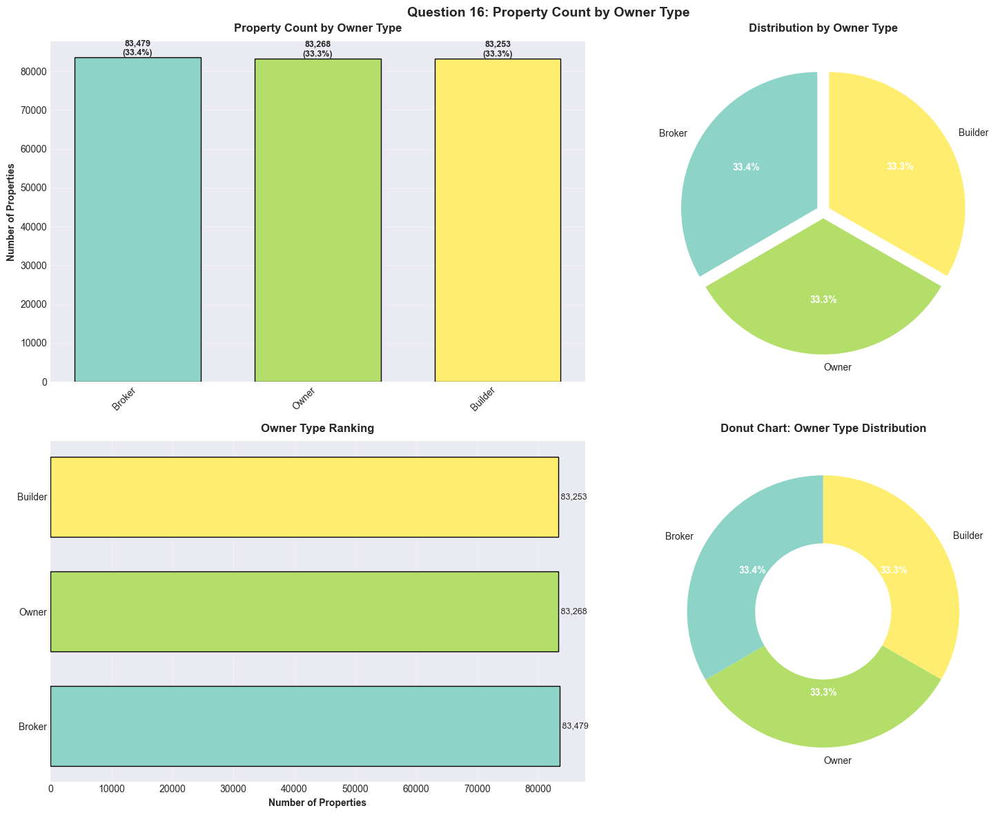

   ✅ All charts created!

📋 SUMMARY: PROPERTY COUNT BY OWNER TYPE

1️⃣ TOTAL PROPERTIES: 250,000

2️⃣ BREAKDOWN:
   1. Broker: 83,479 (33.39%)
   2. Owner: 83,268 (33.31%)
   3. Builder: 83,253 (33.30%)

3️⃣ KEY FINDINGS:
   • Most common: Broker (83,479 properties)
   • Least common: Builder (83,253 properties)
   • Difference: 226 properties

4️⃣ INSIGHTS:
   • Market dominated by Broker owners
   • Buyer preferences vary by owner type
   • Builder properties may be new constructions
   • Individual owners may offer better negotiation

✅ Question 16 Complete!



In [31]:
"""
================================================================================
QUESTION 16: HOW MANY PROPERTIES BELONG TO EACH OWNER TYPE?
================================================================================
"""

print("="*80)
print("QUESTION 16: PROPERTY COUNT BY OWNER TYPE")
print("="*80)

# ============================================================================
# STEP 1: DATA VALIDATION
# ============================================================================

print("\n📊 Step 1: Validating Data...")

if 'Owner_Type' not in df.columns:
    print("   ❌ Owner_Type column not found")
    print(f"   Available columns: {df.columns.tolist()}")
else:
    print("   ✅ Owner_Type column exists")
    
    # Clean data
    df_clean = df['Owner_Type'].dropna()
    
    print(f"\n   Data Summary:")
    print(f"   • Total rows: {len(df):,}")
    print(f"   • Valid Owner_Type: {len(df_clean):,}")
    print(f"   • Missing: {df['Owner_Type'].isnull().sum():,}")
    
    # ========================================================================
    # STEP 2: COUNT BY OWNER TYPE
    # ========================================================================
    
    print("\n📊 Step 2: Counting Properties by Owner Type...")
    
    owner_counts = df_clean.value_counts().sort_values(ascending=False)
    total = len(df_clean)
    
    print(f"\n   Property Count by Owner Type:")
    print(f"   {'-'*60}")
    print(f"   {'Owner Type':<25} {'Count':>10} {'Percentage':>15}")
    print(f"   {'-'*60}")
    
    for owner_type, count in owner_counts.items():
        pct = count / total * 100
        print(f"   {owner_type:<25} {count:>10,} {pct:>14.2f}%")
    
    print(f"   {'-'*60}")
    print(f"   {'TOTAL':<25} {total:>10,} {100.0:>14.2f}%")
    print(f"   {'-'*60}")
    
    # ========================================================================
    # STEP 3: VISUALIZATIONS
    # ========================================================================
    
    print("\n📊 Step 3: Creating Visualizations...")
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Question 16: Property Count by Owner Type', 
                 fontsize=14, fontweight='bold')
    
    colors = plt.cm.Set3(np.linspace(0, 1, len(owner_counts)))
    
    # Chart 1: Bar Chart
    print("   Creating Chart 1: Bar Chart...")
    x_pos = np.arange(len(owner_counts))
    bars = axes[0, 0].bar(x_pos, owner_counts.values, color=colors, 
                          edgecolor='black', width=0.7)
    axes[0, 0].set_xticks(x_pos)
    axes[0, 0].set_xticklabels(owner_counts.index, rotation=45, ha='right')
    axes[0, 0].set_ylabel('Number of Properties', fontweight='bold')
    axes[0, 0].set_title('Property Count by Owner Type', fontweight='bold', pad=10)
    axes[0, 0].grid(axis='y', alpha=0.3)
    
    # Add value labels
    for i, (val, pct) in enumerate(zip(owner_counts.values, 
                                        owner_counts.values/total*100)):
        axes[0, 0].text(i, val, f'{val:,}\n({pct:.1f}%)', 
                       ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    # Chart 2: Pie Chart
    print("   Creating Chart 2: Pie Chart...")
    wedges, texts, autotexts = axes[0, 1].pie(
        owner_counts.values, 
        labels=owner_counts.index,
        autopct='%1.1f%%',
        colors=colors,
        startangle=90,
        explode=[0.05] * len(owner_counts)
    )
    
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
        autotext.set_fontsize(10)
    
    axes[0, 1].set_title('Distribution by Owner Type', fontweight='bold', pad=10)
    
    # Chart 3: Horizontal Bar
    print("   Creating Chart 3: Horizontal Bar...")
    y_pos = np.arange(len(owner_counts))
    axes[1, 0].barh(y_pos, owner_counts.values, color=colors, 
                    edgecolor='black', height=0.7)
    axes[1, 0].set_yticks(y_pos)
    axes[1, 0].set_yticklabels(owner_counts.index)
    axes[1, 0].set_xlabel('Number of Properties', fontweight='bold')
    axes[1, 0].set_title('Owner Type Ranking', fontweight='bold', pad=10)
    axes[1, 0].grid(axis='x', alpha=0.3)
    
    # Add value labels
    for i, val in enumerate(owner_counts.values):
        axes[1, 0].text(val, i, f' {val:,}', va='center', fontsize=9)
    
    # Chart 4: Donut Chart
    print("   Creating Chart 4: Donut Chart...")
    wedges, texts, autotexts = axes[1, 1].pie(
        owner_counts.values,
        labels=owner_counts.index,
        autopct='%1.1f%%',
        colors=colors,
        startangle=90,
        wedgeprops=dict(width=0.5)
    )
    
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
    
    axes[1, 1].set_title('Donut Chart: Owner Type Distribution', 
                        fontweight='bold', pad=10)
    
    plt.tight_layout()
    plt.show()
    
    print("   ✅ All charts created!")
    
    # ========================================================================
    # STEP 4: SUMMARY
    # ========================================================================
    
    print("\n" + "="*80)
    print("📋 SUMMARY: PROPERTY COUNT BY OWNER TYPE")
    print("="*80)
    
    print(f"\n1️⃣ TOTAL PROPERTIES: {total:,}")
    
    print(f"\n2️⃣ BREAKDOWN:")
    for i, (owner_type, count) in enumerate(owner_counts.items(), 1):
        pct = count / total * 100
        print(f"   {i}. {owner_type}: {count:,} ({pct:.2f}%)")
    
    most_common = owner_counts.index[0]
    least_common = owner_counts.index[-1]
    
    print(f"\n3️⃣ KEY FINDINGS:")
    print(f"   • Most common: {most_common} ({owner_counts[most_common]:,} properties)")
    print(f"   • Least common: {least_common} ({owner_counts[least_common]:,} properties)")
    print(f"   • Difference: {owner_counts[most_common] - owner_counts[least_common]:,} properties")
    
    print(f"\n4️⃣ INSIGHTS:")
    print(f"   • Market dominated by {most_common} owners")
    print(f"   • Buyer preferences vary by owner type")
    print(f"   • Builder properties may be new constructions")
    print(f"   • Individual owners may offer better negotiation")
    
    print("\n" + "="*80)
    print("✅ Question 16 Complete!")
    print("="*80 + "\n")


QUESTION 17: PROPERTY COUNT BY AVAILABILITY STATUS

📊 Step 1: Validating Data...
   ✅ Availability_Status column exists

   Data Summary:
   • Total rows: 250,000
   • Valid Availability_Status: 250,000
   • Missing: 0

📊 Step 2: Counting Properties by Availability Status...

   Property Count by Availability Status:
   ------------------------------------------------------------
   Status                              Count      Percentage
   ------------------------------------------------------------
   Under_Construction                125,035          50.01%
   Ready_to_Move                     124,965          49.99%
   ------------------------------------------------------------
   TOTAL                             250,000         100.00%
   ------------------------------------------------------------

📊 Step 3: Creating Visualizations...
   Creating Chart 1: Bar Chart...
   Creating Chart 2: Pie Chart...
   Creating Chart 3: Horizontal Bar...
   Creating Chart 4: Percentage Bar.

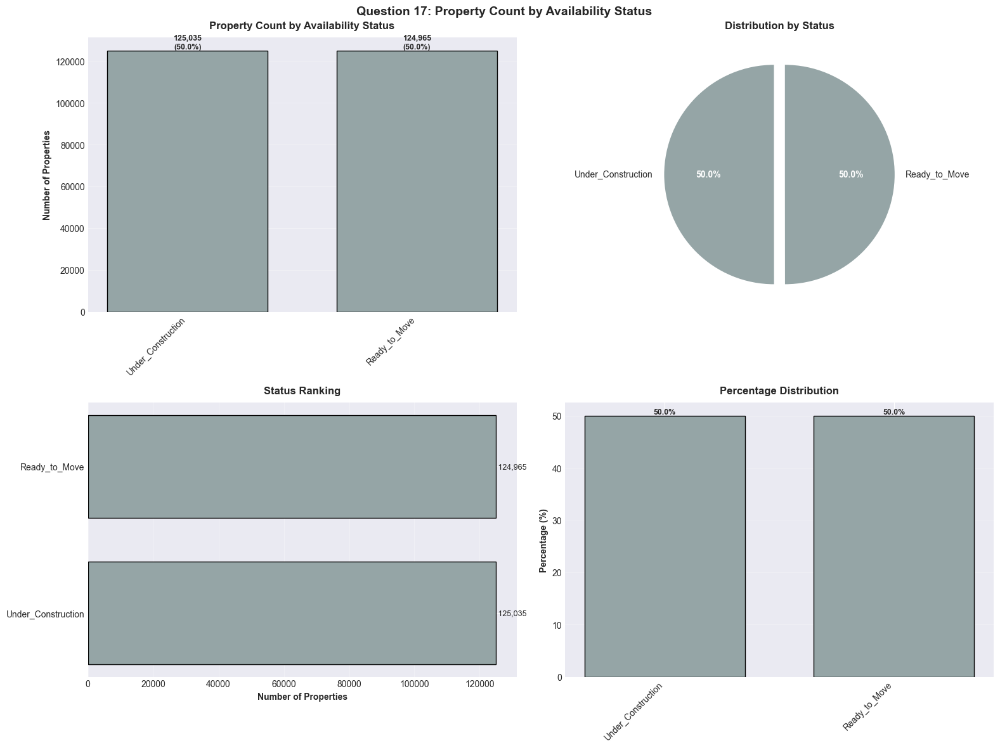

   ✅ All charts created!

📋 SUMMARY: PROPERTY COUNT BY AVAILABILITY STATUS

1️⃣ TOTAL PROPERTIES: 250,000

2️⃣ BREAKDOWN:
   1. Under_Construction: 125,035 (50.01%)
   2. Ready_to_Move: 124,965 (49.99%)

3️⃣ KEY FINDINGS:
   • Most common: Under_Construction (125,035 properties)
   • Least common: Ready_to_Move (124,965 properties)

4️⃣ MARKET INSIGHTS:

5️⃣ RECOMMENDATIONS:
   FOR BUYERS:
   • Focus on 'Available' and 'Ready to Move' properties
   • 'Under Construction' may offer pre-launch discounts
   • Check project completion timelines

   FOR INVESTORS:
   • 'Under Construction' may appreciate more
   • 'Ready to Move' offers immediate rental income
   • Monitor market absorption rate

✅ Question 17 Complete!



In [33]:
"""
================================================================================
QUESTION 17: HOW MANY PROPERTIES ARE AVAILABLE UNDER EACH AVAILABILITY STATUS?
================================================================================
"""

print("="*80)
print("QUESTION 17: PROPERTY COUNT BY AVAILABILITY STATUS")
print("="*80)

# ============================================================================
# STEP 1: DATA VALIDATION
# ============================================================================

print("\n📊 Step 1: Validating Data...")

if 'Availability_Status' not in df.columns:
    print("   ❌ Availability_Status column not found")
    print(f"   Available columns: {df.columns.tolist()}")
else:
    print("   ✅ Availability_Status column exists")
    
    # Clean data
    df_clean = df['Availability_Status'].dropna()
    
    print(f"\n   Data Summary:")
    print(f"   • Total rows: {len(df):,}")
    print(f"   • Valid Availability_Status: {len(df_clean):,}")
    print(f"   • Missing: {df['Availability_Status'].isnull().sum():,}")
    
    # ========================================================================
    # STEP 2: COUNT BY AVAILABILITY STATUS
    # ========================================================================
    
    print("\n📊 Step 2: Counting Properties by Availability Status...")
    
    status_counts = df_clean.value_counts().sort_values(ascending=False)
    total = len(df_clean)
    
    print(f"\n   Property Count by Availability Status:")
    print(f"   {'-'*60}")
    print(f"   {'Status':<30} {'Count':>10} {'Percentage':>15}")
    print(f"   {'-'*60}")
    
    for status, count in status_counts.items():
        pct = count / total * 100
        print(f"   {status:<30} {count:>10,} {pct:>14.2f}%")
    
    print(f"   {'-'*60}")
    print(f"   {'TOTAL':<30} {total:>10,} {100.0:>14.2f}%")
    print(f"   {'-'*60}")
    
    # ========================================================================
    # STEP 3: VISUALIZATIONS
    # ========================================================================
    
    print("\n📊 Step 3: Creating Visualizations...")
    
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    fig.suptitle('Question 17: Property Count by Availability Status', 
                 fontsize=14, fontweight='bold')
    
    # Status-specific colors
    status_colors = {
        'Available': '#2ecc71',
        'Sold': '#e74c3c',
        'Under Construction': '#f39c12',
        'Ready to Move': '#3498db'
    }
    
    colors = [status_colors.get(status, '#95a5a6') for status in status_counts.index]
    
    # Chart 1: Bar Chart
    print("   Creating Chart 1: Bar Chart...")
    x_pos = np.arange(len(status_counts))
    bars = axes[0, 0].bar(x_pos, status_counts.values, color=colors, 
                          edgecolor='black', width=0.7)
    axes[0, 0].set_xticks(x_pos)
    axes[0, 0].set_xticklabels(status_counts.index, rotation=45, ha='right')
    axes[0, 0].set_ylabel('Number of Properties', fontweight='bold')
    axes[0, 0].set_title('Property Count by Availability Status', 
                        fontweight='bold', pad=10)
    axes[0, 0].grid(axis='y', alpha=0.3)
    
    # Add value labels
    for i, (val, pct) in enumerate(zip(status_counts.values, 
                                        status_counts.values/total*100)):
        axes[0, 0].text(i, val, f'{val:,}\n({pct:.1f}%)', 
                       ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    # Chart 2: Pie Chart
    print("   Creating Chart 2: Pie Chart...")
    wedges, texts, autotexts = axes[0, 1].pie(
        status_counts.values,
        labels=status_counts.index,
        autopct='%1.1f%%',
        colors=colors,
        startangle=90,
        explode=[0.05] * len(status_counts)
    )
    
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontweight('bold')
        autotext.set_fontsize(10)
    
    axes[0, 1].set_title('Distribution by Status', fontweight='bold', pad=10)
    
    # Chart 3: Horizontal Bar (sorted)
    print("   Creating Chart 3: Horizontal Bar...")
    y_pos = np.arange(len(status_counts))
    axes[1, 0].barh(y_pos, status_counts.values, color=colors, 
                    edgecolor='black', height=0.7)
    axes[1, 0].set_yticks(y_pos)
    axes[1, 0].set_yticklabels(status_counts.index)
    axes[1, 0].set_xlabel('Number of Properties', fontweight='bold')
    axes[1, 0].set_title('Status Ranking', fontweight='bold', pad=10)
    axes[1, 0].grid(axis='x', alpha=0.3)
    
    for i, val in enumerate(status_counts.values):
        axes[1, 0].text(val, i, f' {val:,}', va='center', fontsize=9)
    
    # Chart 4: Percentage Bar
    print("   Creating Chart 4: Percentage Bar...")
    percentages = (status_counts.values / total * 100)
    axes[1, 1].bar(x_pos, percentages, color=colors, edgecolor='black', width=0.7)
    axes[1, 1].set_xticks(x_pos)
    axes[1, 1].set_xticklabels(status_counts.index, rotation=45, ha='right')
    axes[1, 1].set_ylabel('Percentage (%)', fontweight='bold')
    axes[1, 1].set_title('Percentage Distribution', fontweight='bold', pad=10)
    axes[1, 1].grid(axis='y', alpha=0.3)
    
    for i, pct in enumerate(percentages):
        axes[1, 1].text(i, pct, f'{pct:.1f}%', 
                       ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    print("   ✅ All charts created!")
    
    # ========================================================================
    # STEP 4: SUMMARY
    # ========================================================================
    
    print("\n" + "="*80)
    print("📋 SUMMARY: PROPERTY COUNT BY AVAILABILITY STATUS")
    print("="*80)
    
    print(f"\n1️⃣ TOTAL PROPERTIES: {total:,}")
    
    print(f"\n2️⃣ BREAKDOWN:")
    for i, (status, count) in enumerate(status_counts.items(), 1):
        pct = count / total * 100
        print(f"   {i}. {status}: {count:,} ({pct:.2f}%)")
    
    most_common = status_counts.index[0]
    least_common = status_counts.index[-1]
    
    print(f"\n3️⃣ KEY FINDINGS:")
    print(f"   • Most common: {most_common} ({status_counts[most_common]:,} properties)")
    print(f"   • Least common: {least_common} ({status_counts[least_common]:,} properties)")
    
    print(f"\n4️⃣ MARKET INSIGHTS:")
    if 'Available' in status_counts.index:
        available_pct = status_counts.get('Available', 0) / total * 100
        print(f"   • {available_pct:.1f}% of properties available for purchase")
    
    if 'Sold' in status_counts.index:
        sold_pct = status_counts.get('Sold', 0) / total * 100
        print(f"   • {sold_pct:.1f}% already sold")
    
    if 'Under Construction' in status_counts.index:
        uc_pct = status_counts.get('Under Construction', 0) / total * 100
        print(f"   • {uc_pct:.1f}% under construction (pre-launch opportunities)")
    
    print(f"\n5️⃣ RECOMMENDATIONS:")
    print(f"   FOR BUYERS:")
    print(f"   • Focus on 'Available' and 'Ready to Move' properties")
    print(f"   • 'Under Construction' may offer pre-launch discounts")
    print(f"   • Check project completion timelines")
    
    print(f"\n   FOR INVESTORS:")
    print(f"   • 'Under Construction' may appreciate more")
    print(f"   • 'Ready to Move' offers immediate rental income")
    print(f"   • Monitor market absorption rate")
    
    print("\n" + "="*80)
    print("✅ Question 17 Complete!")
    print("="*80 + "\n")


In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load data
try:
    df = pd.read_csv('../data/raw/india_housing_prices.csv')
    print("✅ Data loaded successfully!")
    print(f"   Columns: {df.columns.tolist()}")
except:
    try:
        df = pd.read_csv('india_housing_prices.csv')
        print("✅ Data loaded successfully (local path)!")
    except:
        print("❌ ERROR: Could not find the file. Please check the path.")


✅ Data loaded successfully!
   Columns: ['ID', 'State', 'City', 'Locality', 'Property_Type', 'BHK', 'Size_in_SqFt', 'Price_in_Lakhs', 'Price_per_SqFt', 'Year_Built', 'Furnished_Status', 'Floor_No', 'Total_Floors', 'Age_of_Property', 'Nearby_Schools', 'Nearby_Hospitals', 'Public_Transport_Accessibility', 'Parking_Space', 'Security', 'Amenities', 'Facing', 'Owner_Type', 'Availability_Status']


✅ Parking_Space column found.

Average Price by Parking:
Parking_Space
No     254.429369
Yes    254.745492
Name: Price_in_Lakhs, dtype: float64


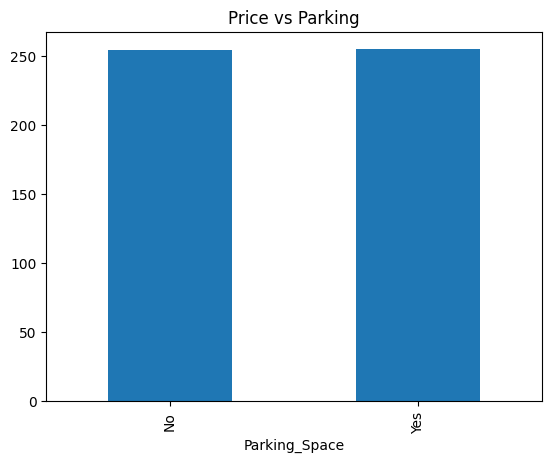

In [7]:
# Check if column exists
if 'Parking_Space' in df.columns:
    print("✅ Parking_Space column found.")
    
    # Run analysis
    parking_stats = df.groupby('Parking_Space')['Price_in_Lakhs'].mean()
    print("\nAverage Price by Parking:")
    print(parking_stats)
    
    # Plot
    parking_stats.plot(kind='bar', title='Price vs Parking')
    plt.show()
    
else:
    print("❌ ERROR: 'Parking_Space' column is missing.")
    print("Available columns:", df.columns.tolist())


QUESTION 19: IMPACT OF AMENITIES ON PRICE

📊 Step 1: Processing Amenities Data...


C:\Users\VSammiti\AppData\Local\Temp\ipykernel_3120\1465403019.py:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Amenities_Count'].fillna(0, inplace=True) # Handle empty rows


   ✅ Converted text list to 'Amenities_Count'

📊 Average Price/SqFt by Amenities Count:
Amenities_Count
1    0.13
2    0.13
3    0.13
4    0.13
5    0.13
Name: Price_per_SqFt, dtype: float64

📈 Correlation: 0.0020
💡 Insight: No significant link found.

🎨 Creating Charts...


C:\Users\VSammiti\AppData\Local\Temp\ipykernel_3120\1465403019.py:59: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Amenities_Count', y='Price_per_SqFt', data=data_q19, ax=axes[1], palette='Greens')


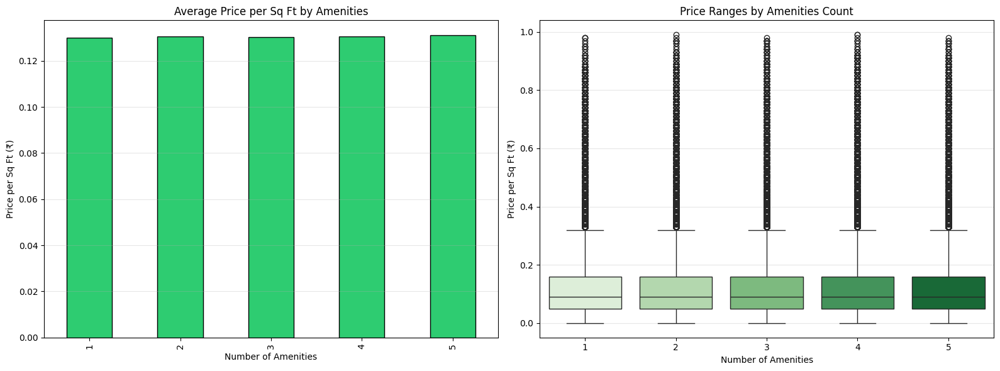

✅ Question 19 Complete!


In [8]:
print("="*80)
print("QUESTION 19: IMPACT OF AMENITIES ON PRICE")
print("="*80)

# 1. Feature Engineering: Create 'Amenities_Count'
# -------------------------------------------------------
print("\n📊 Step 1: Processing Amenities Data...")

if 'Amenities' in df.columns:
    # Check if the column is text (object) or numbers
    if df['Amenities'].dtype == 'object':
        # It is text (e.g., "Gym, Pool"). Count the items.
        # We count commas and add 1. (e.g., "A, B" has 1 comma, but 2 items)
        df['Amenities_Count'] = df['Amenities'].str.count(',') + 1
        df['Amenities_Count'].fillna(0, inplace=True) # Handle empty rows
        print("   ✅ Converted text list to 'Amenities_Count'")
    else:
        # It is already a number
        df['Amenities_Count'] = df['Amenities']
        print("   ✅ Amenities are already numeric")
else:
    print("❌ Error: 'Amenities' column not found.")

# 2. Analysis
# -------------------------------------------------------
# Create a clean dataset for analysis
data_q19 = df[['Amenities_Count', 'Price_per_SqFt']].dropna()

# Calculate average price per sq ft for each amenity count
amenity_stats = data_q19.groupby('Amenities_Count')['Price_per_SqFt'].mean()

print("\n📊 Average Price/SqFt by Amenities Count:")
print(amenity_stats.round(2))

# Correlation
corr = data_q19['Amenities_Count'].corr(data_q19['Price_per_SqFt'])
print(f"\n📈 Correlation: {corr:.4f}")

if corr > 0.3:
    print("💡 Insight: Strong Positive link. More amenities = Higher Value.")
elif corr > 0.1:
    print("💡 Insight: Weak Positive link. Amenities add some value.")
else:
    print("💡 Insight: No significant link found.")

# 3. Visualization
# -------------------------------------------------------
print("\n🎨 Creating Charts...")
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Chart 1: Bar Chart (Average Price)
amenity_stats.plot(kind='bar', ax=axes[0], color='#2ecc71', edgecolor='black')
axes[0].set_title('Average Price per Sq Ft by Amenities')
axes[0].set_xlabel('Number of Amenities')
axes[0].set_ylabel('Price per Sq Ft (₹)')
axes[0].grid(axis='y', alpha=0.3)

# Chart 2: Box Plot (Distribution)
sns.boxplot(x='Amenities_Count', y='Price_per_SqFt', data=data_q19, ax=axes[1], palette='Greens')
axes[1].set_title('Price Ranges by Amenities Count')
axes[1].set_xlabel('Number of Amenities')
axes[1].set_ylabel('Price per Sq Ft (₹)')
axes[1].grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()
print("✅ Question 19 Complete!")


In [10]:
print("🔍 Searching for Transport columns...")
transport_cols = [col for col in df.columns if 'trans' in col.lower() or 'access' in col.lower()]

if transport_cols:
    print(f"✅ Found similar columns: {transport_cols}")
else:
    print("❌ No transport-related columns found!")
    print("Available columns:", df.columns.tolist())


🔍 Searching for Transport columns...
✅ Found similar columns: ['Public_Transport_Accessibility']


✅ Found column: 'Public_Transport_Accessibility'

📊 Average Price per Sq Ft by Transport Score:
Public_Transport_Accessibility
High      0.13
Low       0.13
Medium    0.13
Name: Price_per_SqFt, dtype: float64


C:\Users\VSammiti\AppData\Local\Temp\ipykernel_3120\2867643764.py:26: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=transport_col, y='Price_per_SqFt', data=data_q20, palette='Purples')


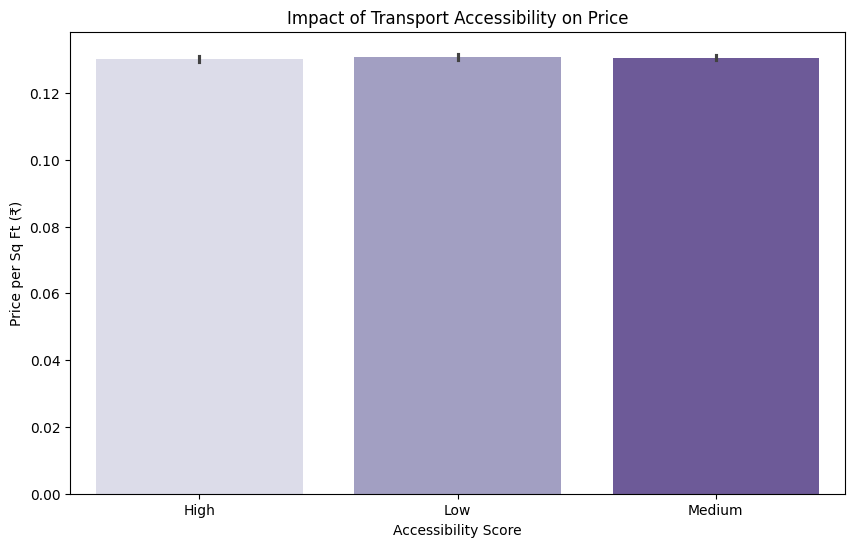

In [11]:
# =========================================================
# QUESTION 20: PUBLIC TRANSPORT VS PRICE (SAFE MODE)
# =========================================================

# 1. Define the column name (Replace this if the diagnostic found a different name)
transport_col = 'Public_Transport_Accessibility' 

# If diagnostic found something else (e.g., 'Transport_Score'), change it here:
# transport_col = 'Transport_Score' 

if transport_col in df.columns:
    print(f"✅ Found column: '{transport_col}'")
    
    # 2. Clean Data
    data_q20 = df[[transport_col, 'Price_per_SqFt']].dropna()
    
    # 3. Calculate Stats
    print("\n📊 Average Price per Sq Ft by Transport Score:")
    print(data_q20.groupby(transport_col)['Price_per_SqFt'].mean().round(2))
    
    # 4. Plot
    import matplotlib.pyplot as plt
    import seaborn as sns
    
    plt.figure(figsize=(10, 6))
    sns.barplot(x=transport_col, y='Price_per_SqFt', data=data_q20, palette='Purples')
    plt.title('Impact of Transport Accessibility on Price')
    plt.xlabel('Accessibility Score')
    plt.ylabel('Price per Sq Ft (₹)')
    plt.show()
    
else:
    print(f"❌ ERROR: Column '{transport_col}' not found.")
    print("👉 Please run STEP 1 above to find the correct name.")
